# **Telco Customer Churn**


## **Abstract:**
The primary goal of this notebook is to understand what a Random Forest method is and how it performs on classification models.

Random Forest Classifier is a popular ensemble modeling strategy for dealing with binary classification problems. 

Random Forest is a popular ensemble learning algorithm used for both classification and regression tasks. It is an extension of decision trees, which works by constructing multiple decision trees at training time and outputting the class that is the mode of the classes (classification) or mean prediction (regression) of the individual trees. Each tree is constructed using a different subset of the training data and a different subset of features at each node. This randomness ensures that the forest model doesn't overfit on the training data and generalizes well on the unseen data. The algorithm is also known for its high accuracy, stability, and scalability.



## **Aim:**

Random Forest is an ensemble learning method for classification, regression, and other tasks that operate by constructing a multitude of decision trees at training time and outputting the class that is the mode of the classes (classification) or mean prediction (regression) of the individual trees. Random Forest is an extension of decision trees which reduce overfitting in decision trees.

In Random Forest Classifier, the basic idea is to use multiple decision trees (the "forest") and combine their output to get a final result that is more accurate and stable than a single decision tree. Randomness is introduced in the algorithm by selecting a subset of features and a subset of data points at random to create each decision tree. Each tree is trained on a different subset of the data, and the final classification is based on the mode of the classifications of the individual trees. Random Forests have a number of advantages over single decision trees, including reduced variance, increased accuracy, and the ability to handle a large number of variables with relatively small sample sizes.

Random Forest's Key Characteristics

**Diversity:** When creating an individual tree, not all attributes/variables/features are evaluated; each tree is unique. 
**Immune to the curse of dimensionality:** The feature space is minimized because each tree does not consider all of the features.
**Parallelization:** Each tree is built independently from various data and properties. This means we can completely utilize the CPU to construct random forests.
**Train-Test split:** In a random forest, we don't need to separate the data for train and test because the decision tree will always miss 30% of the data.
**Stability:** Stability emerges as a result of the result being based on majority voting/averaging.



**Important Random Forest Hyperparameters**

Hyperparameters are used in random forests to either improve model performance and predictive power or to speed up the model.
Predictive Power Boosting Hyperparameters

n_estimators: The number of trees built by the algorithm before averaging the predictions.

max_features: The maximum number of features considered by random forest while splitting a node.

mini_sample_leaf: Counts the number of leaves needed to separate an internal node.

criterion: How should each tree's node be split? (Log Loss/Entropy/Gini impurity)

max_leaf_nodes: The number of leaf nodes in each tree.



**Hyperparameters to Increase the Speed**

n_jobs: it tells the engine how many processors it is allowed to use. If the value is 1, it can use only one processor, but if the value is -1, there is no limit.

random_state:controls randomness of the sample. The model will always produce the same results if it has a definite value of random state and has been given the same hyperparameters and training data.

oob_score: OOB means out of the bag. It is a random forest cross-validation method. In this, one-third of the sample is not used to train the data; instead used to evaluate its performance. These samples are called out-of-bag samples.

The data set includes information about:

* Customers who left within the last month – the column is called Churn
* Services that each customer has signed up for – phone, multiple lines, internet, online security, online backup, device protection, tech support, and streaming TV and movies
* Customer account information – how long they’ve been a customer, contract, payment method, paperless billing, monthly charges, and total charges
* Demographic info about customers – gender, age range, and if they have partners and dependents

In [1]:
# Importing all libraries necessary for the assignment
!pip install shap
!pip install lime
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install fitter


import shap
import lime
from lime import lime_tabular
import sklearn
from sklearn.model_selection import train_test_split
import random
from sklearn.ensemble import RandomForestRegressor
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
from fitter import Fitter, get_common_distributions, get_distributions

plt.rcParams["figure.figsize"] = (16, 12)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Importing a variety of Python libraries for data analysis and modeling. Here's a brief summary of each library:

- **shap:** SHapley Additive exPlanations is a prominent technique for describing machine learning model output. This technique is implemented in the SHAP library for a variety of models.
- **lime:** LIME (Local Interpretable Model-Agnostic Explanations) is another prominent strategy for describing the output of machine learning models. This technique is implemented in the LIME library for a variety of models.
- **tabulate:** A library for creating formatted tables in Python.
- **colorama:** A library for coloring text in the terminal.
- **future:** A library for compatibility with Python 3's print function.
- **h2o:** An open-source machine learning platform that offers a variety of machine learning algorithms and data analysis tools.
- **fitter:** A library for fitting and comparing probability distributions to data.

The rest of the libraries you're importing are standard Python libraries, including **sklearn** (for machine learning), **random** (for generating random numbers), **matplotlib** (for data visualization), **pydot** (for visualizing decision trees), **datetime** (for working with dates and times), **logging** (for logging messages), **csv** (for working with CSV files), **optparse** (for parsing command-line arguments), **time** (for working with time), **json** (for working with JSON data), **psutil** (for system monitoring), and **numpy** (for numerical operations).

In [2]:
# load the data
data_churn = pd.read_csv("https://raw.githubusercontent.com/AnusreeMyneni/002709300_Anusree-Myneni_Auto-ML/main/telco-customer-churn.csv")
data_churn.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


Loading data from a CSV file using pandas, and then displaying the first few rows of the data using the **head()** method. 

The data appears to be related to a telecommunications company and includes information about customer churn (whether or not a customer left the company) and various customer attributes such as contract type, internet service, monthly charges, and more.

In [3]:
col = data_churn.columns
print("------------------- Numeric field ----------------------\n")
for i in range(len(col)):
    if data_churn[col[i]].dtypes!=object:
        print("unique number of {} ---> {}".format(col[i], len(data_churn[col[i]].unique())))
        
print("\n------------------ Categorical field -----------------------\n")
for i in range(len(col)):
    if data_churn[col[i]].dtypes==object:
        print("unique number of {} ---> {}".format(col[i], len(data_churn[col[i]].unique())))

------------------- Numeric field ----------------------

unique number of SeniorCitizen ---> 2
unique number of tenure ---> 73
unique number of MonthlyCharges ---> 1585

------------------ Categorical field -----------------------

unique number of customerID ---> 7043
unique number of gender ---> 2
unique number of Partner ---> 2
unique number of Dependents ---> 2
unique number of PhoneService ---> 2
unique number of MultipleLines ---> 3
unique number of InternetService ---> 3
unique number of OnlineSecurity ---> 3
unique number of OnlineBackup ---> 3
unique number of DeviceProtection ---> 3
unique number of TechSupport ---> 3
unique number of StreamingTV ---> 3
unique number of StreamingMovies ---> 3
unique number of Contract ---> 3
unique number of PaperlessBilling ---> 2
unique number of PaymentMethod ---> 4
unique number of TotalCharges ---> 6531
unique number of Churn ---> 2


The code above displays the number of unique values for each column in a dataset. The code first stores the names of all the columns to the 'columns' variable before looping through each column and determining whether the data type is numeric or categorical using the 'dtypes' property.

If the data type is numeric, it outputs the number of unique values in the column and the number of elements in the resulting array using the 'unique()' function and the 'len()' function.

If the data type is categorical (i.e. an object), the same approach is used to output the number of unique values in the column.

This is a quick approach to see the range and distribution of values in a dataset, as well as discover any potential issues with the data, such as missing numbers or unexpected data types.

In [4]:
#summary of the dataset
data_churn.describe()

,SeniorCitizen,tenure,MonthlyCharges
count,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692
std,0.368612,24.559481,30.090047
min,0.000000,0.000000,18.250000
25%,0.000000,9.000000,35.500000
50%,0.000000,29.000000,70.350000
75%,0.000000,55.000000,89.850000
max,1.000000,72.000000,118.750000


Using pandas' **describe()** method, provide a summary of the dataset. However, the dataset name you're using (**data_churn**) does not match the dataset name you loaded earlier (**data_churn**). 

Assuming you wanted to utilize the **data_churn** dataset, the **describe()** method does the following:

The **describe()** method returns a summary of the dataset's statistical attributes for each numerical column, including the count, mean, standard deviation, minimum and maximum values, and quartile values. This can help provide an overall impression of the data and detect any potential outliers or data concerns.

In [5]:
columns = list(data_churn.columns)
print(columns)  # Name of all predictors and result

['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure', 'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn']


This can be done using the columns attribute of a pandas dataframe, which returns a list of all column names.

This can be helpful for getting an overview of the features available in the dataset.

In [6]:
# Checking if any missings values exists in the dataset
data_churn.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

Using the **isnull()** method in pandas to check for missing values in the **data_churn** dataset. 

The **isnull()** method checks a pandas dataframe for missing or null values and produces a boolean dataframe with **True** indicating the presence of a missing value and **False** indicating no missing value. The **sum()** method then counts the number of missing values in each dataframe column.
This can be useful for spotting any missing values that must be addressed prior to modeling the data.

In [7]:
# Checking any empty cells exists in the dataset
len(data_churn.loc[data_churn["TotalCharges"]==" "])

11

Checking the 'TotalCharges' column of the 'data_telco' dataset for empty cells.
 
'data_churn.loc[data_churn["TotalCharges"]==" "] in this code snippet' retrieves all rows in the 'data_telco' dataset where the 'TotalCharges' column value is an empty string (i.e., " "). The 'len()' function then counts the number of rows that satisfy this criterion.
This can be useful for identifying missing values that are not represented as 'NaN' or 'None' but rather as empty strings or other special characters.


In [8]:
# Finding the empty rows in the dataset in specific column 
data_churn.loc[data_churn["TotalCharges"]==" "]

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,...,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,...,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,,No


'data_churn["TotalCharges"] == " "' generates a boolean series that is 'True' if the 'TotalCharges' column is empty, and 'False' otherwise. When this boolean series is used as an index in 'data_churn.loc,' it returns only the rows when the condition is 'True'.

Identifying empty rows in a dataset can help with missing value handling and guaranteeing the accuracy of analyses that rely on complete data.

In [9]:
# Converting "TotalCharges" to a numerical data type
data_churn['TotalCharges'] = pd.to_numeric(data_churn['TotalCharges'], errors='coerce')

The 'pd.to_numeric()' method converts a pandas dataframe column to a numeric data type (either 'int' or 'float'). Using the 'errors='coerce'' parameter, 'pd.to_numeric(data_churn['TotalCharges'], errors='coerce')' converts the 'TotalCharges' column to a numeric data type, with any values that cannot be converted assigned to 'NaN'.

Converting the 'TotalCharges' column to a numeric data type will aid with numerical analyses and modeling on this variable.

In [10]:
# Replaced with NaN values and displaying the updated rows
data_churn[data_churn['TotalCharges'].isnull()]

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,NaN,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,NaN,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,...,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,NaN,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,NaN,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,NaN,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,NaN,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,NaN,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,NaN,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,NaN,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,...,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,NaN,No


'data_churn['TotalCharges'].isnull()' in this code snippet generates a boolean series that is 'True' when the 'TotalCharges' column is 'NaN' and 'False' otherwise. When this boolean series is used as an index in 'data_churn,' it only returns rows where the 'TotalCharges' column is 'NaN'.

Replacing missing values with 'NaN' can help with missing value management and ensuring the accuracy of studies that rely on complete data. It also enables us to impute or fill in missing information through the use of various techniques such as mean imputation and regression imputation.

In [11]:
data_churn.dropna(inplace=True)

Dropping rows with missing values from the `data_telco` dataset using the `dropna()` method in pandas.

The `dropna()` method is used to remove rows or columns from a pandas dataframe that contain missing values (i.e., `NaN`). In this code snippet, `data_churn.dropna(inplace=True)` drops any rows that contain missing values from the `data_churn` dataframe, and modifies the `data_churn` dataframe in place (i.e., the original dataframe is changed and no copy is returned).

Dropping rows with missing values can be helpful for handling missing values, but it can also result in a loss of data if there are a large number of missing values. It's important to consider the impact of dropping missing values on the analysis or model being performed, and to consider other techniques for handling missing values such as imputation.

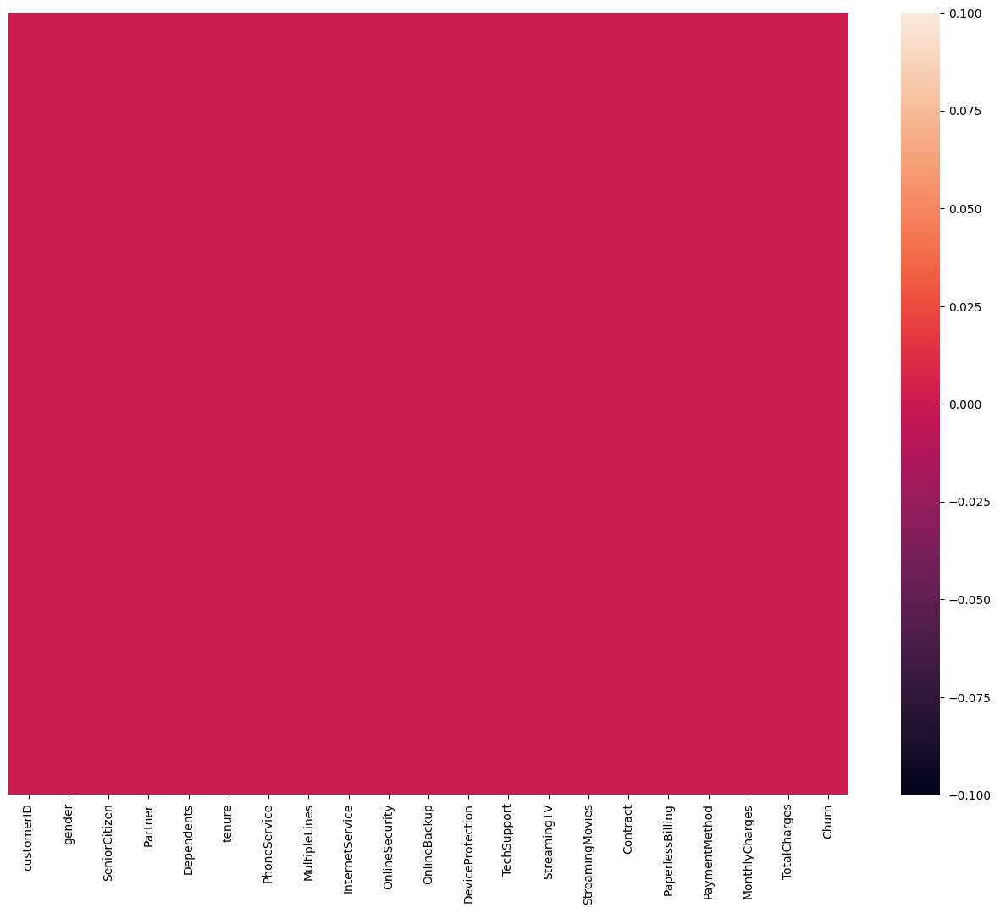

In [12]:
# Visualizing through heatmap whether any missing values available in the dataset
heat_map = sns.heatmap(data_churn.isnull(),yticklabels=False)

sns.heatmap(data_churn.isnull(),yticklabels=False) creates a heatmap of the data_churn dataframe where each missing value is represented as a white square. The yticklabels=False argument is used to turn off the y-axis tick labels in the heatmap.

Creating a heatmap of missing values can be helpful for quickly identifying the extent and location of missing values in a dataset. By seeing the above plot we can say that there are no missing values in the dataset.

In [13]:
#Remove customer IDs column from the data set
data_churn.drop("customerID",inplace=True,axis=1)

Removing the customerID column from the data_churn dataset using the drop() method in pandas.

The drop() method is used to remove rows or columns from a pandas dataframe. In this code snippet, data_churn.drop("customerID",inplace=True,axis=1) drops the customerID column from the data_churn dataframe and modifies the dataframe in place (i.e., the original dataframe is changed and no copy is returned).

It's important to carefully consider the impact of removing columns from the dataset and to ensure that important information is not lost in the process.

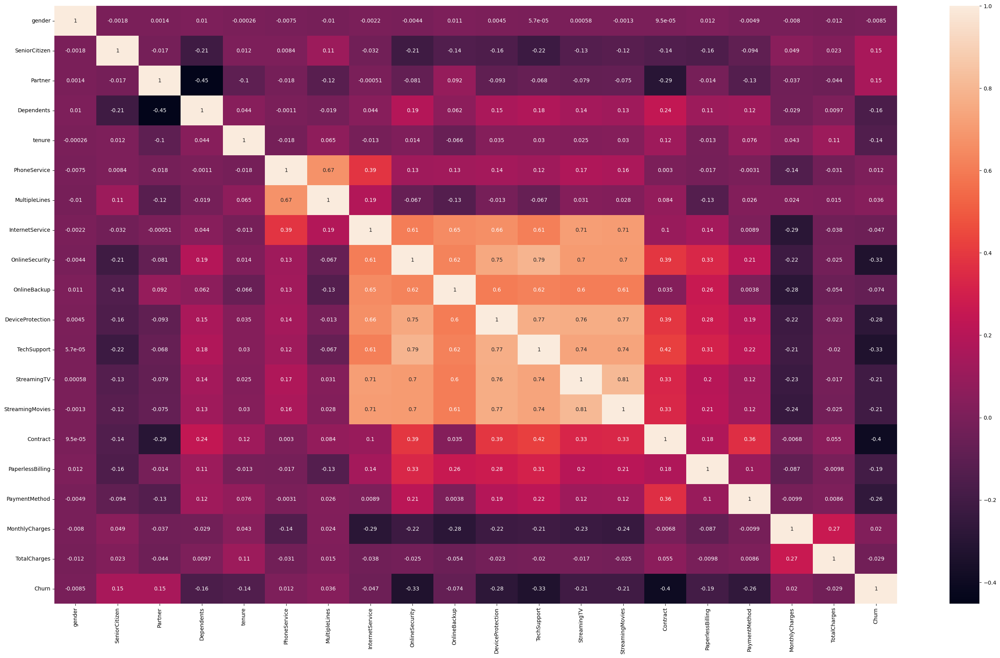

In [14]:
# plot the correlation
plt.figure(figsize=(35, 20))

corr_plot = data_churn.apply(lambda z: pd.factorize(z)[0]).corr()

p = sns.heatmap(corr_plot, xticklabels=corr_plot.columns, yticklabels=corr_plot.columns, annot=True)

Plotting the correlation matrix to understand the relationships between the variables in the dataset and identifying potential multicollinearity concerns that may impair model accuracy.

Variables with high correlations include internet_service, online_security, onlinebackup, deviceprotection, techsupport, streamingtv, and streamingmovies.
This is an intriguing correlation plot since it demonstrates that consumers who purchase one add-on, such as OnlineSecurity, are also likely to purchase tech assistance, streamingTV, and so on.

The faint tint in the center indicates that people prefer to opt in for more than one add-on at the same time.

And, given that opting out of OnlineSecurity and TechSupport is heavily connected with churning, there may be some link there.

# Data Exploration
Here exploring the data set, to better understand the patterns in the data and potentially form some hypothesis. First we will look at the distribution of individual variables and then slice and dice the data for any interesting trends.

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

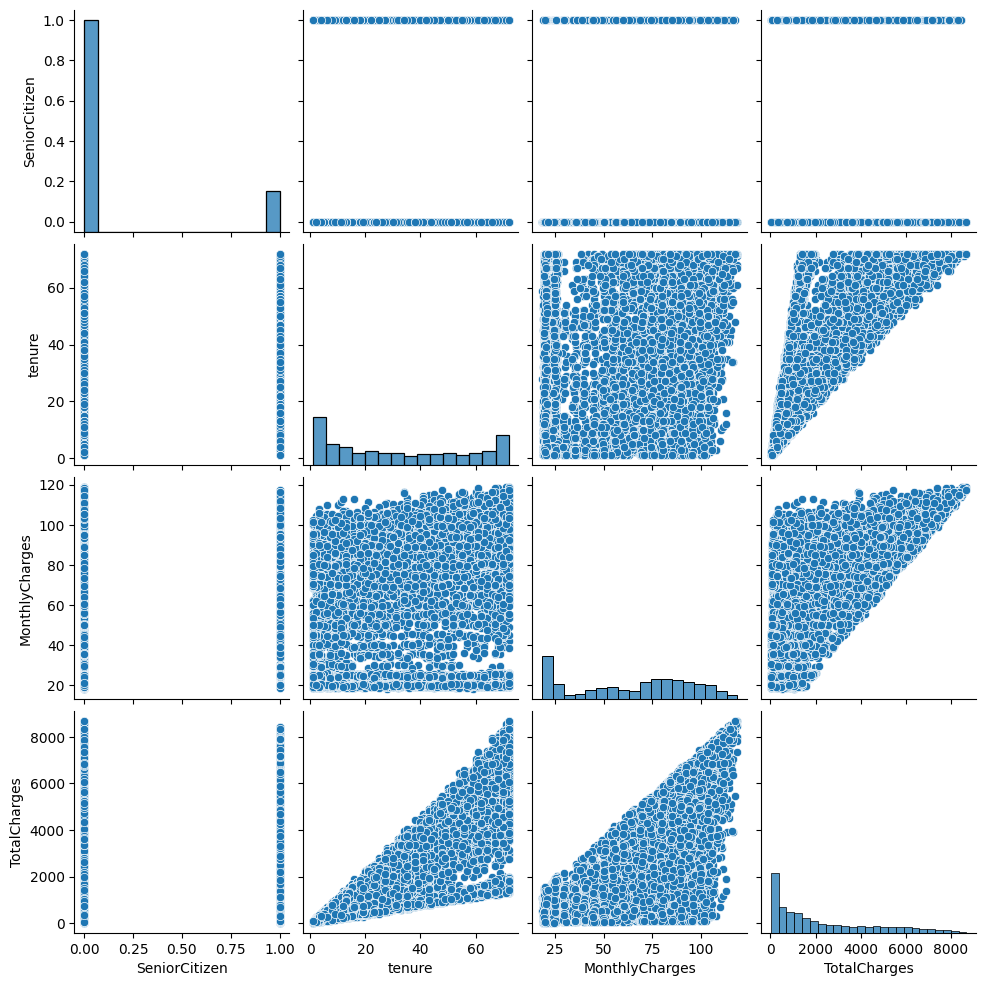

In [16]:
# All attributes are plotted against each other to see the pattern of distribution
sns.pairplot(data_churn)

The `sns.pairplot()` function used to plot pairwise relationships between all variables in a dataset. In this code snippet, `sns.pairplot(data_churn)` creates a matrix of scatter plots, where each scatter plot shows the relationship between two variables in the `data_churn` dataset. The diagonal of the matrix shows the distribution of each variable in the dataset.

This plot can be helpful for identifying patterns and relationships between variables, as well as for identifying potential outliers or other anomalies in the dataset. However, it can become difficult to read when the number of variables in the dataset is large.

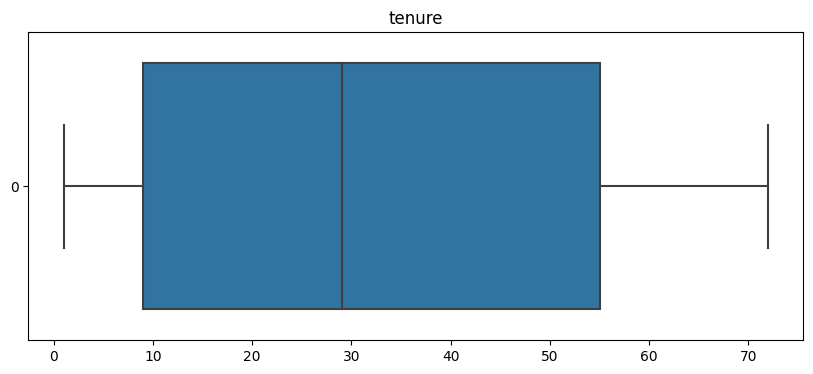

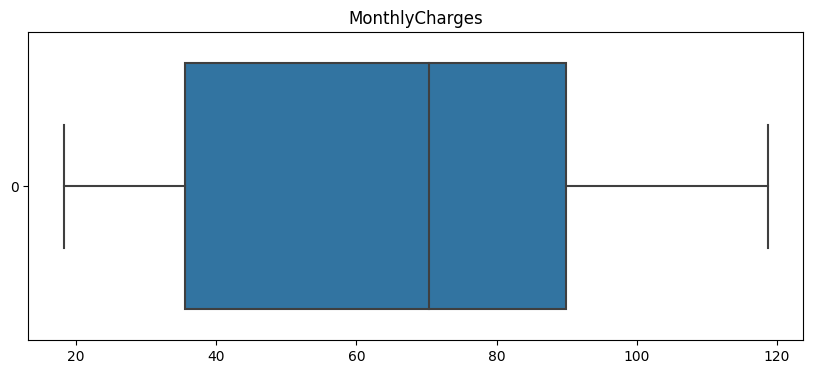

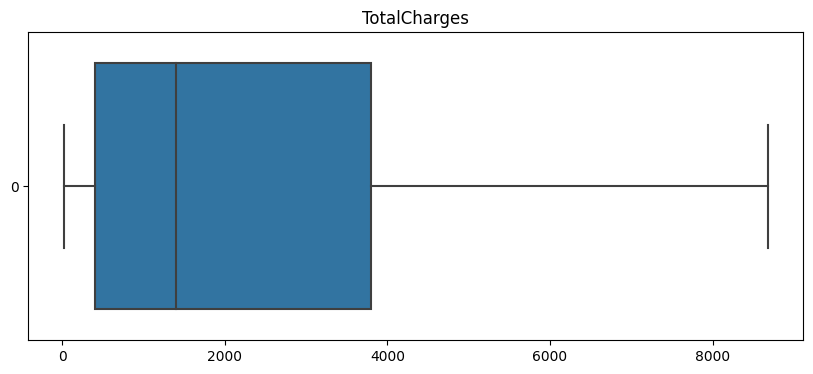

In [17]:
from statsmodels.graphics.gofplots import qqplot
num_col = ['tenure', 'MonthlyCharges', 'TotalCharges']

def Box_plots(df):
    plt.figure(figsize=(10, 4))
    plt.title(i)
    sns.boxplot(df, orient= "horizontal")
    plt.show()

for i in num_col:
    Box_plots(data_churn[i])

There are no evident outliers in the numerical variables.

<BarContainer object of 6 artists>

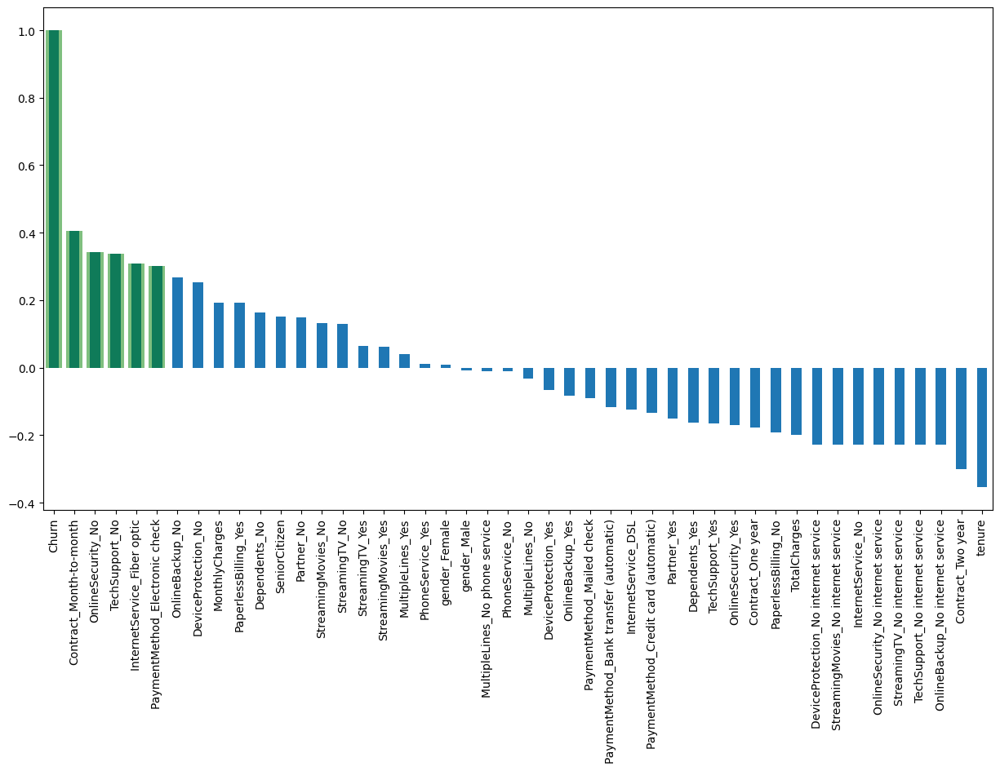

In [18]:
fig, ax = plt.subplots(figsize=(15, 8))
data_churn['Churn'].replace(to_replace='Yes', value=1, inplace=True)
data_churn['Churn'].replace(to_replace='No',  value=0, inplace=True)
churn_data_dummies = pd.get_dummies(data_churn)

dummies_sorted = churn_data_dummies.corr()['Churn'].sort_values(ascending = False)
df_dummies_sorted_desc = churn_data_dummies.corr()['Churn'].sort_values(ascending = True)

dummies_sorted.plot(kind='bar', label = True)

churn_dummies_strong = dummies_sorted.apply(lambda x :x if x>0.3 else None).dropna()
strong_above = churn_dummies_strong.index
churn_dummies_strong.dropna()

ax.bar(strong_above, churn_data_dummies.corr()['Churn'].loc[strong_above], color='green', alpha=0.5)

We can focus on values that have a strong association (correlation of +/- 0.3)

In [20]:
import plotly.express as px
fig = px.box(data_churn, x='Churn', y = 'tenure')

# Update yaxis properties
fig.update_yaxes(title_text='Tenure (Months)', row=1, col=1)
# Update xaxis properties
fig.update_xaxes(title_text='Churn', row=1, col=1)

# Update size and title
fig.update_layout(autosize=True, width=650, height=500,
    title_font=dict(size=23, family='Courier'),
    title='<b>Tenure vs Churn</b>',
)

fig.show()

We can see in the box plot above that there are not many outliers in the churn "No" column with respect to tenure, whereas there are a few in the churn "Yes" column.

0    5163
1    1869
Name: Churn, dtype: int64

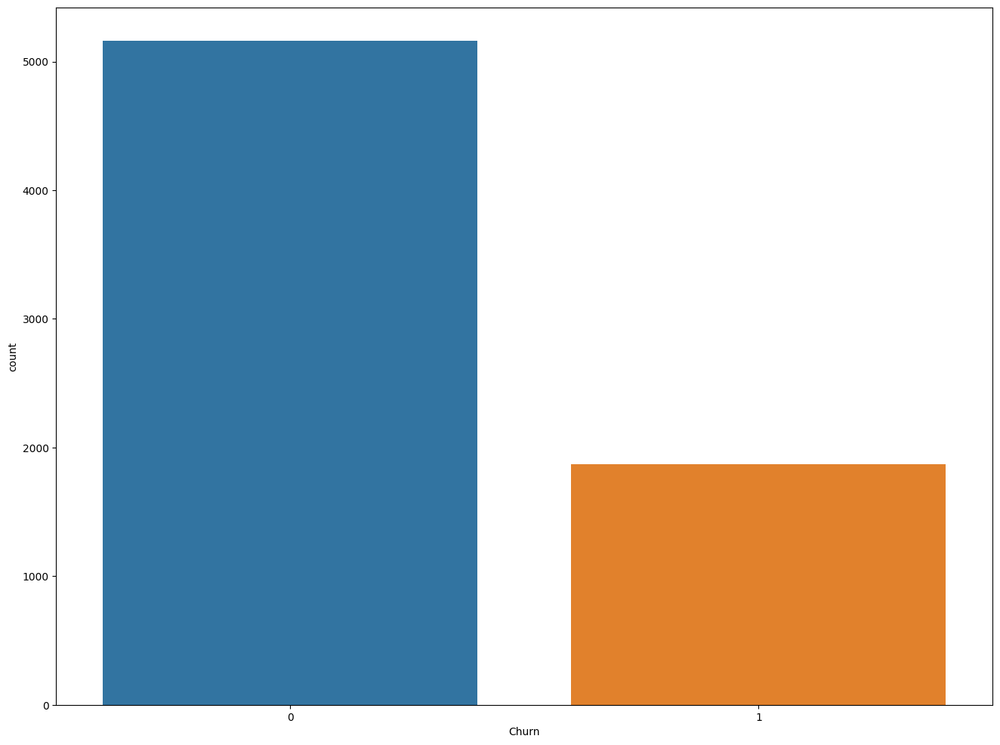

In [21]:
sns.countplot(x = "Churn", data = data_churn)
data_churn.loc[:, 'Churn'].value_counts()

This dataset is unequally distributed. The graphic above clearly illustrates this idea.

Imbalanced classification entails building prediction models on classification datasets with a high degree of class imbalance.
Working with imbalanced datasets presents the difficulty that most machine learning algorithms will overlook, and so perform poorly on, the minority class, despite the fact that performance on the minority class is often the most essential.

Oversampling the minority class that these algorithms create new instances synthesized from the old examples is one strategy to addressing imbalanced datasets. We employ five oversampling strategies in the following:

* RandomOverSampler
* SMOTE
* BorderlineSMOTE
* SVMSMOTE
* ADASYN

In [22]:
gender_labels = ['Male', 'Female']
category_labels = ['No', 'Yes']
# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=gender_labels, values=data_churn['gender'].value_counts(), name="Gender"),
              1, 1)
fig.add_trace(go.Pie(labels=category_labels, values=data_churn['Churn'].value_counts(), name="Churn"),
              1, 2)

# Use `hole` to create a pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name", textfont_size=16)

fig.update_layout(
    title_text="Gender and Churn Distributions",
    annotations=[dict(text='Gender', x=0.15, y=0.4, font_size=18, showarrow=False),
                 dict(text='Churn', x=0.84, y=0.5, font_size=18, showarrow=False)])
fig.show()


*   26.6 % of customers switched to another firm.
*   Customers are 49.5 % female and 50.5 % male.

NameError: ignored

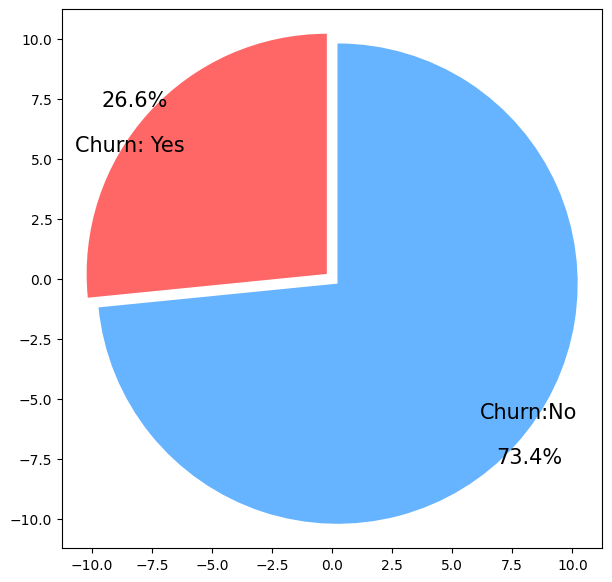

In [23]:
plt.figure(figsize=(7, 7))
labels =["Churn: Yes", "Churn:No"]
values = [1869,5163]
label_gender = ["F","M","F","M"]
size_gender = [939,930 , 2544,2619]
colors = ['#ff6666', '#66b3ff']
colors_gender = ['#c2c2f0','#ffb3e6', '#c2c2f0','#ffb3e6']
explode = (0.3,0.3) 
explode_gender = (0.1,0.1,0.1,0.1)
textprops = {"fontsize":15}
#Plot
plt.pie(values, labels=labels,colors=colors,autopct='%1.1f%%',pctdistance=1.08, counterclock = True, startangle=90,frame=True, explode=explode,radius=10, labeldistance=0.8, textprops =textprops, )
plt.pie(sizes_gender,labels=labels_gender,colors=colors_gender,startangle=90, explode=explode_gender,radius=7, textprops =textprops, counterclock = True, )
#Draw circle
centre_circle = plt.Circle((0,0),5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.title('Churn Distribution w.r.t Gender: Male(M), Female(F)', fontsize=15, y=1.1)

# show plot 
 
plt.axis('equal')
plt.tight_layout()
plt.show()

* There is negligible difference in customer percentage/ count who changed the service provider. Both genders behaved in similar fashion when it comes to migrating to another service provider/firm.

In [ ]:
fig = px.histogram(data_churn, x="Churn", color="Contract", barmode="group", title="<b>Customer Contract distribution<b>")
fig.update_layout(width=750, height=600, bargap=0.1)
fig.show()

* About 75% of customer with Month-to-Month Contract opted to move out as compared to 13% of customrs with One Year Contract and 3% with Two Year Contract

In [24]:
labels_churn = data_churn['PaymentMethod'].unique()
values_churn = data_churn['PaymentMethod'].value_counts()

fig = go.Figure(data=[go.Pie(labels=labels_churn, values=values_churn, hole=.3)])
fig.update_layout(title_text="<b>Payment Method Distribution</b>")
fig.show()

In [25]:
fig = px.histogram(data_churn, x="Churn", color="PaymentMethod", title="<b>Customer Payment Method distribution with respective Churn</b>")
fig.update_layout(width=800, height=600, bargap=0.1)
fig.show()

* Major consumers that left used Electronic Check as a payment method. 

* Customers who chose credit-card automatic transfer or bank automatic transfer and mailed check as their payment method were less likely to leave.

In [26]:
fig.add_trace(go.Bar(
  x = [['Churn:No', 'Churn:No', 'Churn:Yes', 'Churn:Yes'],
       ["Female", "Male", "Female", "Male"]],
  y = [965, 992, 219, 240],
  name = 'DSL',
))

fig.add_trace(go.Bar(
  x = [['Churn:No', 'Churn:No', 'Churn:Yes', 'Churn:Yes'],
       ["Female", "Male", "Female", "Male"]],
  y = [889, 910, 664, 633],
  name = 'Fiber_optic',
))

fig.add_trace(go.Bar(
  x = [['Churn:No', 'Churn:No', 'Churn:Yes', 'Churn:Yes'],
       ["Female", "Male", "Female", "Male"]],
  y = [690, 717, 56, 57],
  name = 'No_Internet',
))

fig.update_layout(title_text="<b>Churn Distribution with respective Internet Service and Gender</b>")

fig.show()

In [27]:
color_map = {"Yes": "#FF97FF", "No": "#AB63FA"}
fig = px.histogram(data_churn, x="Churn", color="Dependents", barmode="group", title="<b>Dependents distribution</b>", color_discrete_map=color_map)
fig.update_layout(width=800, height=600, bargap=0.1)
fig.show()

* Customers who do not have dependents are more prone to churn.

In [28]:
color_map = {"Yes": '#FFA15A', "No": '#00CC96'}
fig = px.histogram(data_churn, x="Churn", color="Partner", barmode="group", title="<b>Churn distribution with respective Partners</b>", color_discrete_map=color_map)
fig.update_layout(width=800, height=600, bargap=0.1)
fig.show()

* Customers who do not have partners are more prone to churn.

In [29]:
color_map = {"Yes": '#00CC96', "No": '#B6E880'}
fig = px.histogram(data_churn, x="Churn", color="SeniorCitizen", title="<b>Chrun distribution with respective Senior Citizen</b>", color_discrete_map=color_map)
fig.update_layout(width=800, height=600, bargap=0.1)
fig.show()

* It can be seen that the proportion of senior citizens is relatively little.
The majority of senior citizens leave.

In [30]:
color_map = {"Yes": "#FF97FF", "No": "#AB63FA"}
fig = px.histogram(data_churn, x="Churn", color="OnlineSecurity", barmode="group", title="<b>Churn with respective Online Security</b>", color_discrete_map=color_map)
fig.update_layout(width=800, height=600, bargap=0.1)
fig.show()

* In the lack of internet security, the majority of clients leave.

In [31]:
color_map = {"Yes": '#FFA15A', "No": '#00CC96'}
fig = px.histogram(data_churn, x="Churn", color="PaperlessBilling",  title="<b>Chrun distribution w.r.t. Paperless Billing</b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

* Customers with Paperless Billing are most likely prone to churn.

In [32]:
fig = px.histogram(data_churn, x="Churn", color="TechSupport",barmode="group",  title="<b>Chrun distribution with respective TechSupport</b>")
fig.update_layout(width=800, height=600, bargap=0.1)
fig.show()

* Customers who do not have TechSupport are more inclined to switch to another service provider.

In [33]:
color_map = {"Yes": '#00CC96', "No": '#B6E880'}
fig = px.histogram(data_churn, x="Churn", color="PhoneService", title="<b>Chrun distribution with respective Phone Service</b>", color_discrete_map=color_map)
fig.update_layout(width=800, height=600, bargap=0.1)
fig.show()

* A very tiny percentage of consumers do not have phone service, and of those, one-third are more likely to churn.

In [34]:
list1 = ['gender','SeniorCitizen','Partner','Dependents'] # Customer Information
list2 = ['PhoneService','MultipleLines','InternetService','StreamingTV','StreamingMovies',
      'OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport'] # Services Signed Up
list3 = ['Contract','PaperlessBilling','PaymentMethod'] # Payment Information

# *Categorical variables vs tenure*

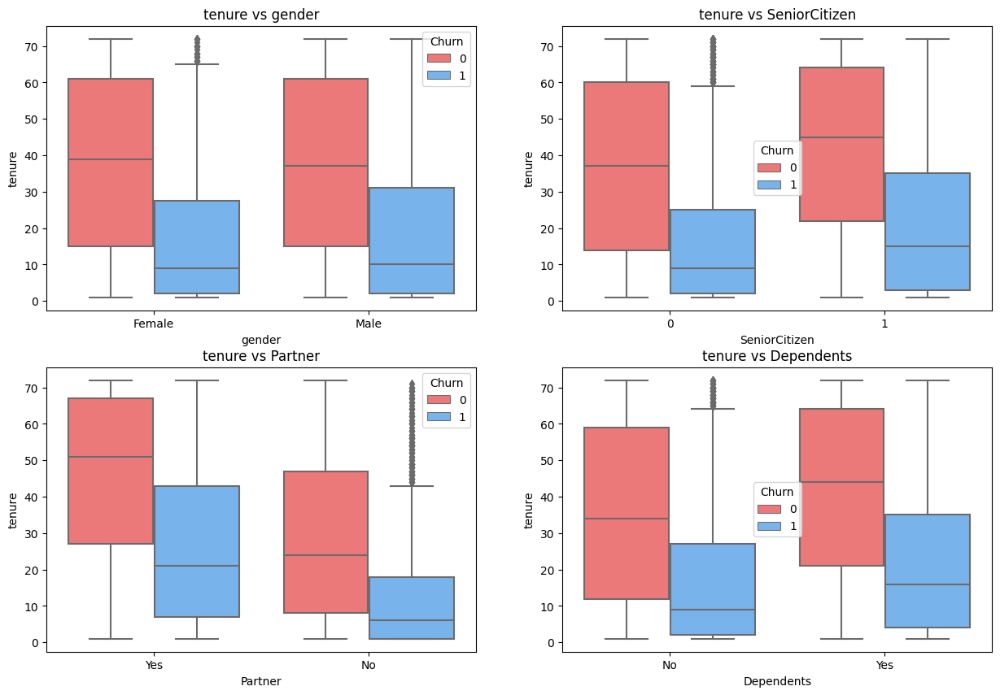

In [35]:
fig = plt.subplots(nrows = 2,ncols = 2,figsize = (15,10))
for i in range(4):
    plt.subplot(2,2,i+1)
    ax = sns.boxplot(x = list1[i],y = 'tenure',data = data_churn,hue = 'Churn',palette = colors);
    plt.title('tenure vs ' + list1[i]);

Some intriguing findings: 
* Not having a relationship makes you more likely to churn sooner than those who do have a partner; 
* Senior people stay longer on average; 
* Those with dependents stay longer; and 
* Male/Female is almost equal.

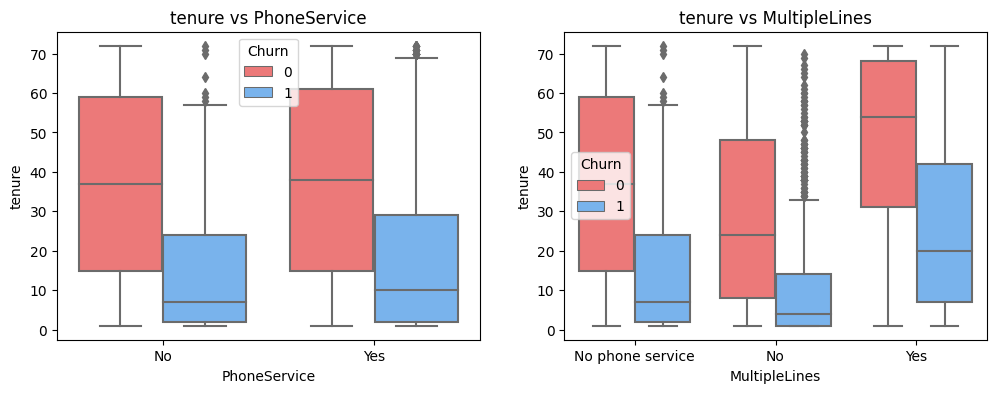

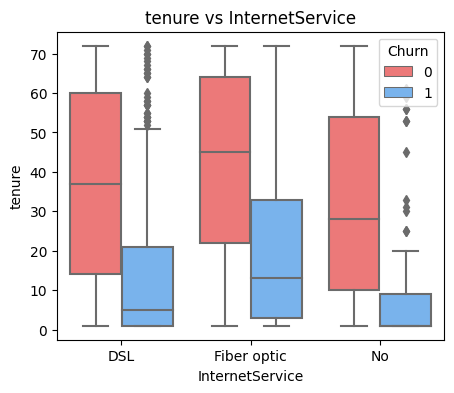

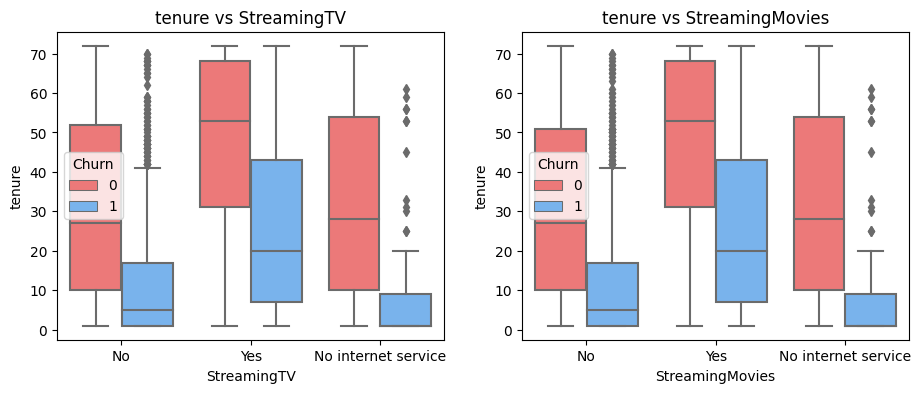

In [36]:
fig = plt.subplots(nrows = 1,ncols = 2,figsize = (12,4))

for i in range(len(list2[0:2])):
    plt.subplot(1,2,i + 1)
    ax = sns.boxplot(x = list2[i],y = 'tenure',data = data_churn,hue = 'Churn',palette = colors);
    plt.title('tenure vs ' + list2[i]);

fig = plt.subplots(nrows = 1, ncols = 1, figsize = (5,4))

plt.subplot(1,1,1)
ax = sns.boxplot(x = list2[2],y = 'tenure',data = data_churn,hue = 'Churn',palette = colors);
plt.title('tenure vs ' + list2[2]);
    
fig = plt.subplots(nrows = 1,ncols = 2,figsize = (11,4))

for i in range(len(list2[3:5])):
    plt.subplot(1,2,i + 1)
    ax = sns.boxplot(x = list2[i + 3],y = 'tenure',data = data_churn,hue = 'Churn',palette = colors);
    plt.title('tenure vs ' + list2[i + 3]);

Confirming my previous thoughts, opting in for more services correlates with users staying longer and churning later than those who do not opt in.

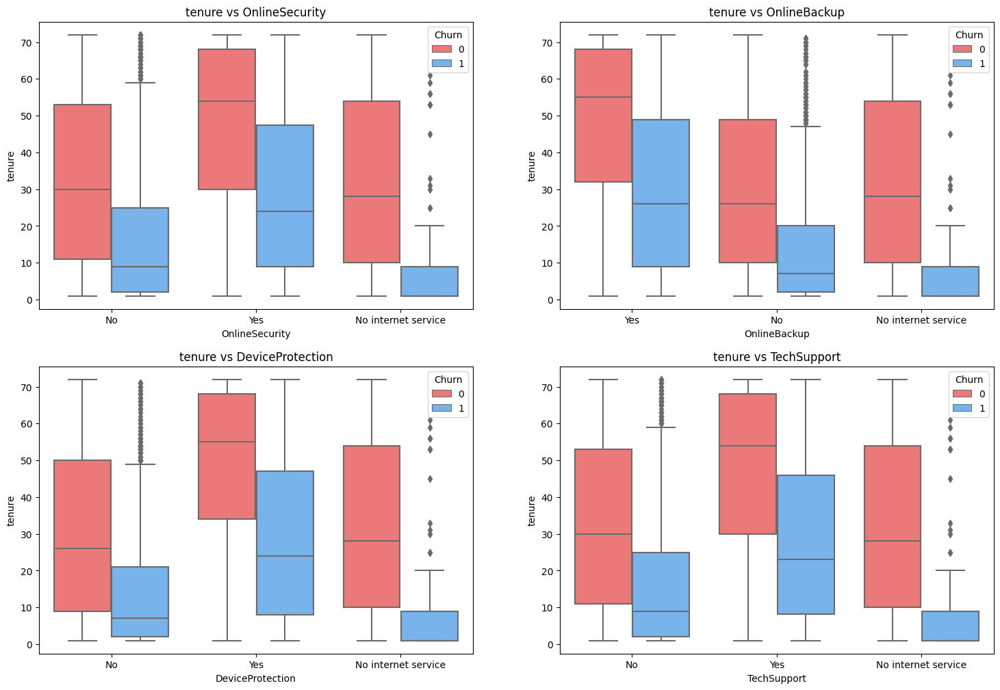

In [37]:
fig = plt.subplots(nrows = 2,ncols = 2,figsize = (18,12))
for i in range(len(list2[-4:])):
    plt.subplot(2,2,i + 1)
    ax = sns.boxplot(x = list2[i - 4],y = 'tenure',data = data_churn, hue = 'Churn',palette = colors);
    plt.title('tenure vs ' + list2[i-4]);

Additional bundles contributes to users staying for longer

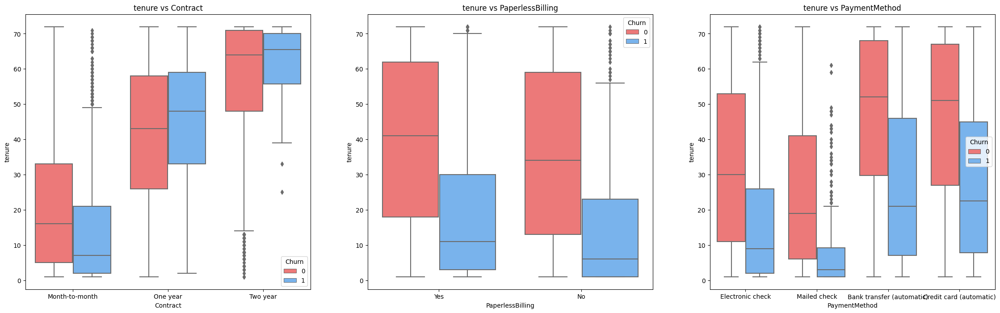

In [38]:
fig = plt.subplots(nrows = 1,ncols = 3,figsize = (28,8))
for i in range(len(list3)):
    plt.subplot(1,3,i + 1)
    ax = sns.boxplot(x = list3[i],y = 'tenure',data = data_churn, hue = 'Churn', palette = colors);
    plt.title('tenure vs ' + list3[i]);

* Obtaining a two-year contract is strongly associated to users remaining longer. As we can see from the first graph, consumers avoid breaking their contracts and so stay for at least 24 months. Users tend to churn out in their respective inter-quartile ranges over a year and month-to-month, with their churning encompassing the entire range.
* Failure to use paperless billing resulted in a slightly higher churn rate at first. 
* Electronic check and mailed check have half the median churn rate of bank transfer and credit card.

## Categorical variables vs tenure

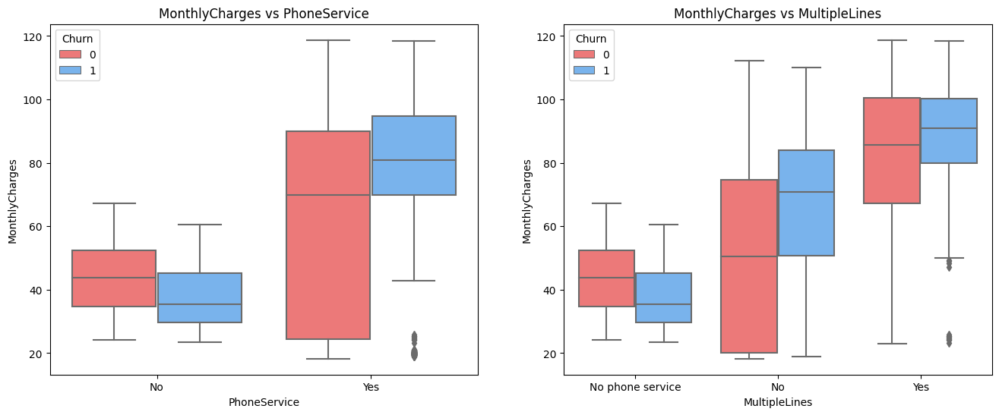

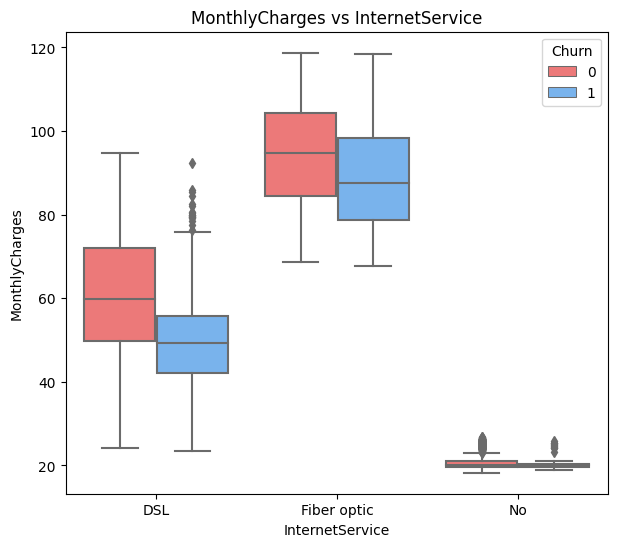

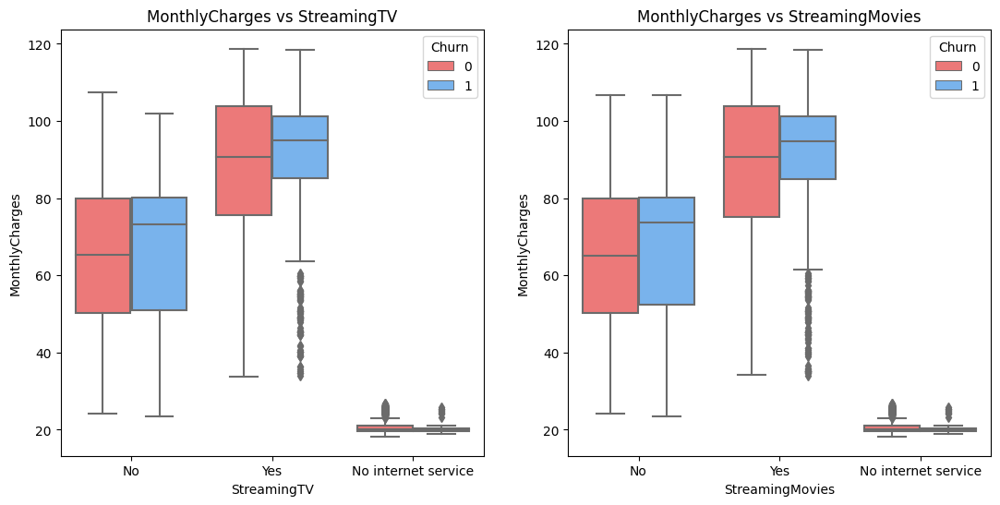

In [39]:
fig = plt.subplots(nrows = 1,ncols = 2,figsize = (16,6))

for i in range(len(list2[0:2])):
    plt.subplot(1,2,i + 1)
    ax = sns.boxplot(x = list2[i],y = 'MonthlyCharges',data = data_churn,hue = 'Churn',palette = colors);
    plt.title('MonthlyCharges vs ' + list2[i]);

fig = plt.subplots(nrows = 1, ncols = 1, figsize = (7,6))

plt.subplot(1,1,1)
ax = sns.boxplot(x = list2[2],y = 'MonthlyCharges',data = data_churn,hue = 'Churn',palette = colors);
plt.title('MonthlyCharges vs ' + list2[2]);
    
fig = plt.subplots(nrows = 1,ncols = 2,figsize = (13,6))

for i in range(len(list2[3:5])):
    plt.subplot(1,2,i + 1)
    ax = sns.boxplot(x = list2[i + 3],y = 'MonthlyCharges',data = data_churn,hue = 'Churn',palette = colors);
    plt.title('MonthlyCharges vs ' + list2[i + 3]);

Fiber optic is substantially more expensive than DSL, and as previously stated, increased monthly charges correlate to a larger churn rate. Phone service is also extremely expensive, with several lines costing twice as much as not having phone service.

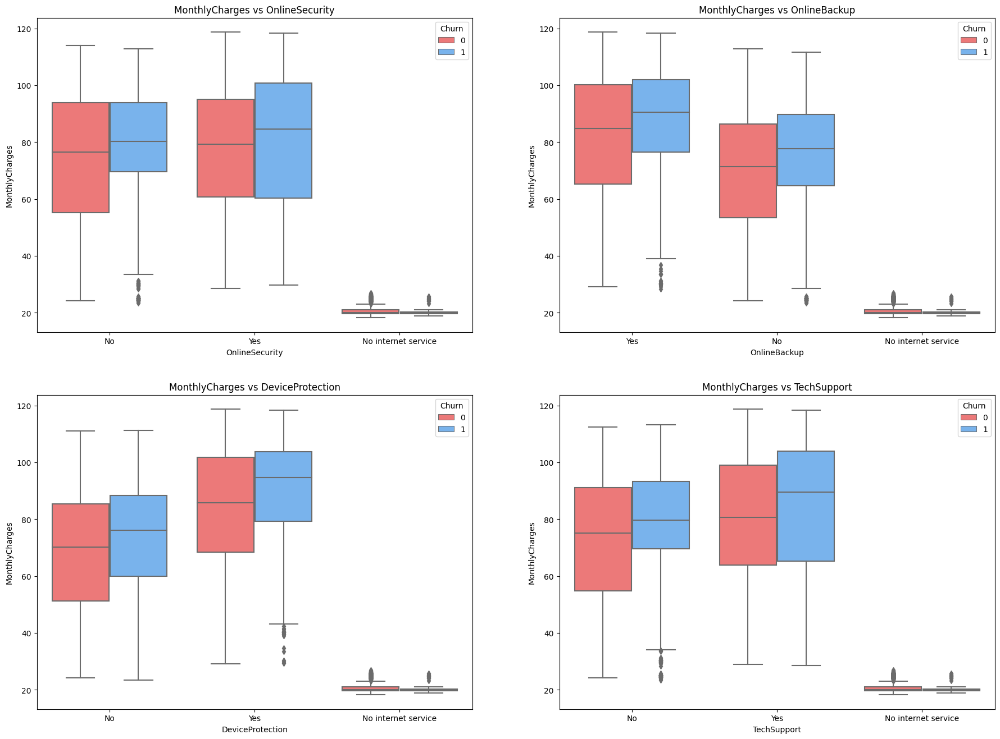

In [40]:
fig = plt.subplots(nrows = 2,ncols = 2,figsize = (22,16))
for i in range(len(list2[-4:])):
    plt.subplot(2,2,i + 1)
    ax = sns.boxplot(x = list2[i - 4],y = 'MonthlyCharges', data = data_churn, hue = 'Churn',palette = colors);
    plt.title('MonthlyCharges vs ' + list2[i-4]);

Because opting in for additional services equates to a significantly higher retaining rate, perhaps cutting the price will result in higher user retention in the long term.
With the cost of online security barely exceeding the cost of not having it, this should be prioritized.

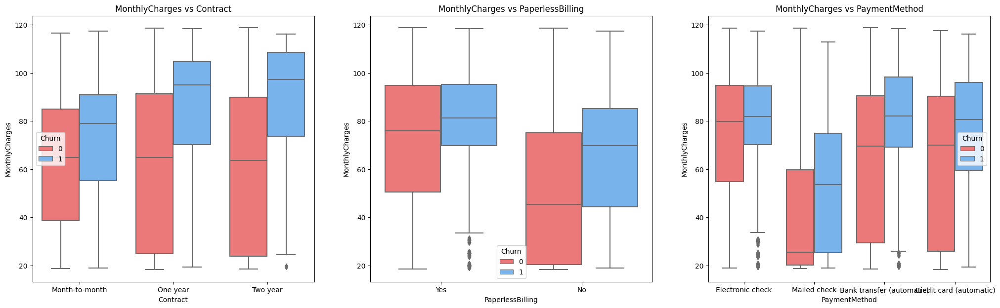

In [41]:
fig = plt.subplots(nrows = 1,ncols = 3,figsize = (25,7))

for i in range(len(list3)):
    plt.subplot(1,3,i + 1)
    ax = sns.boxplot(x = list3[i],y = 'MonthlyCharges',data = data_churn, hue = 'Churn',palette = colors);
    title = 'MonthlyCharges vs ' + list3[i]
    plt.title(title);

# *Categorical variables vs Total Charge*

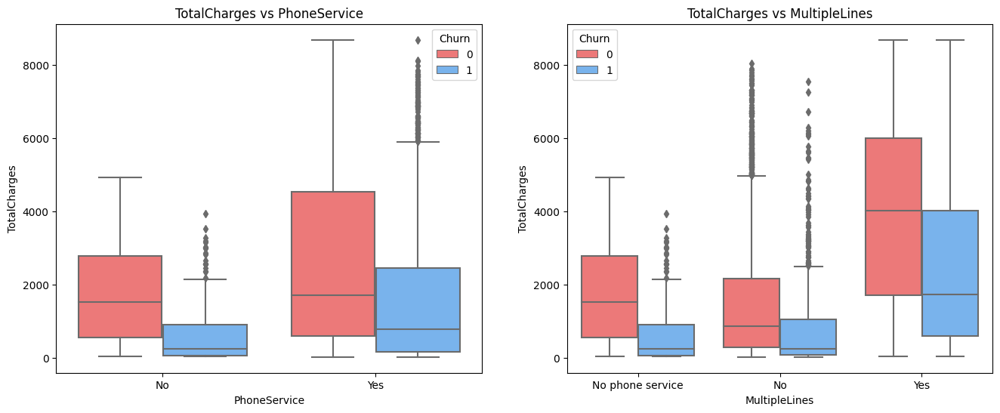

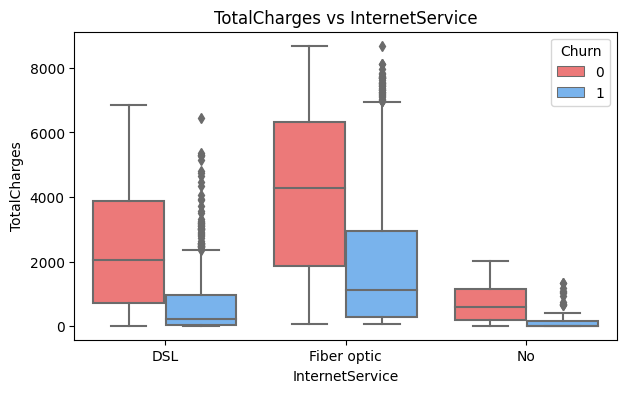

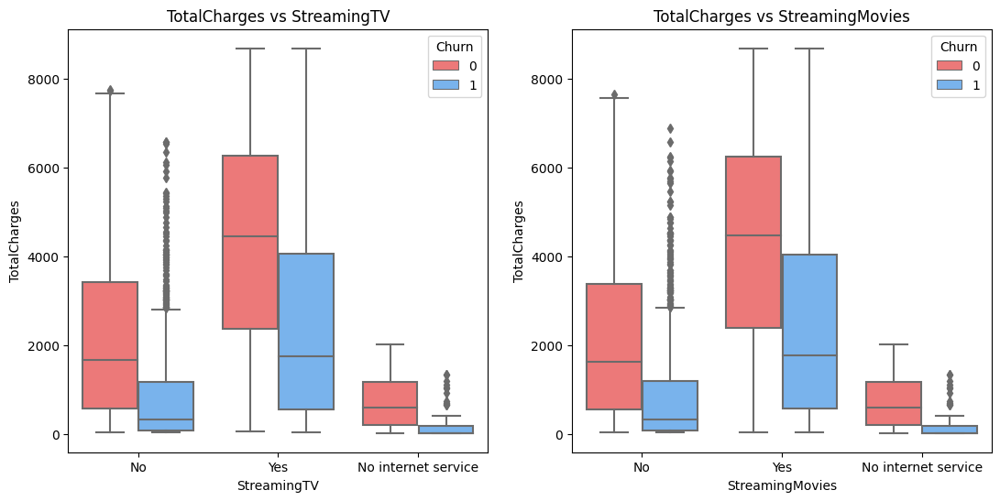

In [42]:
fig = plt.subplots(nrows = 1,ncols = 2,figsize = (16,6))

for i in range(len(list2[0:2])):
    plt.subplot(1,2,i + 1)
    ax = sns.boxplot(x = list2[i],y = 'TotalCharges',data = data_churn,hue = 'Churn',palette = colors);
    plt.title('TotalCharges vs ' + list2[i]);

fig = plt.subplots(nrows = 1, ncols = 1, figsize = (7,4))

plt.subplot(1,1,1)
ax = sns.boxplot(x = list2[2],y = 'TotalCharges',data = data_churn,hue = 'Churn',palette = colors);
plt.title('TotalCharges vs ' + list2[2]);
    
fig = plt.subplots(nrows = 1,ncols = 2,figsize = (13,6))

for i in range(len(list2[3:5])):
    plt.subplot(1,2,i + 1)
    ax = sns.boxplot(x = list2[i + 3],y = 'TotalCharges',data = data_churn,hue = 'Churn',palette = colors);
    plt.title('TotalCharges vs ' + list2[i + 3]);

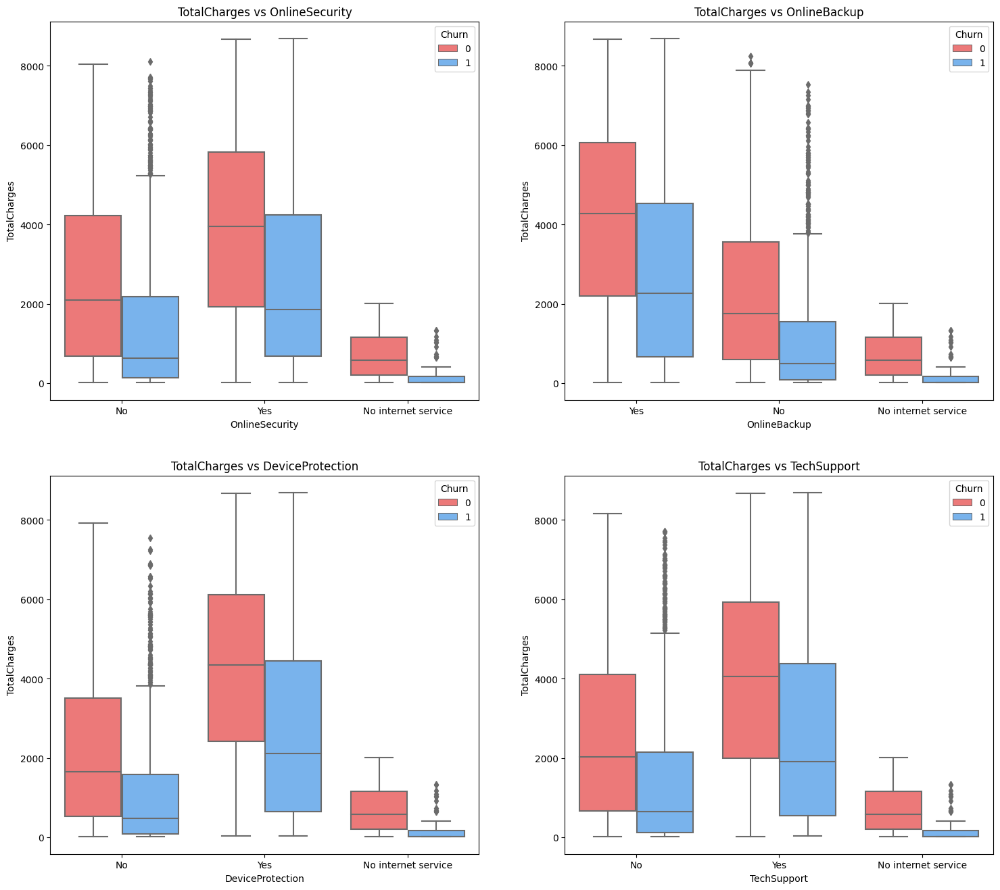

In [43]:
fig = plt.subplots(nrows = 2,ncols = 2,figsize = (18,16))
for i in range(len(list2[-4:])):
    plt.subplot(2,2,i + 1)
    ax = sns.boxplot(x = list2[i - 4],y = 'TotalCharges',data = data_churn, hue = 'Churn',palette = colors);
    plt.title('TotalCharges vs ' + list2[i-4]);

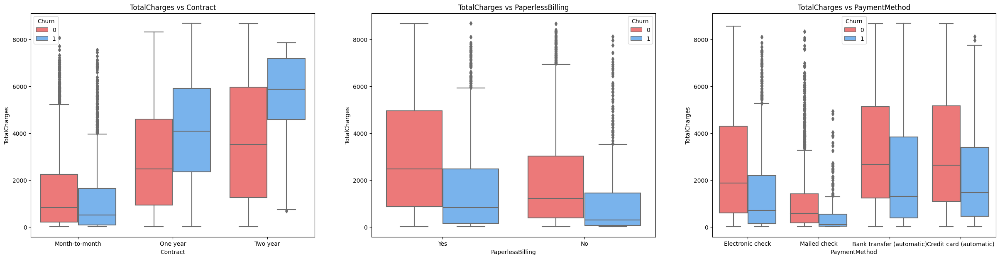

In [44]:
fig = plt.subplots(nrows = 1,ncols = 3,figsize = (30,7))
for i in range(len(list3)):
    plt.subplot(1,3,i + 1)
    ax = sns.boxplot(x = list3[i],y = 'TotalCharges',data = data_churn, hue = 'Churn',palette = colors);
    plt.title('TotalCharges vs ' + list3[i]);

My findings on the Telco business team is to concentrate on selling two-year contracts and accepting bank transfers or payment cards. These clearly link to increased retention without causing Telco to lose money.

* In terms of additional packages, the marketing team may be able to sell more because consumers that opt-in tend to have a longer tenure (however overpaying for tech assistance or device protection may lead to churning as rising monthly expenses correspond with churning).

* Fiber Optic may be too pricey for people's tastes.

* Customers with higher Monthly Charges are also more likely to churn

In [45]:
fig = px.box(data_churn, x='Churn', y = 'tenure')

# Update yaxis properties
fig.update_yaxes(title_text='Tenure (Months)', row=1, col=1)
# Update xaxis properties
fig.update_xaxes(title_text='Churn', row=1, col=1)

# Update size and title
fig.update_layout(autosize=True, width=850, height=700,
    title_font=dict(size=28, family='Courier'),
    title='<b>Tenure vs Churn</b>',
)

fig.show()

* New customers are more likely to churn

# Preliminary findings from the EDA.

* **Datatype Check:** Features in the dataset are integers/float and objects (characters/strings).

* **Missing Data Check:** Dataset has 11 missing values (empty spaces) in TotalCharges column.

* **Duplicate records:** There are 10 duplicated records in the dataset. I have deleted the records.

* **Distribution of training data:** I checked the distribution of each feature in the dataset. Few features are normally distributed after log transformation and few features are positively skewed and could not distribute normally.

* **Correlation Check**: Performed correleation check on the dataset using heatmap the findings from it was that the didn't had any significance multi-collinearity issues.

* **Graphs:** Built barplots, distplots, histograms and more plots for better analysis and insights of the data. These insights helps us to understand how a variable impacts the churn analysis.

The above graphs are a cohensive representation of how churn is getting impacted and changing all the respective significant variables.

* A few findings which can interpret from the above graph as

  * The plot shows a class imbalance of the data between churners and non-churners. To address this, resampling would be a suitable approach. To keep this case simple, the imbalance is kept forward and specific metrics are chosen for model evaluations.

  * Churning customers have much lower tenure with a median of ca. 10 months compared to a median of non-churners of ca. 38 months.
Churning customers have higher monthly charges with a median of ca. 80 USD and much lower interquartile range compared to that of non-churners (median of ca. 65 USD).
TotalCharges are the result of tenure and MonthlyCharges, which are more insightful on an individual basis.

  * Senior citizens churn rate is much higher than non-senior churn rate.
Churn rate for month-to-month contracts much higher that for other contract durations.
Moderately higher churn rate for customers without partners.
Much higher churn rate for customers without children.
Payment method electronic check shows much higher churn rate than other payment methods.
Customers with InternetService fiber optic as part of their contract have much higher churn rate.

**Data Cleaning**

* This dataset is having missing values and duplicate values.Performed necessary operations and cleaned the data for good prediction analysis.

**Handling Missing Data**

* In any ML modeling task, one of the very important task is to check if we have any missing values in our dataset. If there are missing values in the dataset it can horribly change the results and make our model inefficient.
But there are ways to tackle this problem, we will discuss these methods in a bit detail below

**How to handle missing data** - Data Imputation techniques
* Delete rows with missing data
* Fill the missing data points by either mean/mode/median
* Model a regression with rest of the feature as input and the missing value as the target i.e. MICE Imputation

Telecom Churn dataset has few missing values and duplicate values, so for better analysis i have chosen removing the records from the dataset.

Deleting missing values can have some advantages, such as
* Reducing the size and complexity of your dataset, 
* Avoiding errors or biases that can arise from imputing or replacing missing values, and 
* Preserving the original distribution and variance of your data.

## Data Preprocessing

In [46]:
# Import label encoder
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
  
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()
label_encoder_ols = preprocessing.LabelEncoder()

In [47]:
data_churn_transformed = data_churn

# label encoding (binary variables)
label_encoding_columns = ['gender', 'Partner', 'Dependents', 'PhoneService', 'PaperlessBilling','Churn']

# Transforming Categorical Columns
data_churn_transformed[label_encoding_columns] = data_churn_transformed[label_encoding_columns].apply(label_encoder.fit_transform)

In [48]:
one_hot_encoding_columns = ['MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 
                            'TechSupport', 'StreamingTV',  'StreamingMovies', 'Contract', 'PaymentMethod']

# encode categorical variables with more than two levels using one-hot encoding
data_churn_transformed = pd.get_dummies(data_churn_transformed, columns = one_hot_encoding_columns,drop_first=True)

In [49]:
scaler = MinMaxScaler()

min_max_columns = ['tenure', 'MonthlyCharges', 'TotalCharges']

# Encode numeric Columns
data_churn_transformed[min_max_columns] = scaler.fit_transform(data_churn_transformed[min_max_columns])

In [50]:
data_churn_transformed_ols = data_churn

# label encoding (binary variables) for ols model
label_encoding_columns_ols = ['gender', 'Partner', 'Dependents', 'PhoneService', 'PaperlessBilling','Churn']

# Transforming Categorical Columns for ols model
data_churn_transformed_ols[label_encoding_columns_ols] = data_churn_transformed_ols[label_encoding_columns_ols].apply(label_encoder_ols.fit_transform)

In [51]:
one_hot_encoding_columns = ['MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 
                            'TechSupport', 'StreamingTV',  'StreamingMovies', 'Contract', 'PaymentMethod']

# encode categorical variables with more than two levels using one-hot encoding
data_churn_transformed_ols = pd.get_dummies(data_churn_transformed_ols, columns = one_hot_encoding_columns,drop_first=True)

In [52]:
scaler_ols = MinMaxScaler()

# min-max normalization (numeric variables)
min_max_columns_ols = ['tenure', 'MonthlyCharges', 'TotalCharges']

# Encode numeric Columns
data_churn_transformed_ols[min_max_columns] = scaler_ols.fit_transform(data_churn_transformed_ols[min_max_columns_ols])

In [53]:
import statsmodels.api as sm

#define response variable
y_ols = data_churn_transformed_ols['Churn']

#define predictor variables
x_ols = data_churn_transformed_ols[['tenure','MonthlyCharges', 'TotalCharges']]

#add constant to predictor variables
x_ols = sm.add_constant(x_ols)

#fit regression model
model = sm.OLS(y_ols, x_ols).fit()

#view summary of model fit
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  Churn   R-squared:                       0.225
Model:                            OLS   Adj. R-squared:                  0.224
Method:                 Least Squares   F-statistic:                     678.8
Date:                Tue, 25 Apr 2023   Prob (F-statistic):               0.00
Time:                        02:44:40   Log-Likelihood:                -3338.1
No. Observations:                7032   AIC:                             6684.
Df Residuals:                    7028   BIC:                             6712.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.1937      0.013     14.

# Feature Selection
Feature Selection is the process of selecting the features which are relevant to a machine learning model. It means that you select only those attributes that have a significant effect on the model's output.

It is desirable to reduce the number of input variables to both reduce the computational cost of modeling and, in some cases, to improve the performance of the model.

All machine learning workflows depend on feature engineering, which comprises feature extraction and feature selection that are fundamental building blocks of modern machine learning pipelines. Despite the fact that feature extraction and feature selection processes share some overlap, often, these terms are erroneously equated. Feature extraction is the process of using domain knowledge to extract new variables from raw data that make machine learning algorithms work. The feature selection process is based on selecting the most consistent, relevant, and non-redundant features.

The objectives of feature selection techniques include:

* Simplification of models to make them easier to interpret by researchers/users
* Shorter training times
* Avoiding the curse of dimensionality
* Enhanced generalization by reducing overfitting (formally, reduction of variance)

Consider the case when you go to the departmental store to buy grocery items. A product has a lot of information on it, i.e., product, category, expiry date, retail cost, ingredients, and manufacturing details. All this information is the features of the product. Normally, you check the brand, retail cost, expiry date, weather the item is vegetarian or not before buying a product. However, manufacturing section is not your concern. Therefore, brand, retail cost, expiry date, vegetraian/non-vegetarian are relevant features, and the manufacturing details are irrelevant. This is how feature selection is done.

# Null-Hypothesis
For Example:- Testing the efficacy of a new Vaccine
Any new vaccine manufacturer has to conduct a double blind clinical controlled trials to check the efficacy of any vaccine in the general population. Now to test the vaccine, manufacturer will likely recruite around 60k people from all over the population where 30k would be vaccinated by a vaccine and rest 30k would be given a placebo. After few months the it was found that 500 people from vaccinated group got the diesease whereas 10000 people from placebo group got the dieases. This translate to a vaccine efficacy of 95%. i.e. those who received the vaccine were at a 95% lower risk of developing disease than the group who received the placebo. Now, this finding on a subset of 60k individuals is generalized over the whole population of man kind. These assumption is known as Null-Hypothesis.

Statistically, this can be achieved by P-Value.

**P-Value:** It stands for a probability value; it tells how likely it is that a result occurred by chance alone. Basically, the p-value is used in hypothesis testing to help you support or reject the null hypothesis. The smaller the p-value, the stronger the evidence to reject the null hypothesis.

Features in our dataset with P value < 0.05

* Tenure
* Total Charges
* Monthly Charges

Lets consider only these features and calculate the model fit again, and then lets have a comparative analysis of both models.

In [54]:
import statsmodels.api as sm
model_ols = sm.OLS(data_churn_transformed_ols['Churn'], data_churn_transformed_ols[['tenure','MonthlyCharges', 'TotalCharges']
]).fit()
# Print out the statistics
model_ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  Churn   R-squared (uncentered):                   0.414
Model:                            OLS   Adj. R-squared (uncentered):              0.413
Method:                 Least Squares   F-statistic:                              1652.
Date:                Tue, 25 Apr 2023   Prob (F-statistic):                        0.00
Time:                        02:44:42   Log-Likelihood:                         -3442.7
No. Observations:                7032   AIC:                                      6891.
Df Residuals:                    7029   BIC:                                      6912.
Df Model:                           3                                                  
Covariance Type:            nonrobust                                                  
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
tenure             0.1651      0.021      7.799      0.000       0.124       0.207
MonthlyCharges     1.0456      0.016     65.154      0.000       1.014       1.077
TotalCharges      -1.2062      0.040    -30.159      0.000      -1.285      -1.128
==============================================================================
Omnibus:                      471.125   Durbin-Watson:                   1.991
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              570.477
Skew:                           0.696   Prob(JB):                    1.33e-124
Kurtosis:                       2.902   Cond. No.                         7.74
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

* As the dataset is classification and continuous variables are very few so r2 values was very less in without constant model

* In model constant model the r2 sqaure value is very less compared to no-constant model.

* Applying r2 on few varibles leads to less r2 and can't depend on this feature also not very relevant for classification model.

* Generally R2 need to be above 70 for best fit model if it is less it leads to noisy, high-variability data and can have a significant trend. 

**Interpreting Regression Co-efficients**

**R-squared** measures the percentage of how much of the variance is described by the model.

Value for the R-squared for this model is 41.4 which is low and variance was high for the regression line.

**Adj. R-squared** measures the percentage of how much of the variance is described by the model with a penalization for more variables.

Value for Adj R-Squared is also 41.4 which means it does not add any weightage to the features if added into the dataset.

**F-statistic** measures how significant the fit is for the model
Prob(F-statistic) or P-value is the probability that a sample of the population would produce the above statistic.


**Model Co-efficients**

The positive or negative value of a co-eficient tells us if there is a positve or a negative correlationship between the target and predictors. A positive value indicates that the value of target increases if the value of co-efficient increases and vice-versa. Whereas the negative values indicates that the value of target increases if the value of co-efficient decreases and vice versa.

Value for the variable Monthly Charges is highest = 1.0456 and tenure with 0.1651

Here, MonthlyCharges and Tenure are the most important variables to predict target Churn


**P-Values**

If the p-value is 0.05 or lower, the result is significant, but if it is higher than 0.05, the result is non-significant

Here all the 3 variables are less than 0.05, hence these variables are significant variables and any change to this variables have significant impact on the target.

**Skew and Kurtosis**

Skewness tells us the amount and direction of skew and Kurtosis tells us how tall and sharp the peak is. The optimum value for these two measures is 0, Here we have a value for Skew and Kurtosis as 0.696, 2.902 respectively.

**Durbin-Watson**

The Durbin-Watson test is a statistical test to detect auto-correlation in the residuals of a regression analysis. Its range is 0 to 4.

Value of 2 indicates that no auto correlation is detected
Value between 0 to 2 indicates that there is positive auto correlation detected
Value between 2 to 4 indicates that there is negatibe auto correlation detected
Our model has a DW score of 1.991 which is a positive auto-correlation in the residuals of regression.

**Jarque-Bera Test**

The JB test is known as the test of Normality, irrespective if the data has skew or kurtosis. If it is far from zero, it signals the data do not have a normal distribution. Our JB value is 570.477 which again re-inforces the interpretation we got from Skew and Kurtosis.

Here we have only 3 varibles for OLS model as dataset is a classification data and all the varible values having binary values so we can't able to fit more features in the model.

In [55]:
# Check for duplicates
print(data_churn_transformed.duplicated().sum())

22


In [56]:
# Drop the duplicate data from the dataset
data_churn_transformed.drop_duplicates(inplace=True)

In [57]:
# Check for duplicates
print(data_churn_transformed.duplicated().sum())

0


In [58]:
def distplot(feature, frame, color='r'):
    plt.figure(figsize=(8,3))
    plt.title("Distribution for {}".format(feature))
    ax = sns.distplot(frame[feature], color= color)

<ipython-input-58-8c8257b32bab>:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-58-8c8257b32bab>:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-58-8c8257b32bab>:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use ei

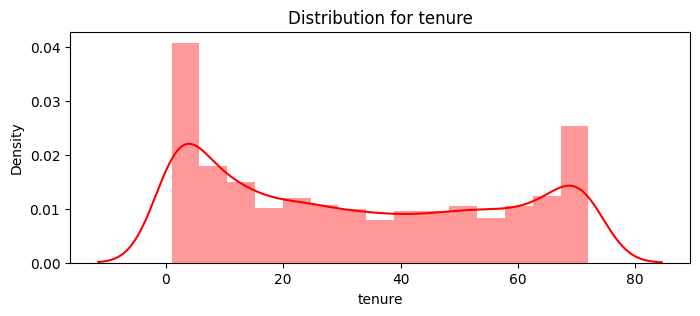

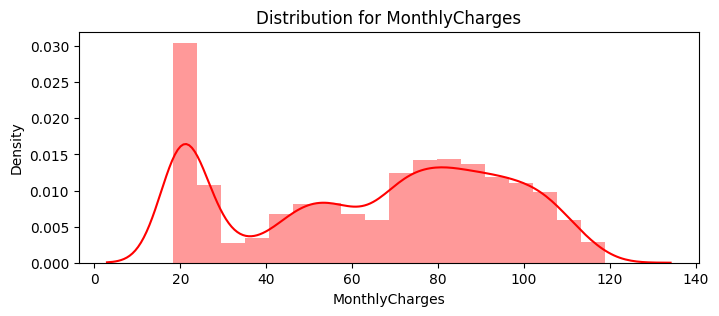

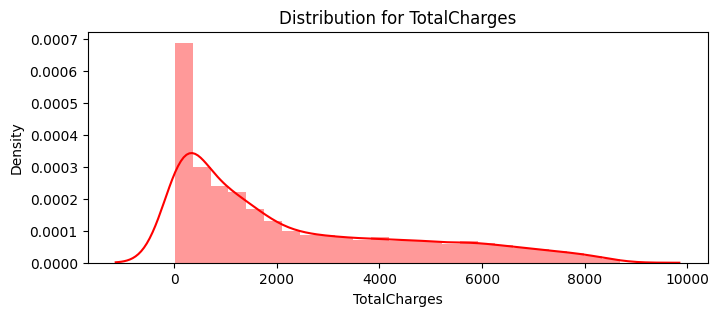

In [59]:
num_cols = ["tenure", 'MonthlyCharges', 'TotalCharges']
for feat in num_cols: distplot(feat, data_churn)


* Since the numerical features are distributed over different value ranges, I will use standard scalar to scale them down to the same range.

<ipython-input-58-8c8257b32bab>:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-58-8c8257b32bab>:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-58-8c8257b32bab>:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use ei

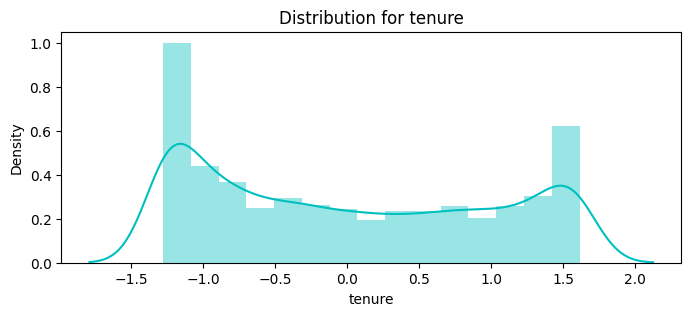

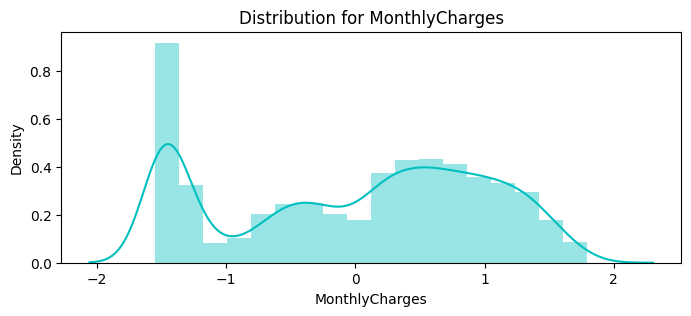

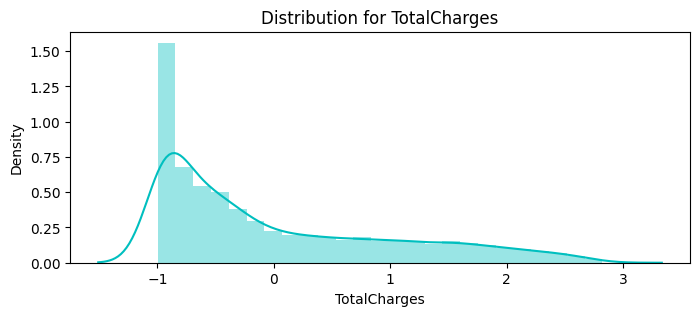

In [60]:
numerical_cols = ['tenure', 'MonthlyCharges', 'TotalCharges']
df_std = pd.DataFrame(StandardScaler().fit_transform(data_churn[num_cols].astype('float64')),
                       columns=num_cols)
for feat in numerical_cols: distplot(feat, df_std, color='c')

# Multicollinearity

In [61]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [62]:
multi_coll = data_churn_transformed[['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'PaperlessBilling',
       'MonthlyCharges', 'TotalCharges']]

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = multi_coll.columns
  
# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(multi_coll.values, i)
                          for i in range(len(multi_coll.columns))]
  
print(vif_data)

            feature        VIF
0            gender   1.897417
1     SeniorCitizen   1.325030
2           Partner   2.810019
3        Dependents   1.920936
4            tenure  12.223536
5      PhoneService   6.404217
6  PaperlessBilling   2.726838
7    MonthlyCharges  10.911303
8      TotalCharges  15.611738


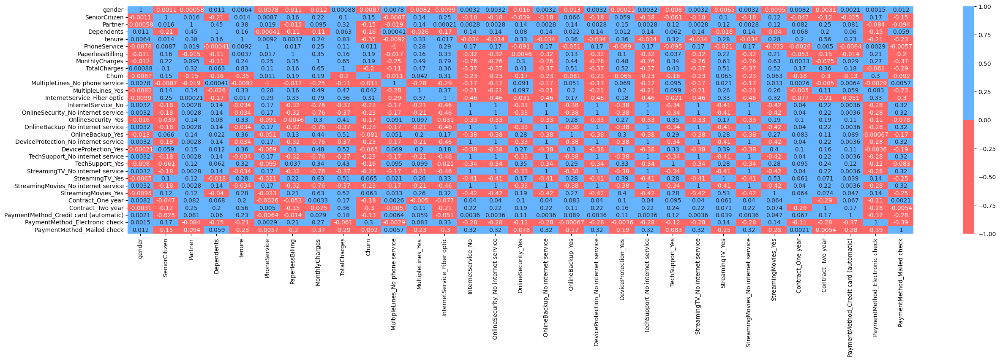

In [63]:
plt.figure(figsize = (30,7))
sns.heatmap(data_churn_transformed.corr(),cmap = colors,annot = True);

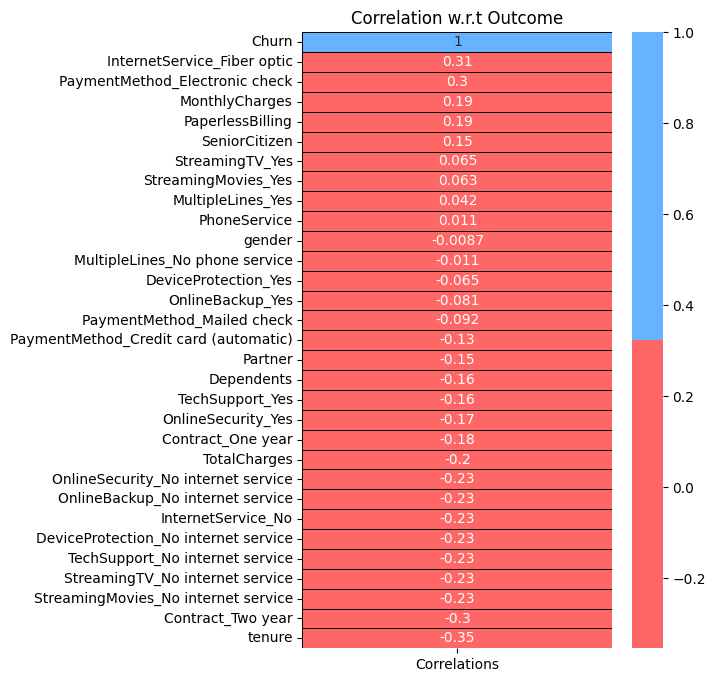

In [64]:
corr = data_churn_transformed.corrwith(data_churn_transformed['Churn']).sort_values(ascending = False).to_frame()
corr.columns = ['Correlations']
plt.subplots(figsize = (5,8))
sns.heatmap(corr,annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black');
plt.title('Correlation w.r.t Outcome');

Here we can see multicollinearity of data for specific continuous float datatype has less collinear relationship to the other variables that should be considered or adjusted for the structure of the model and selection of independent variables.

In [65]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.metrics import precision_recall_curve
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier
from sklearn import metrics
from sklearn.metrics import roc_curve
from sklearn.metrics import recall_score, confusion_matrix, precision_score, f1_score, accuracy_score, classification_report
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet, SGDRegressor
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

In [66]:
# Define the feature variable 'X' and the label/target variable 'y'
X = data_churn_transformed.drop('Churn', axis=1)  # Drop the target variable
y = data_churn_transformed['Churn']

In [67]:
# Split the data into training and test datasets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=33)

# Fitting a Random Forest Classifier

In [68]:
from sklearn.ensemble import RandomForestClassifier
model_rf = RandomForestClassifier(n_estimators=1000 , oob_score = True, n_jobs = -1,
                                  random_state =50, max_features = "auto",
                                  max_leaf_nodes = 30)
model_rf.fit(X_train, y_train)

/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.



RandomForestClassifier(max_features='auto', max_leaf_nodes=30,
                       n_estimators=1000, n_jobs=-1, oob_score=True,
                       random_state=50)

Random forest model to train the data using the `RandomForestClassifier` class from the `sklearn.ensemble` module. The parameters used are:

- `n_estimators`: the number of trees in the forest. Here, it is set to 1000.
- `oob_score`: whether to use out-of-bag samples to estimate the generalization accuracy. Here, it is set to `True`.
- `n_jobs`: the number of CPU cores to use for parallelizing the tree construction. Here, it is set to `-1`, which means to use all available cores.
- `random_state`: the random seed for reproducibility. Here, it is set to 50.
- `max_features`: the number of features to consider when looking for the best split at each node. Here, it is set to `"auto"`, which means to consider all features for each split.
- `max_leaf_nodes`: the maximum number of leaf nodes in each tree. Here, it is set to 30.

The `fit` method is then called on the model object, passing in the training data (`X_train` and `y_train`) to train the model.

In [69]:
# Make predictions
prediction_test_rf = model_rf.predict(X_test)
accuracy_rf = metrics.accuracy_score(y_test, prediction_test_rf)
print (accuracy_rf)

0.7995720399429387


79% accuracy is a decent result for a classification problem, but it would be helpful to know what the specific problem being addressed is and what other models have been tested to provide context for the accuracy. Additionally, it would be useful to evaluate other performance metrics such as precision, recall, and F1 score to get a more comprehensive understanding of the model's performance.

In [70]:
# evaluation
from sklearn.metrics import classification_report 
print(classification_report(y_test, prediction_test_rf))

              precision    recall  f1-score   support

           0       0.84      0.91      0.87      1043
           1       0.65      0.48      0.55       359

    accuracy                           0.80      1402
   macro avg       0.74      0.70      0.71      1402
weighted avg       0.79      0.80      0.79      1402



Above are the weighted precision, recall, f1_score values for the random forest classifier. Which is performing well.

In [71]:
f1_score_rf = f1_score(y_test, prediction_test_rf, average='weighted')
print(f1_score_rf)

0.7892164360230072


In [72]:
recall_rf = recall_score(y_test, prediction_test_rf, average='weighted')
print(recall_rf)

0.7995720399429387


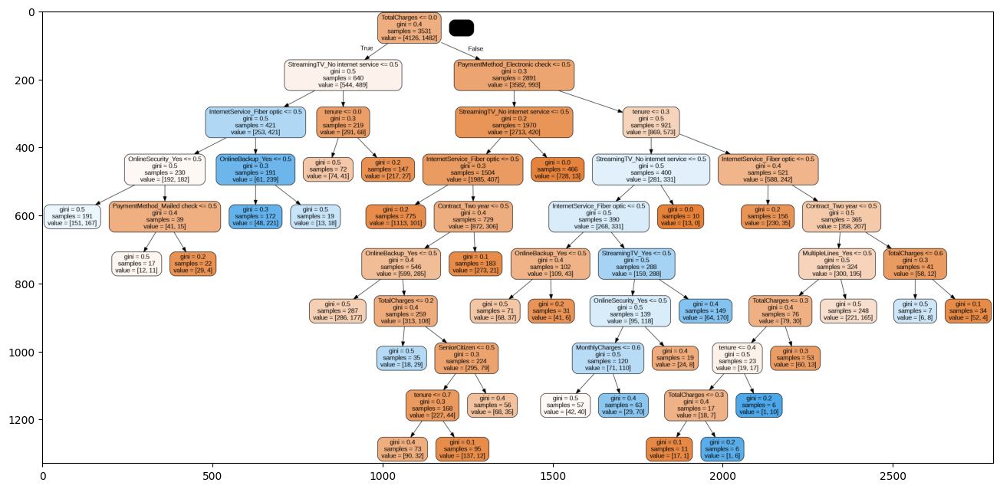

In [73]:
# Visualization of Nodes for the purpose of explainability
#figure(figsize=(32, 24), dpi=80)
tree_model = model_rf.estimators_[0]
export_graphviz(
    tree_model,
    out_file="tree.dot",
    feature_names=list(X_train.columns),
    rounded=True,
    precision=1,filled=True
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

As we can see that, this tree is traversing each class in each node and helps to get insight and predicts a value.

Each square represents a node in the tree, with multiple leaf nodes in the graph. The root and interior nodes show the decision rule, used to split incoming data, at the top of the square. Each square also includes the: 

* Gini Impurity
* Total number of samples
* Number of samples per class
* Dominant class for the subset of training data at the node

In [74]:
import imblearn
from collections import Counter
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

In [75]:
over = SMOTE(sampling_strategy = 1)

#Everything else
f1 = data_churn_transformed.iloc[:,:13].values
#Churn
t1 = data_churn_transformed.iloc[:,13].values

f1, t1 = over.fit_resample(f1, t1)
Counter(t1)

Counter({0: 5504, 1: 5504})

performing oversampling using the SMOTE (Synthetic Minority Over-sampling Technique) method with a sampling strategy of 1, which means that the number of samples in the minority class (churn) will be increased to be equal to the number of samples in the majority class (non-churn). 

The first step is to separate the predictor variables (X) and the target variable (y) from the preprocessed dataset. Then, the SMOTE object is instantiated with the desired sampling strategy. Finally, the `fit_resample()` method of the SMOTE object is called on the predictor variables (f1) and the target variable (t1) to generate the new synthetic samples for the minority class. The `Counter()` function is then used to check that the new classes are now balanced (i.e., the number of samples in both classes is equal).

In [76]:
# Cross-validation + ROC_AUC score
def model(classifier,X_train,y_train,X_test,y_test):
    
    classifier.fit(X_train,y_train)
    prediction = classifier.predict(X_test)
    cv = RepeatedStratifiedKFold(n_splits = 10,n_repeats = 3,random_state = 1)
    print("Cross Validation Score : ",'{0:.2%}'.format(cross_val_score(classifier,X_train,y_train,cv = cv,scoring = 'roc_auc').mean()))
    print("ROC_AUC Score : ",'{0:.2%}'.format(roc_auc_score(y_test,prediction)))

def model_evaluation(classifier,X_test,y_test):
    
    # Confusion Matrix
    cm = confusion_matrix(y_test,classifier.predict(X_test))
    names = ['True Neg','False Pos','False Neg','True Pos']
    counts = [value for value in cm.flatten()]
    percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(names,counts,percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm,annot = labels,cmap = 'Blues',fmt ='')
    
    # Classification Report
    print(classification_report(y_test,classifier.predict(X_test)))

In [77]:
classifier_rf = RandomForestClassifier(max_depth = 4,random_state = 0)
model(classifier_rf,X_train,y_train,X_test,y_test)

Cross Validation Score :  83.93%
ROC_AUC Score :  66.52%


From the cross validation score we can see that:

The score got increased to 83.93% from 79% because of the random sampling method. which balances the binary values and improves the accuracy by performing hyperparameter tuning. Similarly ROC_AUC score stabilized at 66.52%.


Customer churn is definitely bad to a firm ’s profitability. Various strategies can be implemented to eliminate customer churn. The best way to avoid customer churn is for a company to truly know its customers. This includes identifying customers who are at risk of churning and working to improve their satisfaction. Improving customer service is, of course, at the top of the priority for tackling this issue. Building customer loyalty through relevant experiences and specialized service is another strategy to reduce customer churn. Some firms survey customers who have already churned to understand their reasons for leaving in order to adopt a proactive approach to avoiding future customer churn.

What evaluation metric are you using?
The evaluation metrics which I am using are

* Accuracy
* F1 Score
* Recall
* Precision
* ROC Curve
* Confusion Matrix


**1. Precision:** Precision explains how many of the correctly predicted cases actually turned out to be positive. Precision is useful in the cases where False Positive is a higher concern than False Negatives. The importance of Precision is in music or video recommendation systems, e-commerce websites, etc. where wrong results could lead to customer churn and this could be harmful to the business

**2. Recall (Sensitivity):** Recall explains how many of the actual positive cases we were able to predict correctly with our model. It is a useful metric in cases where False Negative is of higher concern than False Positive. It is important in medical cases where it doesn’t matter whether we raise a false alarm but the actual positive cases should not go undetected!

**3. F1 Score:** It gives a combined idea about Precision and Recall metrics. It is maximum when Precision is equal to Recall.

The F1 score punishes extreme values more. F1 Score could be an effective evaluation metric in the following cases:

When FP and FN are equally costly.
Adding more data doesn’t effectively change the outcome
True Negative is high

**4. AUC-ROC:** The Receiver Operator Characteristic (ROC) is a probability curve that plots the TPR(True Positive Rate) against the FPR(False Positive Rate) at various threshold values and separates the ‘signal’ from the ‘noise’.

Understanding how well a machine learning model will perform on unseen data is the main purpose behind working with these evaluation metrics. Metrics like accuracy, precision, recall are good ways to evaluate classification models for balanced datasets, but if the data is imbalanced then other methods like ROC/AUC perform better in evaluating the model performance.

ROC curve isn’t just a single number but it’s a whole curve that provides nuanced details about the behavior of the classifier. It is also hard to quickly compare many ROC curves to each other.

These evaluation metrics are used to evaluate the best model, as it is a classification problem. Here, F1 Score, Recall and Accuracy are the most important metrics used to evaluate the mode.

The residual deviance tells us how well the response variable can be predicted by a model with p predictor variables. The lower the value, the better the model is able to predict the value of the response variable.

Accuracy tells us how correct and precise our model is.

# H2O.ai

H2O.ai is an advanced AI cloud platform designed to simplify and accelerate developing and operating with AI in any environment. Its H2O AI Cloud platform solves complex business problems and accelerates the discovery of new ideas with results users can understand and trust. The company provides solutions to financial services, government, health, insurance, manufacturing, and other industries.

In [78]:
# Initialising H2O Automl cluster (Locally)
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpv4_qygl9
  JVM stdout: /tmp/tmpv4_qygl9/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpv4_qygl9/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,04 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_nwakg6
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [79]:
# Import dataset into H2O
hf = h2o.H2OFrame(data_churn_transformed)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


Installing H2O Python package that are required for the analysis.

In [80]:
# Summary of the dataset in H2O
hf.describe(chunk_summary=True)

Rows:7010
Cols:31

Chunk compression summary: 
chunk_type    chunk_name       count    count_percentage    size      size_percentage
------------  ---------------  -------  ------------------  --------  -----------------
CBS           Binary           27       87.0968             25.0 KB   16.6062
CXI           Sparse Integers  1        3.22581             1.4 KB    0.932631
CUD           Unique Reals     1        3.22581             14.3 KB   9.52894
C8D           64-bit Reals     2        6.45161             109.7 KB  72.9323

Frame distribution summary: 
                 size      number_of_rows    number_of_chunks_per_column    number_of_chunks
---------------  --------  ----------------  -----------------------------  ------------------
127.0.0.1:54321  150.4 KB  7010              1                              31
mean             150.4 KB  7010              1                              31
min              150.4 KB  7010              1                              31
max              150.4 KB  7010              1                              31
stddev           0  B      0                 0                              0
total            150.4 KB  7010              1                              31

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,MultipleLines_No phone service,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
type,int,int,int,int,real,int,int,real,real,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int
mins,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,0.5042796005706134,0.16276747503566333,0.48402282453637663,0.2994293865905849,0.44394928773783937,0.9029957203994294,0.5931526390870185,0.464066330260253,0.26212247726945764,0.26490727532097,0.09700427960057062,0.4232524964336662,0.44079885877318115,0.21483594864479316,0.21483594864479316,0.28744650499286734,0.21483594864479316,0.3459343794579173,0.21483594864479316,0.3449358059914408,0.21483594864479316,0.29101283880171186,0.21483594864479316,0.3855920114122682,0.21483594864479316,0.38958630527817406,0.2099857346647646,0.24037089871611983,0.21697574893009985,0.3365192582025678,0.22653352353780315
maxs,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
sigma,0.5000173505311578,0.369179721618969,0.4997803136080667,0.4580407819218768,0.34535832913933967,0.2959847069772193,0.4912809951734357,0.2991519271338049,0.2615763710763395,0.4413152998196357,0.2959847069772193,0.49410995613217396,0.49651827082646066,0.41073778767497404,0.41073778767497404,0.4526038381773964,0.41073778767497404,0.47570586128351194,0.41073778767497404,0.475381250773736,0.41073778767497404,0.4542618226487047,0.41073778767497404,0.48676956878043326,0.41073778767497404,0.48769123949769133,0.40732713424134437,0.4273391872363564,0.4122153723235152,0.47255253929794794,0.4186180657587452
zeros,3475,5869,3617,4911,591,680,2852,1,1,5153,6330,4043,3920,5504,5504,4995,5504,4585,5504,4592,5504,4970,5504,4307,5504,4279,5538,5325,5489,4651,5422
missing,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.11542288557213932,0.001275098084468036,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,1.0,0.0,0.0,0.0,0.46478873239436624,1.0,0.0,0.3850746268656716,0.21586660512347103,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
2,1.0,0.0,0.0,0.0,0.01408450704225352,1.0,1.0,0.35422885572139307,0.010310408492960998,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


## Split the data into train, and test?
The data was splitted into Training ad Testing Data into 80% and 20% respectively.

In [81]:
# Split the data to train test split with 80:20
train, test = hf.split_frame(ratios=[0.8], seed = 25)

In [82]:
X = hf.columns
print(X)

['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure', 'PhoneService', 'PaperlessBilling', 'MonthlyCharges', 'TotalCharges', 'Churn', 'MultipleLines_No phone service', 'MultipleLines_Yes', 'InternetService_Fiber optic', 'InternetService_No', 'OnlineSecurity_No internet service', 'OnlineSecurity_Yes', 'OnlineBackup_No internet service', 'OnlineBackup_Yes', 'DeviceProtection_No internet service', 'DeviceProtection_Yes', 'TechSupport_No internet service', 'TechSupport_Yes', 'StreamingTV_No internet service', 'StreamingTV_Yes', 'StreamingMovies_No internet service', 'StreamingMovies_Yes', 'Contract_One year', 'Contract_Two year', 'PaymentMethod_Credit card (automatic)', 'PaymentMethod_Electronic check', 'PaymentMethod_Mailed check']


In [83]:
# Setting target and predictor variables
y = "Churn"

# Removing the result from predictors data
X.remove(y)  
print(X)

['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure', 'PhoneService', 'PaperlessBilling', 'MonthlyCharges', 'TotalCharges', 'MultipleLines_No phone service', 'MultipleLines_Yes', 'InternetService_Fiber optic', 'InternetService_No', 'OnlineSecurity_No internet service', 'OnlineSecurity_Yes', 'OnlineBackup_No internet service', 'OnlineBackup_Yes', 'DeviceProtection_No internet service', 'DeviceProtection_Yes', 'TechSupport_No internet service', 'TechSupport_Yes', 'StreamingTV_No internet service', 'StreamingTV_Yes', 'StreamingMovies_No internet service', 'StreamingMovies_Yes', 'Contract_One year', 'Contract_Two year', 'PaymentMethod_Credit card (automatic)', 'PaymentMethod_Electronic check', 'PaymentMethod_Mailed check']


In [84]:
# Model building with H2O AutoML and also building Hyper Parameter tuning
H2OAutoML(nfolds=5, max_runtime_secs=3600, max_models=None, stopping_metric='AUTO', stopping_tolerance=None, stopping_rounds=3, seed=None, project_name=None)

In [85]:
# Stopping Criterias: max time and max number of models has been applied for the model deployment
# Run AutoML for 25 base models
aml = H2OAutoML(max_models = 10,  
                seed = 19, 
                project_name='classification')

%time aml.train(x = X, y = y, training_frame = train)

AutoML progress: |
02:46:37.855: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

██
02:46:50.486: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█
02:46:58.445: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

██
02:47:14.629: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.


02:47:21.728: _response param, We have d

key,value
Stacking strategy,cross_validation
Number of base models (used / total),6/10
# GBM base models (used / total),4/4
# XGBoost base models (used / total),1/3
# GLM base models (used / total),1/1
# DRF base models (used / total),0/2
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None


In [86]:
# Run AutoML for 25 base models
aml = H2OAutoML(max_models = 10,  
                seed = 96, 
                project_name='classification')

%time aml.train(x = X, y = y, training_frame = test)

AutoML progress: |
02:46:37.855: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
02:46:50.486: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
02:46:58.445: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
02:47:14.629: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
02:47:21.728: _response param, We have detected that 

Model Details
=============
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_5_AutoML_2_20230425_24951


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    39                 39                          6491                   4            6            4.69231       8             10            8.61538

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 0.11902626169226087
RMSE: 0.34500182853466277
MAE: 0.2523683866044302
RMSLE: 0.2421710641553592
Mean Residual Deviance: 0.11902626169226087

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 0.13218884749450382
RMSE: 0.36357784241411606
MAE: 0.27276877019811085
RMSLE: 0.2560583553429666
Mean Residual Deviance: 0.13218884749450382

Cross-Validation Metrics Summary: 
                        mean      sd          cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  --------  ----------  ------------  ------------  ------------  ------------  ------------
mae                     0.270111  0.00925361  0.274854      0.255047      0.267451      0.277542      0.275661
mean_residual_deviance  0.132698  0.00901222  0.132623      0.119545      0.129903      0.137906      0.143512
mse                     0.132698  0.00901222  0.132623      0.119545      0.129903      0.137906      0.143512
r2                      0.323409  0.0789678   0.336278      0.375637      0.402023      0.304202      0.198906
residual_deviance       0.132698  0.00901222  0.132623      0.119545      0.129903      0.137906      0.143512
rmse                    0.364107  0.0124478   0.364175      0.345753      0.360421      0.371357      0.378829
rmsle                   0.256576  0.00990362  0.255709      0.246087      0.248582      0.262353      0.270151

Scoring History: 
    timestamp            duration    number_of_trees    training_rmse    training_mae    training_deviance
--  -------------------  ----------  -----------------  ---------------  --------------  -------------------
    2023-04-25 02:49:59  1.639 sec   0                  0.444928         0.395922        0.197961
    2023-04-25 02:49:59  1.670 sec   5                  0.399494         0.348481        0.159596
    2023-04-25 02:49:59  1.698 sec   10                 0.377973         0.318483        0.142863
    2023-04-25 02:49:59  1.732 sec   15                 0.365305         0.295241        0.133447
    2023-04-25 02:49:59  1.763 sec   20                 0.357956         0.280986        0.128132
    2023-04-25 02:49:59  1.788 sec   25                 0.352736         0.268795        0.124422
    2023-04-25 02:49:59  1.819 sec   30                 0.349379         0.261097        0.122066
    2023-04-25 02:49:59  1.861 sec   35                 0.346691         0.254703        0.120194
    2023-04-25 02:50:00  1.893 sec   39                 0.345002         0.252368        0.119026

Variable Importances: 
variable                              relative_importance    scaled_importance      percentage
------------------------------------  ---------------------  ---------------------  ----------------------
InternetService_Fiber optic           138.911865234375       1.0                    0.25602071758716743
tenure                                119.99435424804688     0.8638164497006061     0.22115490731594853
TotalCharges                          104.08006286621094     0.7492525040291186     0.19182416373551703
PaymentMethod_Electronic check        54.01008605957031      0.38880829919347326    0.09954297976335913
MonthlyCharges                        26.07546043395996      0.18771226194367846    0.0480582280027309
PaperlessBilling                      21.58896255493164      0.15541482

In [87]:
aml.leader.model_performance(test_data=test)
plt.show()

In this model, the training-set accuracy score is 0.792 while the test-set accuracy to be 0.814. These two values are quite comparable. So, there is no sign of overfitting.

The testing-set accuracy score in this model is 0.792, whereas the test-set accuracy is 0.814. These two values are very similar. As a result, there is no evidence of overfitting.

**Performance:** GBM is regarded as one of the finest classification models due to various advantages, including:

**Scalability:** GBM is a highly optimized gradient boosting solution that delivers quick training and prediction times.

**Scalability:** Because GBM can handle enormous datasets with a large number of features, it is well suited for big data challenges.

**Flexibility:** GBM offers users the ability to provide custom objective functions and evaluation measures, as well as a wide number of hyperparameters that may be tweaked to improve model performance.

**Regularization:** GBM has built-in regularization via L1 and L2 regularization, which can aid in the prevention of overfitting and the improvement of generalization.

**Interoperability:** GBM works well with other machine learning frameworks, like as scikit-learn and TensorFlow, making it simple to employ in a variety of applications.

**Interpretability:** GBM provides feature importances that can be utilized to understand the most essential features in a model and make educated feature engineering decisions.

Overall, GBM is a powerful and versatile machine learning technique that is widely used in the data science community and is frequently used to solve numerous categorization problems.

## This will display the top models ranked by their performance metric.

In [88]:
# View the AutoML viewboard
ml_results = aml.leaderboard
ml_results.head(rows=ml_results.nrows)

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
GBM_5_AutoML_2_20230425_24951,0.363578,0.132189,0.272769,0.256058,0.132189
StackedEnsemble_AllModels_1_AutoML_1_20230425_24637,0.369113,0.136244,0.277068,0.259494,0.136244
StackedEnsemble_BestOfFamily_1_AutoML_1_20230425_24637,0.369184,0.136297,0.277872,0.2596,0.136297
GBM_1_AutoML_1_20230425_24637,0.369613,0.136614,0.276218,0.259384,0.136614
GLM_2_AutoML_2_20230425_24951,0.370785,0.137481,0.291904,0.264517,0.137481
GBM_8_AutoML_2_20230425_24951,0.373056,0.139171,0.270268,0.263024,0.139171
GBM_2_AutoML_1_20230425_24637,0.373106,0.139208,0.275693,0.261822,0.139208
GBM_7_AutoML_2_20230425_24951,0.373412,0.139437,0.26883,0.263121,0.139437
GBM_6_AutoML_2_20230425_24951,0.374178,0.140009,0.272754,0.263704,0.140009
GBM_3_AutoML_1_20230425_24637,0.375458,0.140968,0.276413,0.263427,0.140968


In [89]:
# View the AutoML leaderboard with all possible columns
from h2o.automl import get_leaderboard
ml_result1 = get_leaderboard(aml, extra_columns='ALL')
ml_result1.head(rows=ml_result1.nrows)

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
GBM_5_AutoML_2_20230425_24951,0.363578,0.132189,0.272769,0.256058,0.132189,258,0.011769,GBM
StackedEnsemble_AllModels_1_AutoML_1_20230425_24637,0.369113,0.136244,0.277068,0.259494,0.136244,1703,0.059231,StackedEnsemble
StackedEnsemble_BestOfFamily_1_AutoML_1_20230425_24637,0.369184,0.136297,0.277872,0.2596,0.136297,1736,0.019471,StackedEnsemble
GBM_1_AutoML_1_20230425_24637,0.369613,0.136614,0.276218,0.259384,0.136614,2364,0.015732,GBM
GLM_2_AutoML_2_20230425_24951,0.370785,0.137481,0.291904,0.264517,0.137481,53,0.001264,GLM
GBM_8_AutoML_2_20230425_24951,0.373056,0.139171,0.270268,0.263024,0.139171,389,0.008822,GBM
GBM_2_AutoML_1_20230425_24637,0.373106,0.139208,0.275693,0.261822,0.139208,595,0.010045,GBM
GBM_7_AutoML_2_20230425_24951,0.373412,0.139437,0.26883,0.263121,0.139437,234,0.010721,GBM
GBM_6_AutoML_2_20230425_24951,0.374178,0.140009,0.272754,0.263704,0.140009,239,0.007165,GBM
GBM_3_AutoML_1_20230425_24637,0.375458,0.140968,0.276413,0.263427,0.140968,452,0.012737,GBM


* I trained multiple models for this purpose including the simplest Linear Regression to using AutoML to get the best model it could fit. The models I trained for this purpose were

* Random Forest Classifier

* AutoML

The models which gave me the best performance in predicting the churn analysis results were the Logistic Regression and the model from AutoML where the model from AutoML. The model from AutoML to give the best result was a GBM.

As the AutoML's model was promising, I tuned its hyperparameters to optimize the model. Tunining the hyperparameters helped the model to increase its accuracy from 79.82 % to 83 % which is a great increase in the performance.

In [90]:
#Viw the model performance of the dataset in AutoML with the metric values
aml.leader.model_performance(test_data=test)

ModelMetricsRegression: gbm
** Reported on test data. **

MSE: 0.11902626376789863
RMSE: 0.3450018315428175
MAE: 0.2523683958373141
RMSLE: 0.24217106520016113
Mean Residual Deviance: 0.11902626376789863

ModelMetricsRegression: gbm

Root Mean Square is 34.50% 

Mean Square: 11.90%

Mean AE: 25.23% 

Root Mean Square LE: 24.21%

The mean residual deviation is 0.1190.

In [91]:
# To generate predictions on a test set, you can make predictions
# directly on the `H2OAutoML` object or on the leader model
aml.predict

<bound method H2OAutoML.predict of <h2o.automl._estimator.H2OAutoML object at 0x7f5bb4aa7580>>

# SHAP Explainability
SHAP plot shows the contribution of the features for each instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model.

SHAP explaination shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

In [92]:
import shap
import lime
from lime import lime_tabular
import sklearn
from sklearn.model_selection import train_test_split
import random
from sklearn.ensemble import RandomForestRegressor
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
from fitter import Fitter, get_common_distributions, get_distributions

plt.rcParams["figure.figsize"] = (32, 24)

In [93]:
#Viw the model performance of the dataset in AutoML with the metric values
aml.leader.model_performance(test_data=test)

ModelMetricsRegression: gbm
** Reported on test data. **

MSE: 0.11902626376789863
RMSE: 0.3450018315428175
MAE: 0.2523683958373141
RMSLE: 0.24217106520016113
Mean Residual Deviance: 0.11902626376789863

In [94]:
# To generate predictions on a test set, you can make predictions
# directly on the `H2OAutoML` object or on the leader model
aml.predict

<bound method H2OAutoML.predict of <h2o.automl._estimator.H2OAutoML object at 0x7f5bb4aa7580>>

In this model, the training-set accuracy score is 0.7865 while the test-set accuracy to be 0.8021. These two values are quite comparable. So, there is no sign of overfitting.

GBM is considered one of the best classification models because of its several advantages such as:

**Performance:** GBM is a highly optimized implementation of gradient boosting that provides fast training and prediction times.

**Scalability:** GBM can handle large datasets with a large number of features, making it suitable for big data problems.

**Flexibility:** GBM allows users to specify custom objective functions and evaluation metrics, and it provides a large number of hyperparameters that can be tuned to improve model performance.

**Regularization:** GBM includes built-in regularization through L1 and L2 regularization, which can help to prevent overfitting and improve generalization.

**Interoperability:** GBM integrates well with other machine learning libraries, including scikit-learn and TensorFlow, making it easy to use in a wide range of applications.

**Interpretability:** GBM provides feature importances, which can be used to understand the most important features in a model and make informed decisions about feature engineering.

Overall, GBM is a powerful and versatile machine learning algorithm that has been widely adopted in the data science community and is often the go-to algorithm for many classification problems.

## This will display the top models ranked by their performance metric.

### **SHAP Explainability**

SHAP plot shows the contribution of the features for each instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model.

SHAP explaination shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

In [95]:
# Taking 100 samples out for SHAP analysis
x_train_100 = shap.utils.sample(
    X_train, 100
) 

# Taking 100 samples out for SHAP analysis
x_test_100 = shap.utils.sample(
    X_test, 100
)  

In [96]:
# Initializing a Linear Model
linear_model = sklearn.linear_model.LinearRegression()  
# Training a linear model
linear_model.fit(X_train, y_train)  

LinearRegression()

Permutation explainer: 5609it [04:02, 22.57it/s]


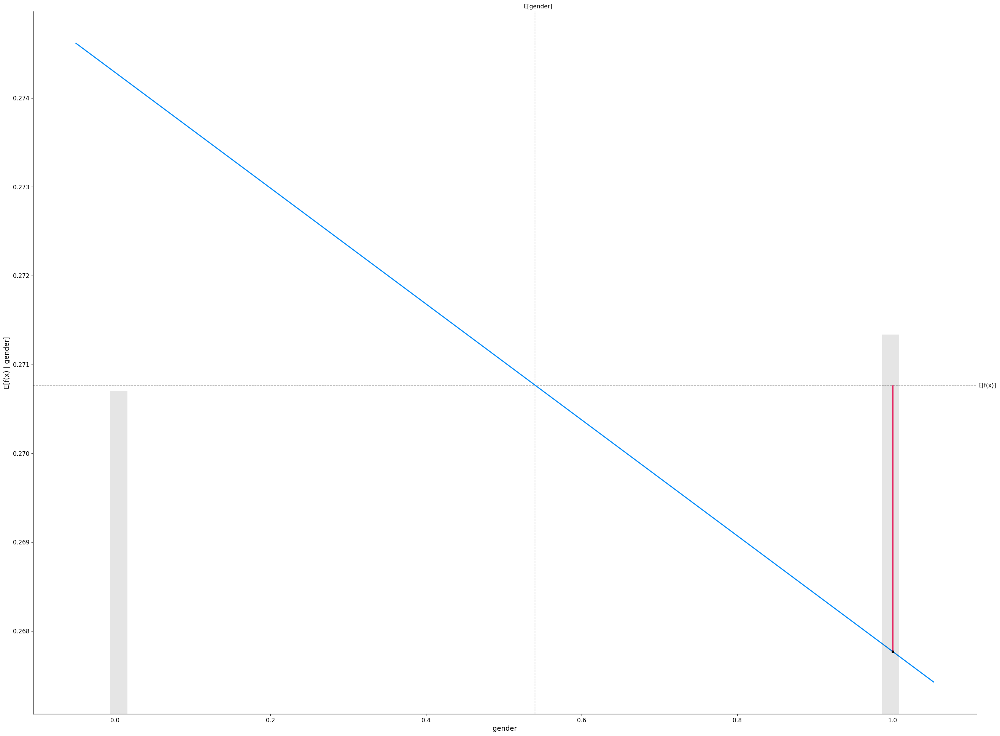

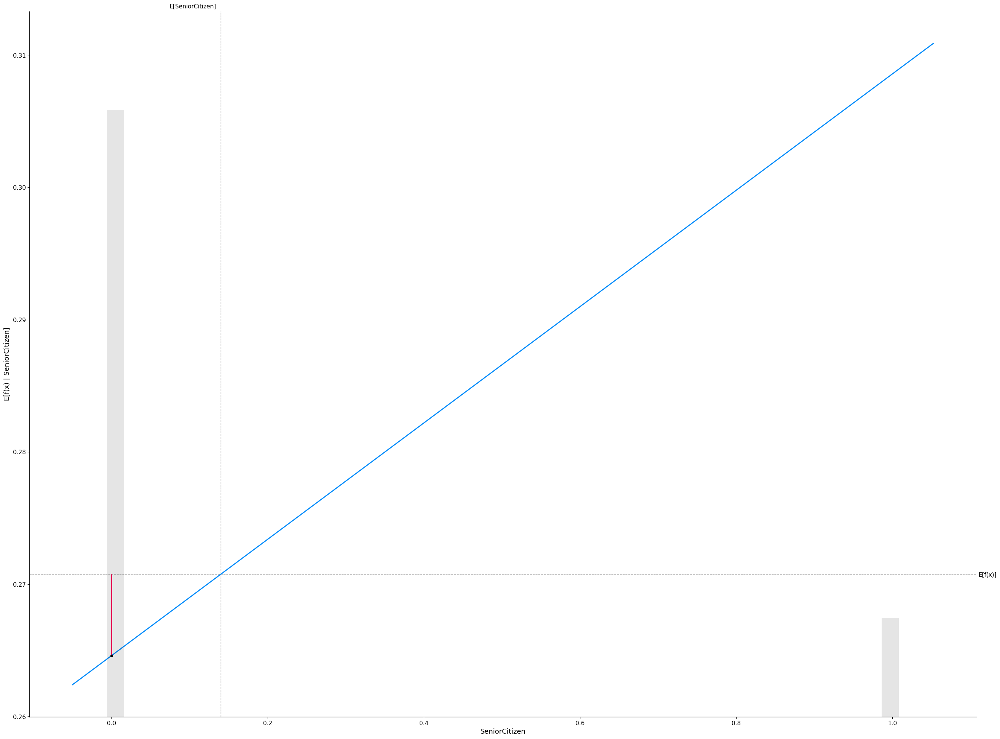

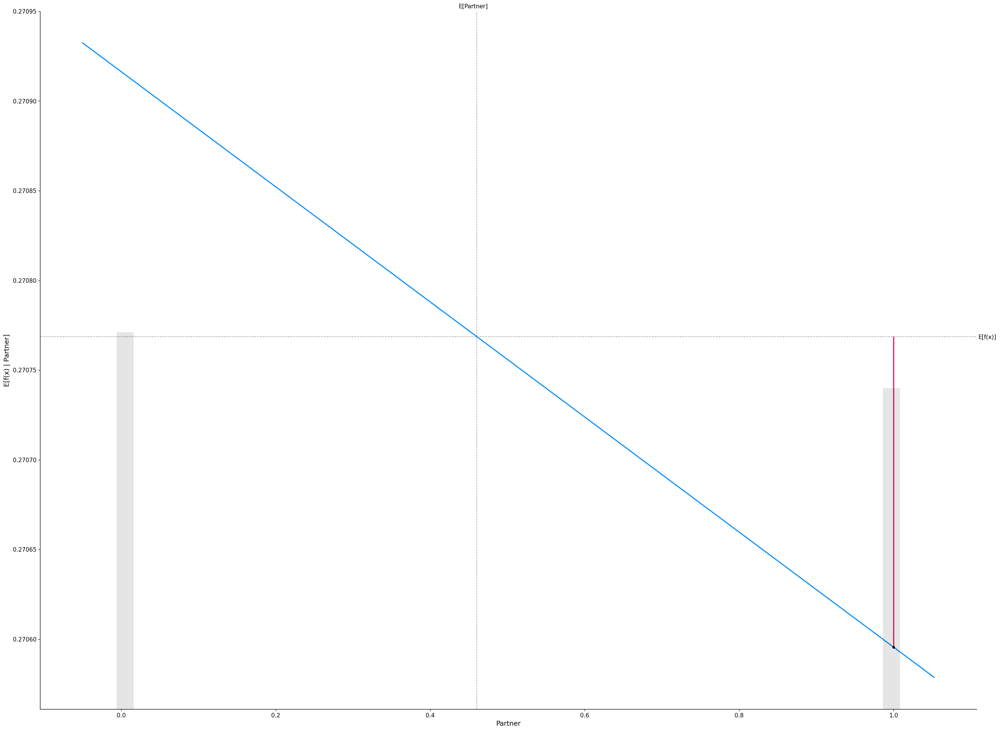

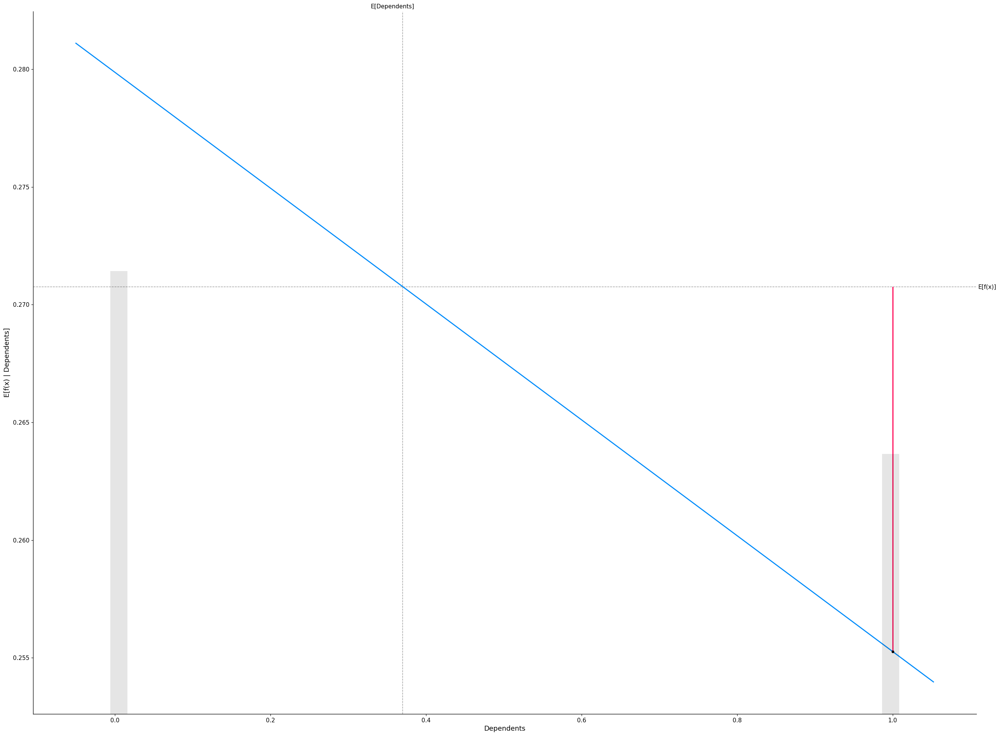

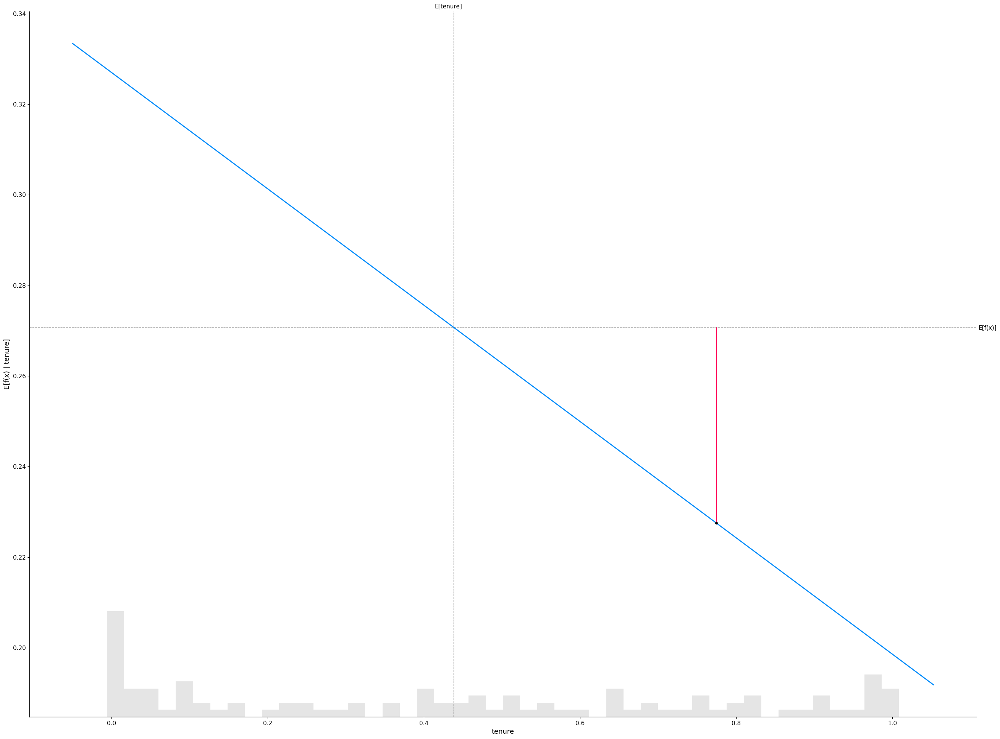

...

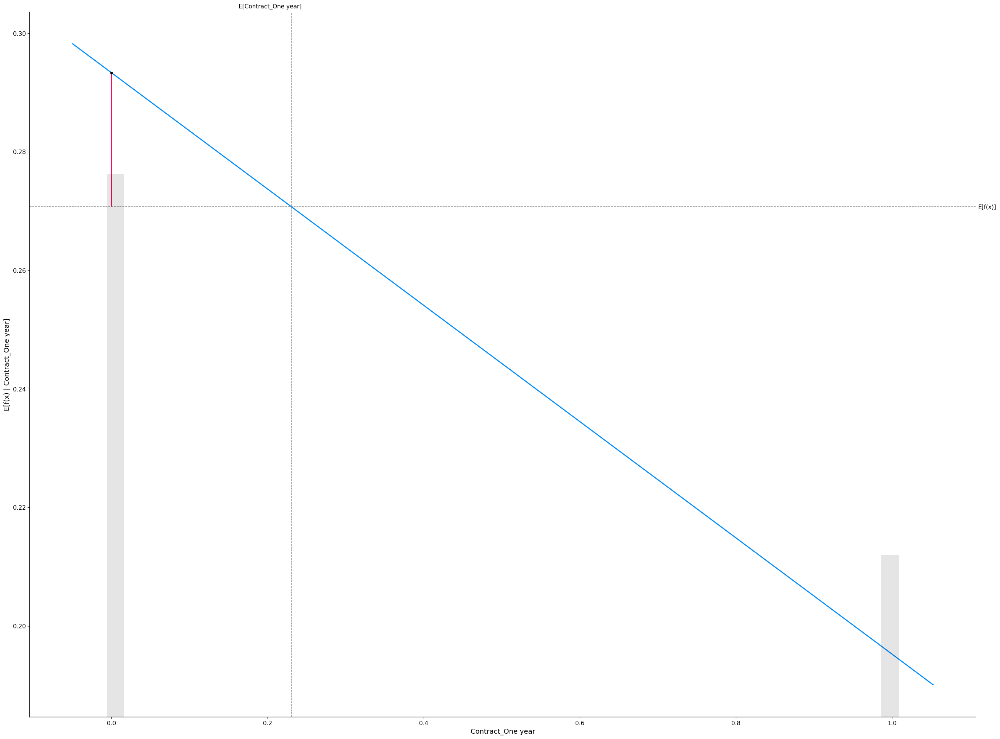

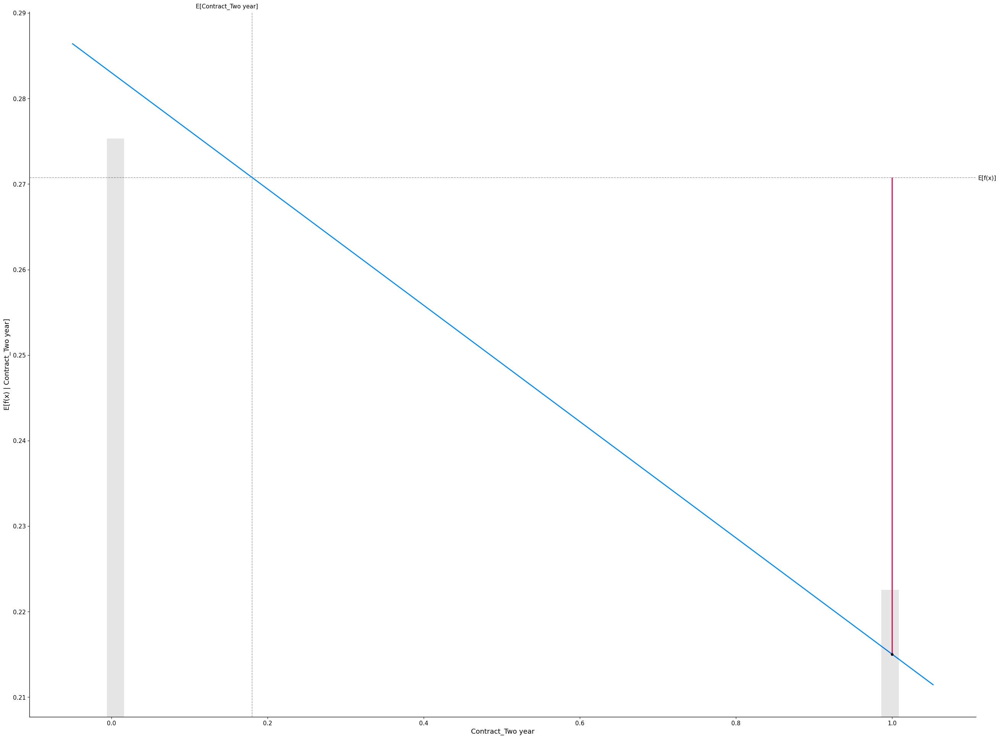

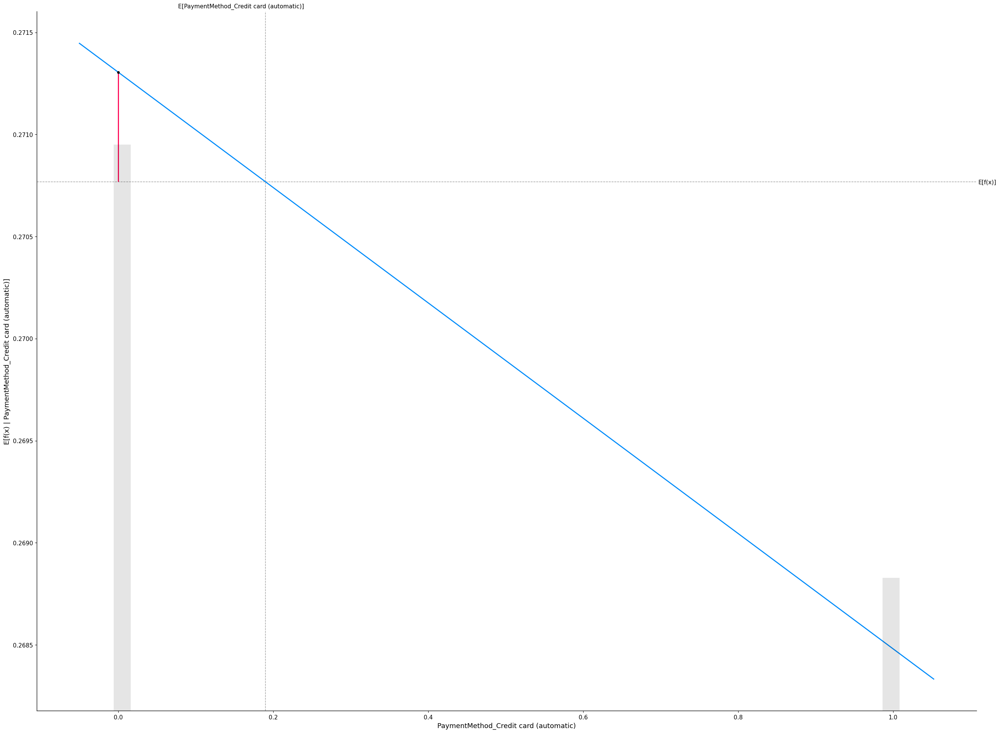

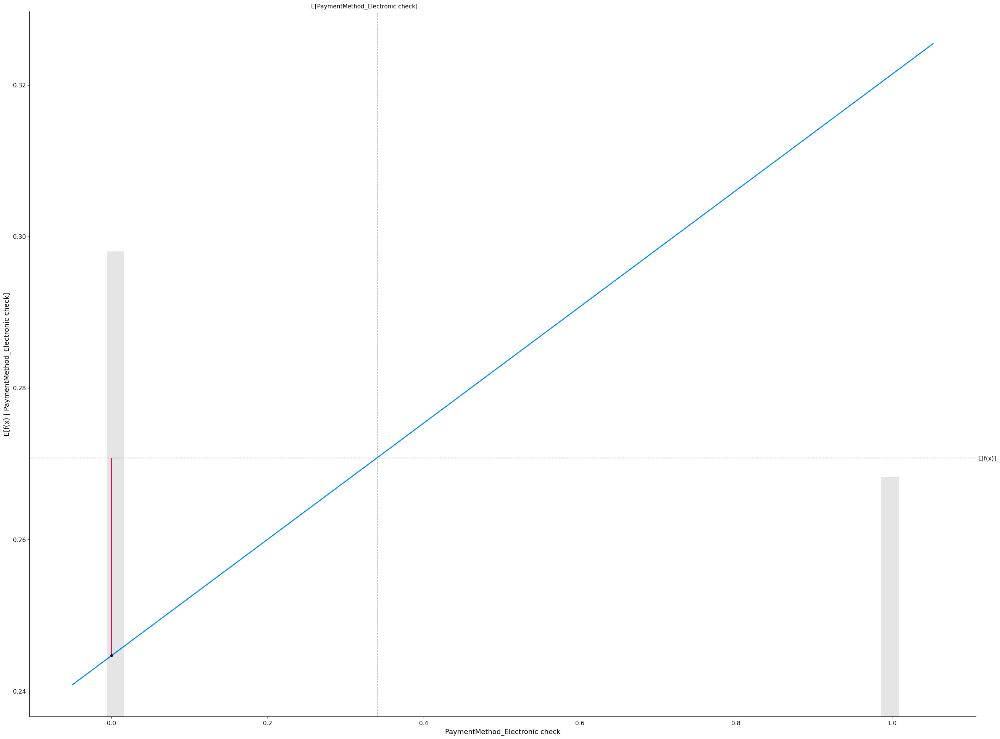

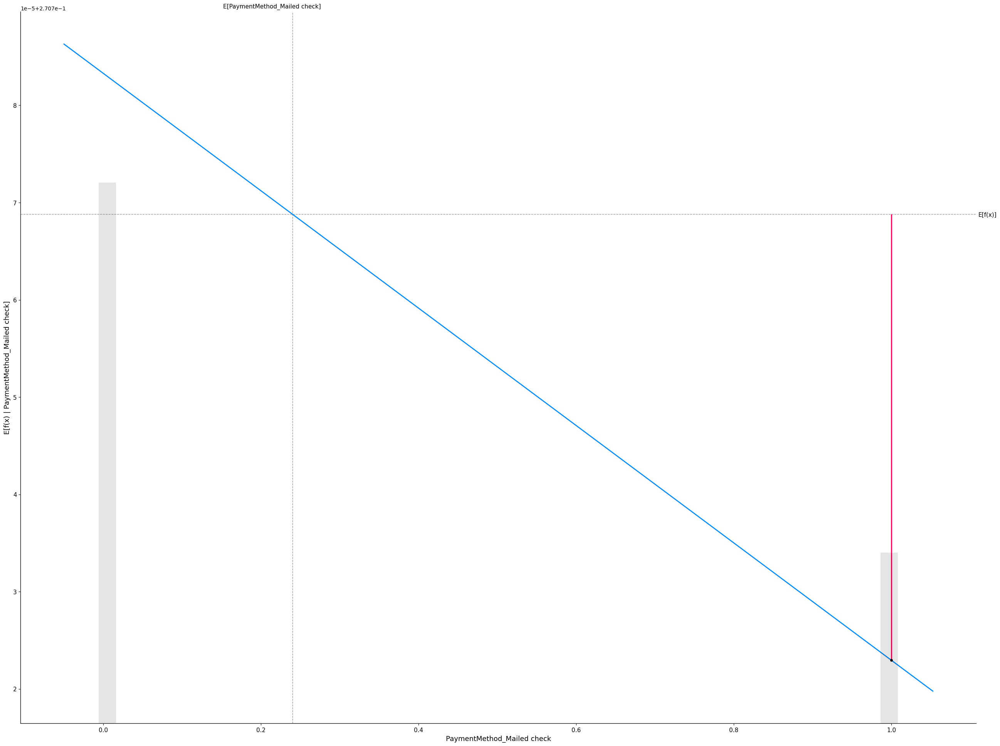

In [97]:
# SHAP explanation of a Linear Model
linear_explainer = shap.Explainer(linear_model.predict, x_train_100)
linear_shap_values = linear_explainer(X_train)
for i in X_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )

Streaming output truncated to the last 5000 lines.

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has featur

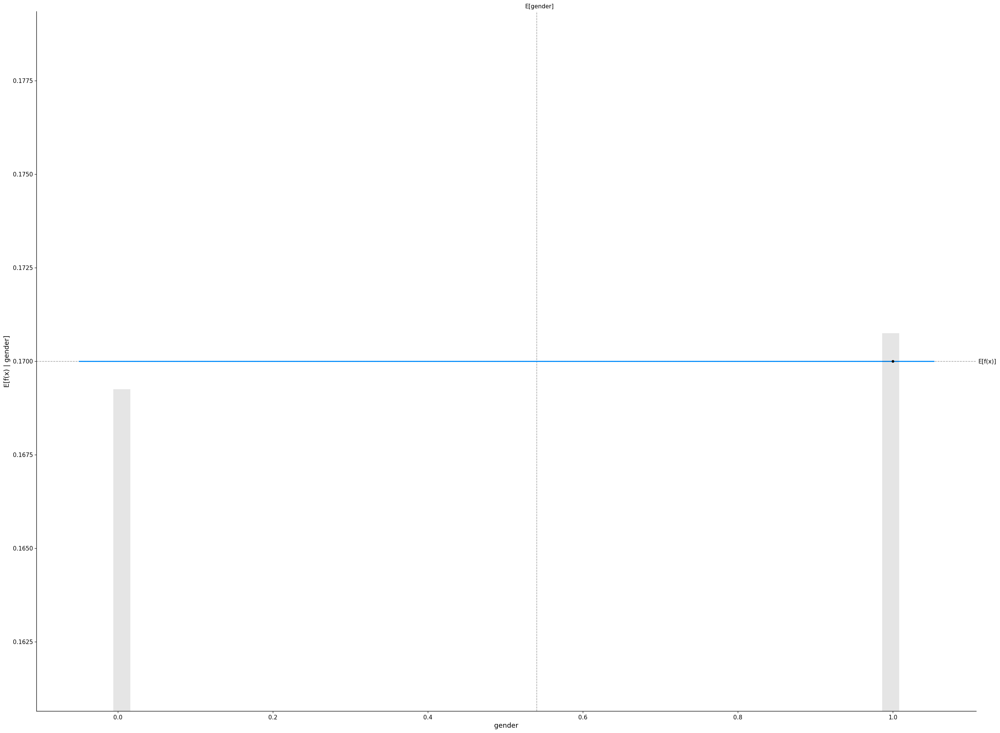

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

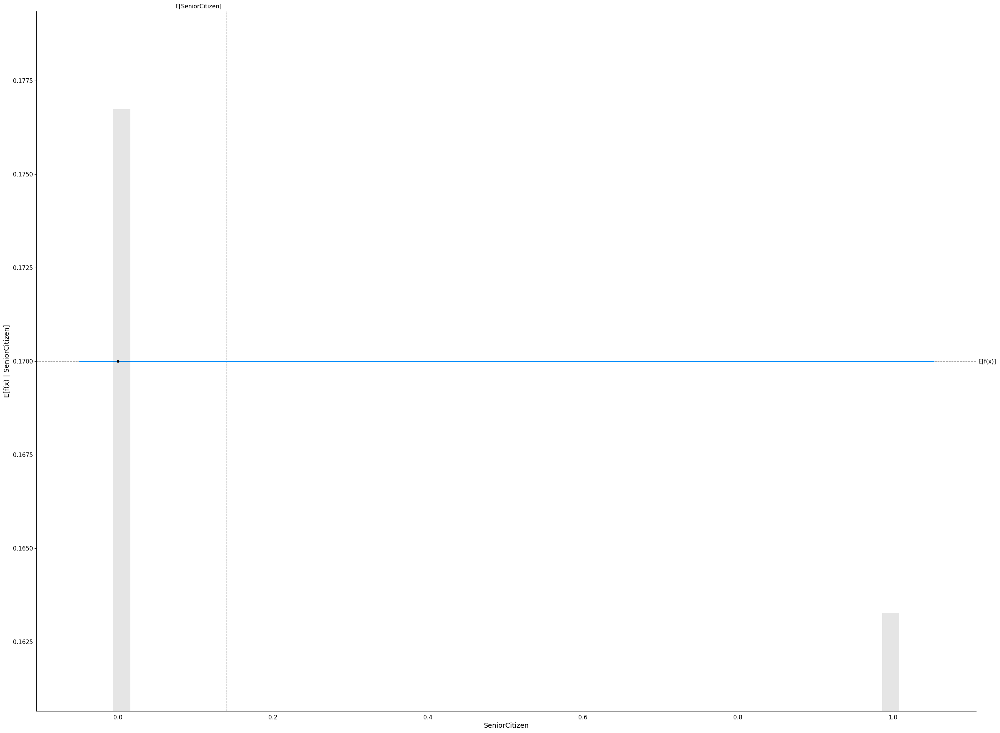

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

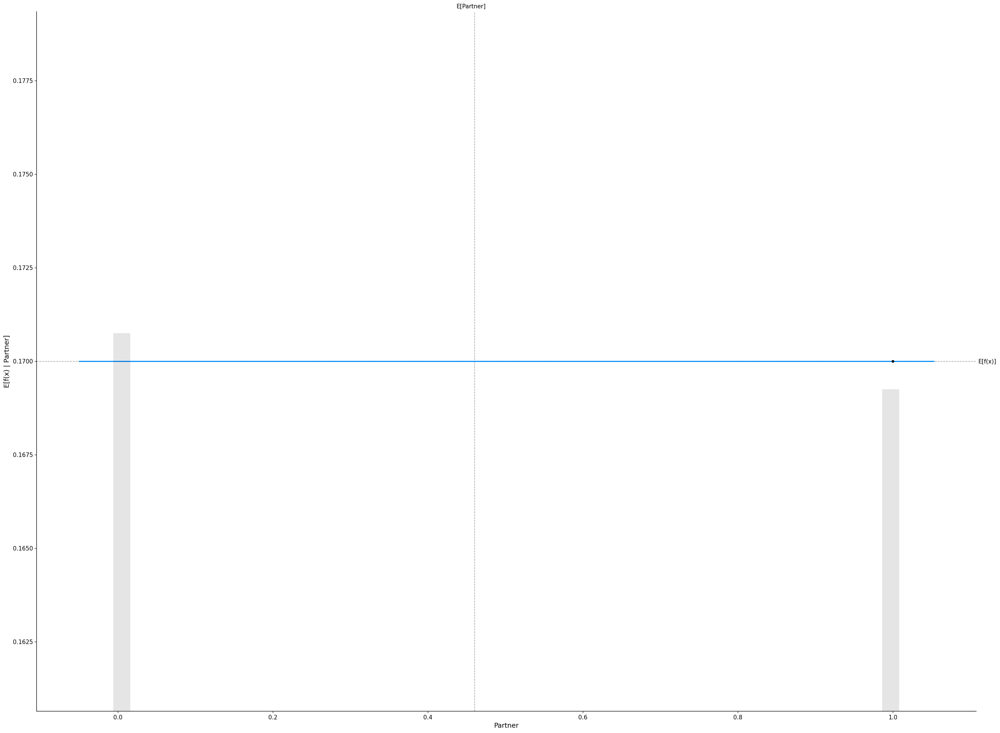

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

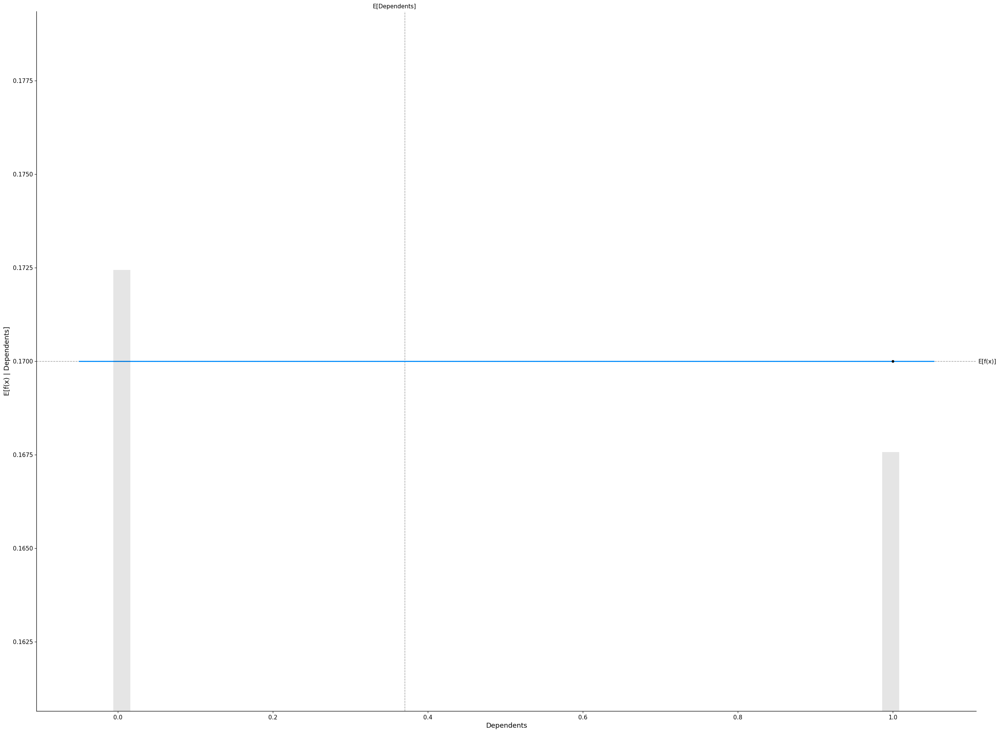

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

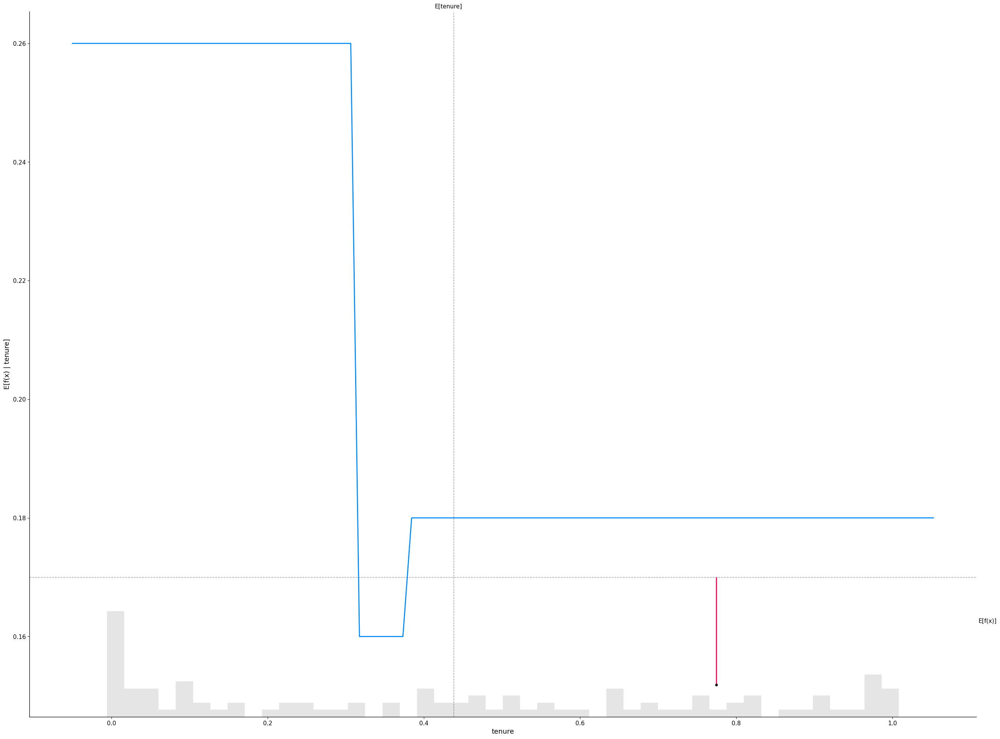

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

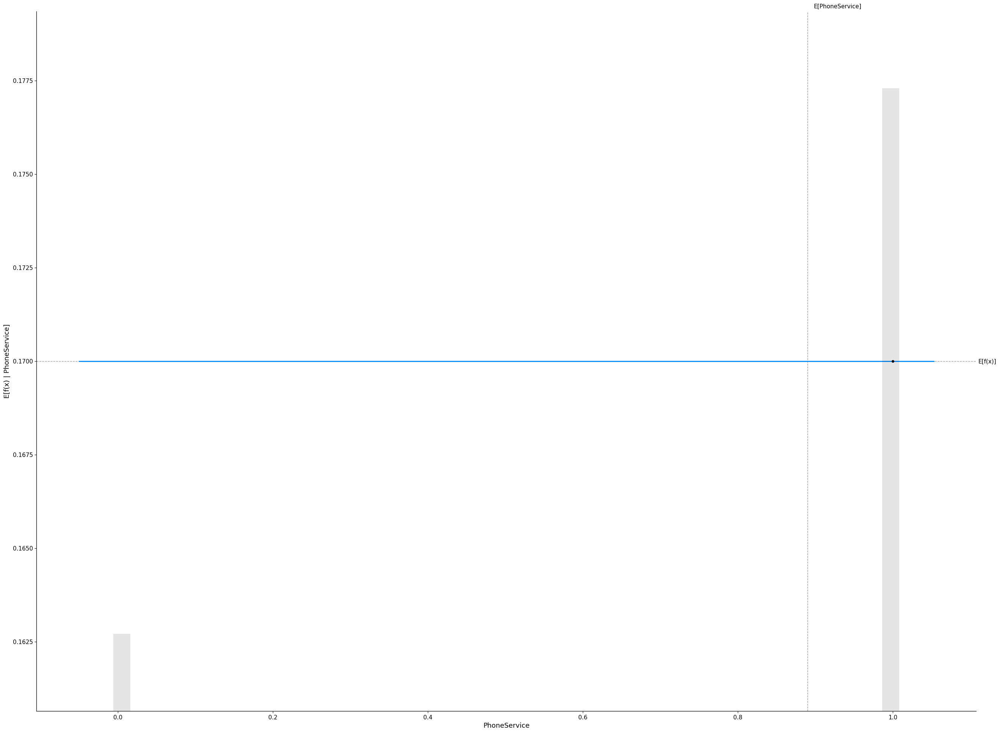

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

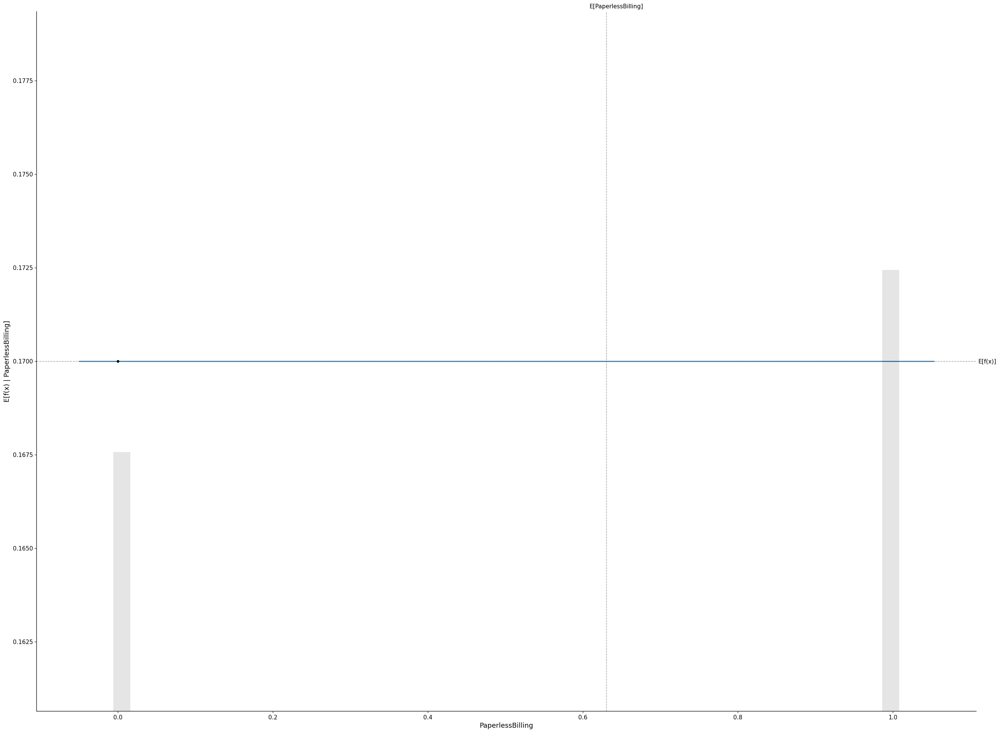

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

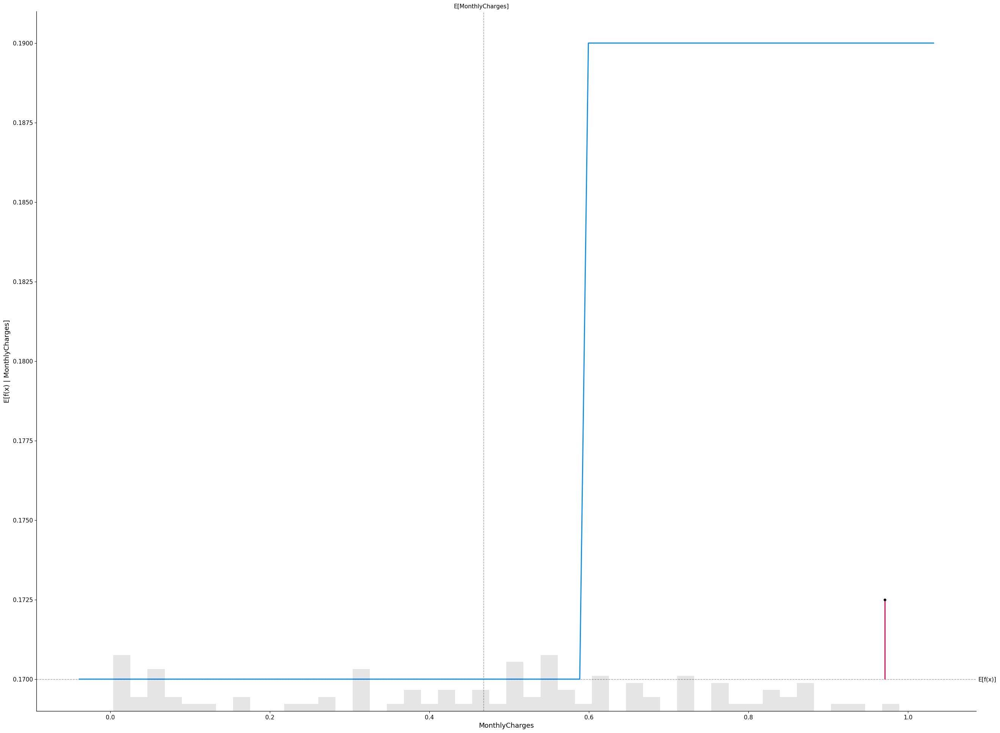

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

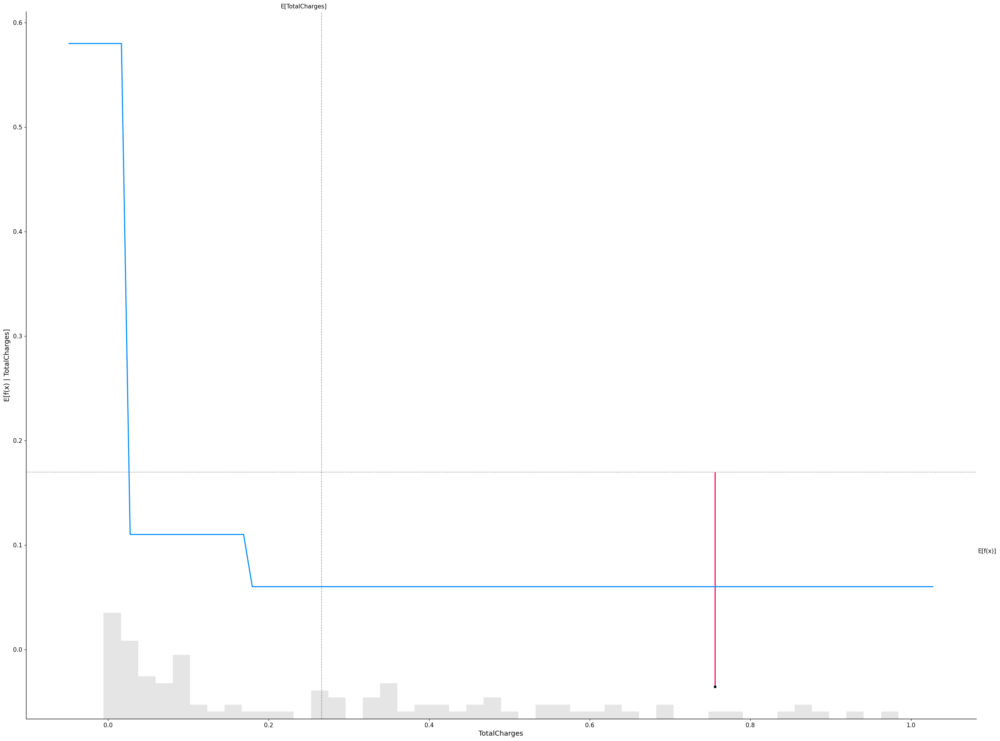

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

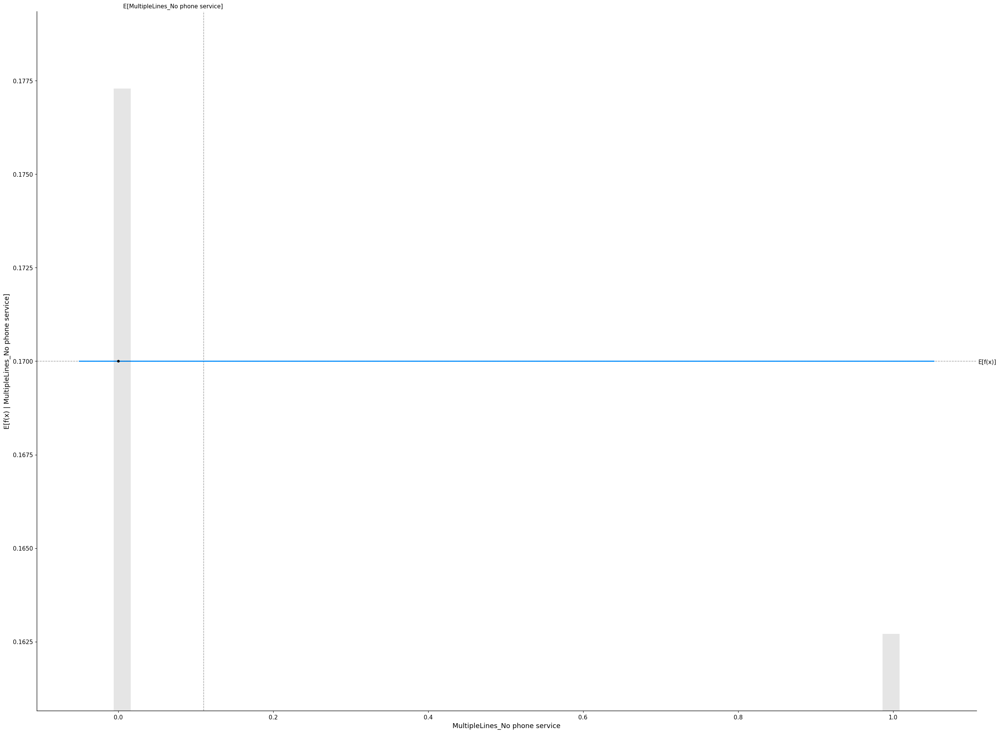

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

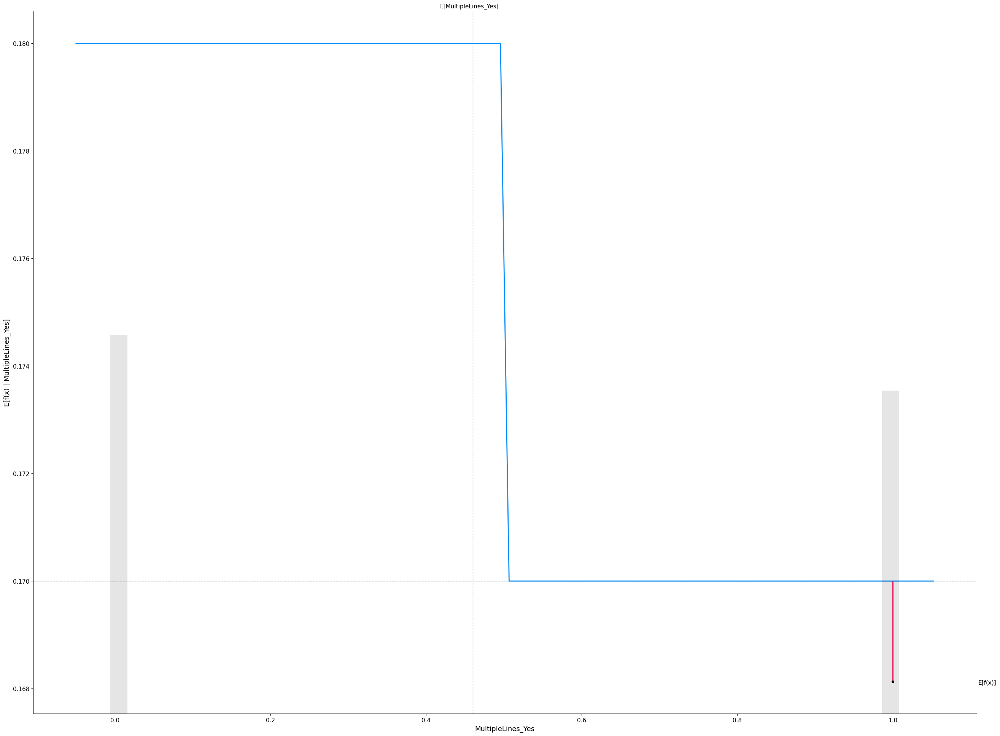

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

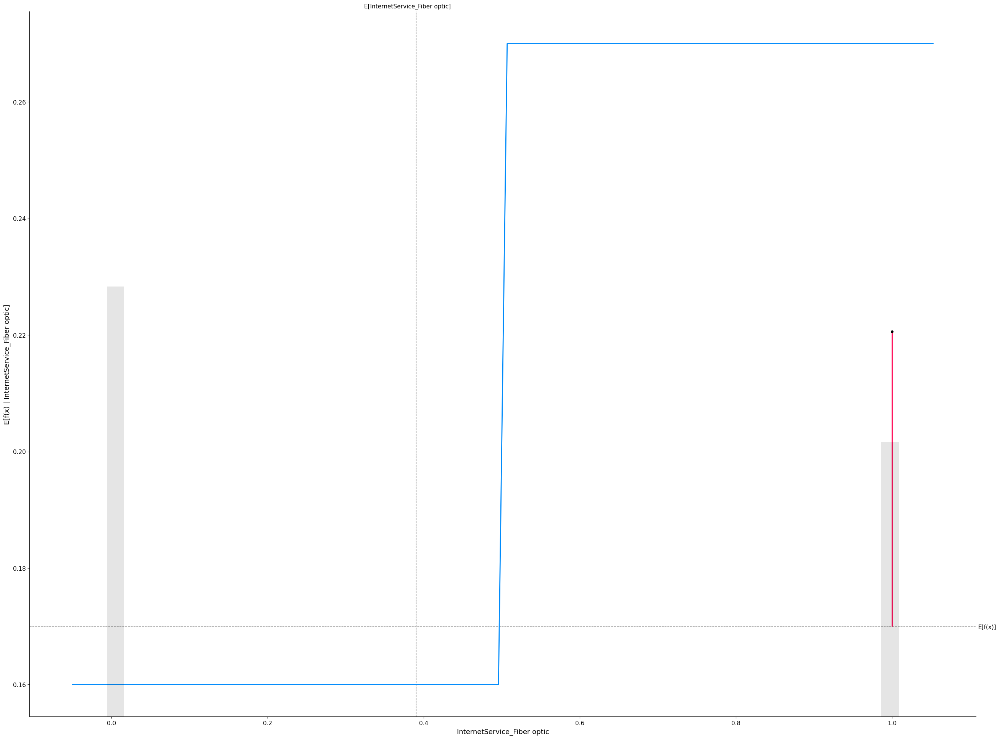

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

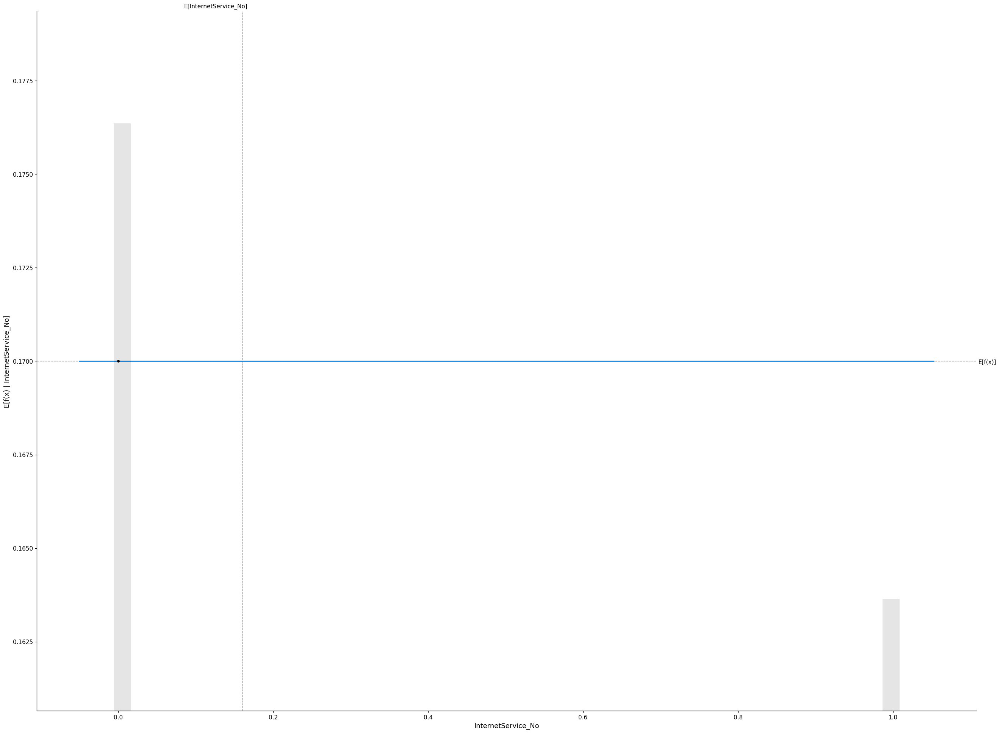

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

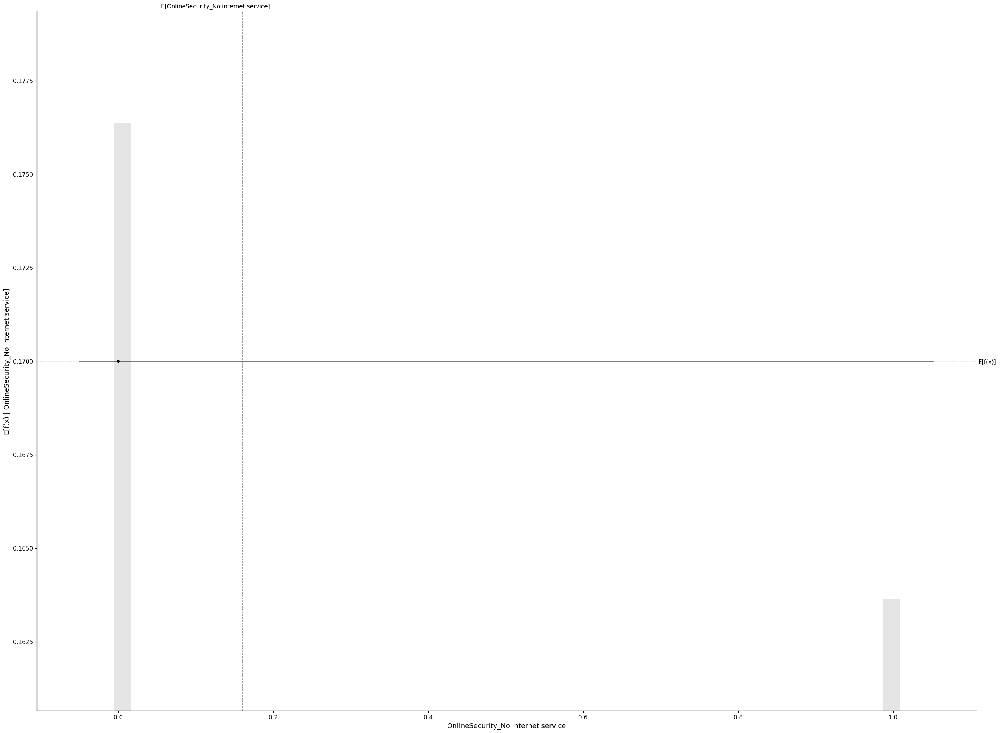

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

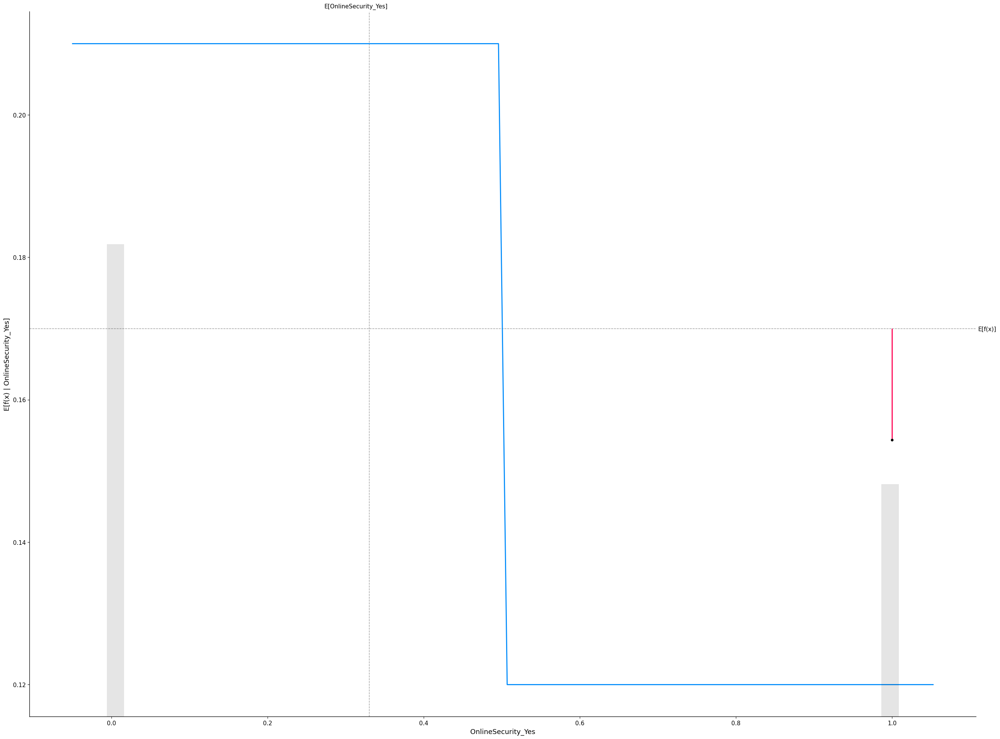

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

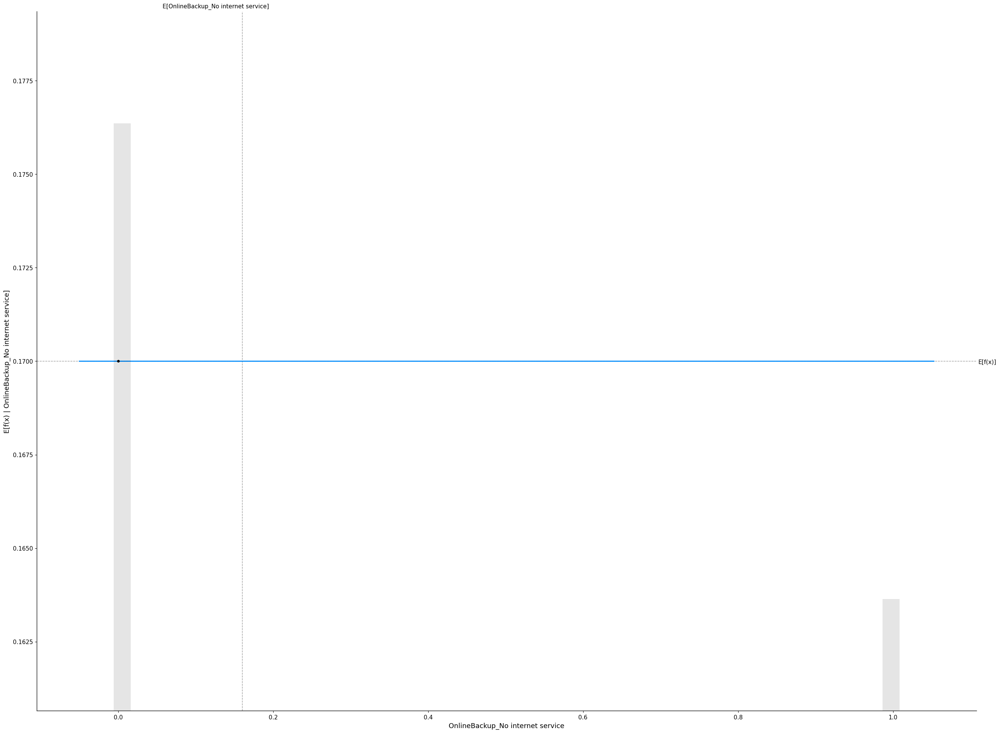

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

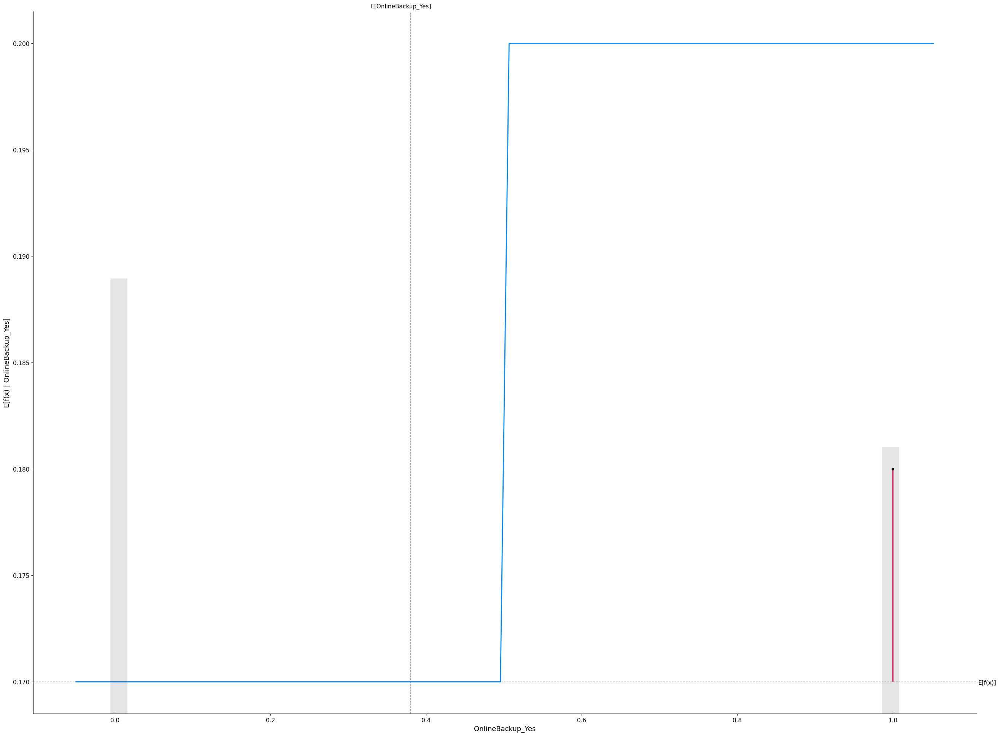

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

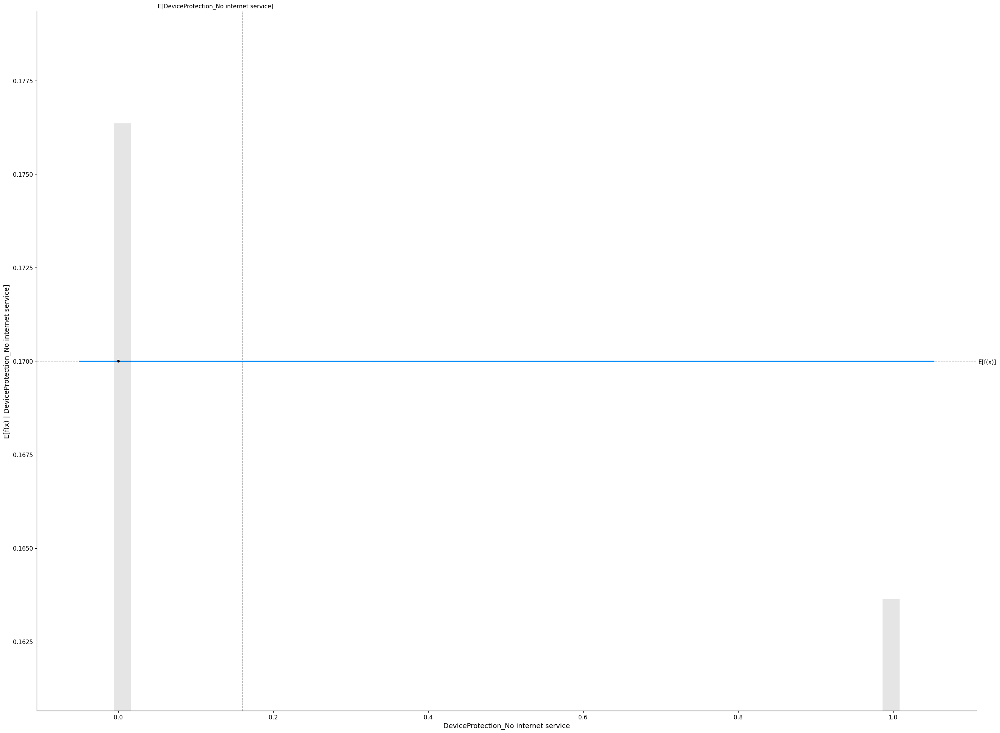

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

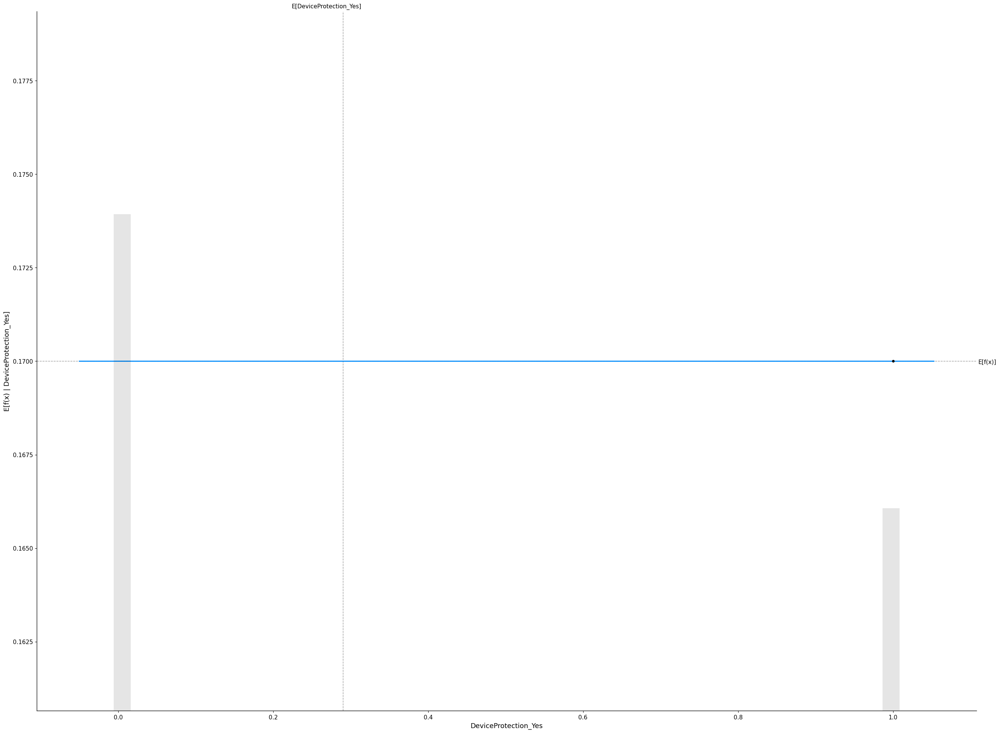

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

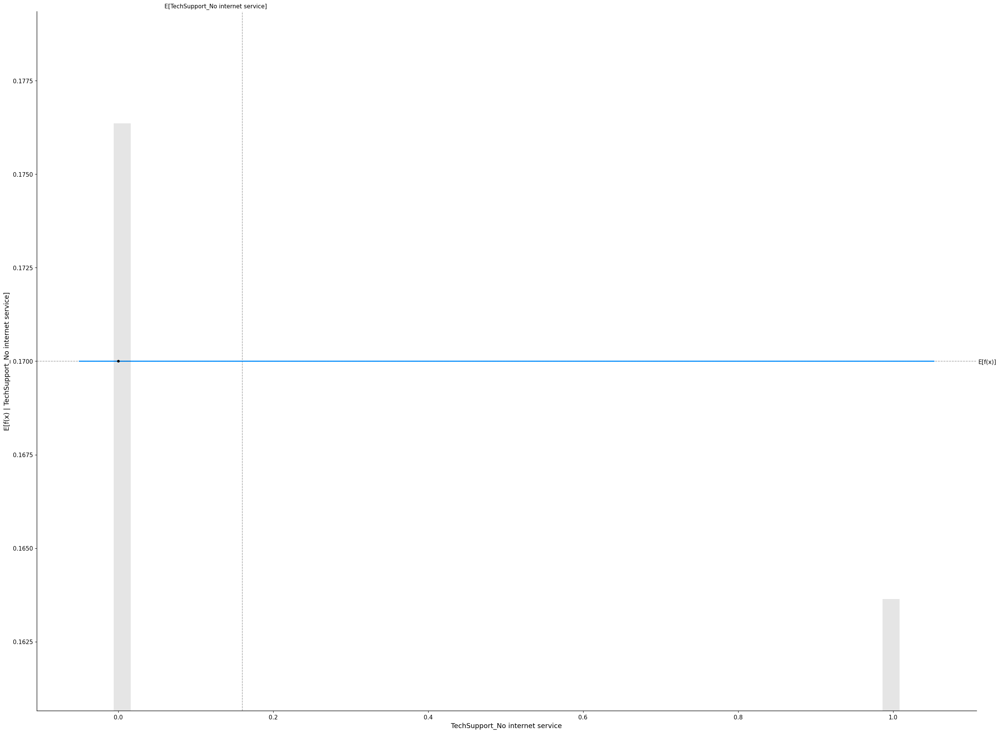

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

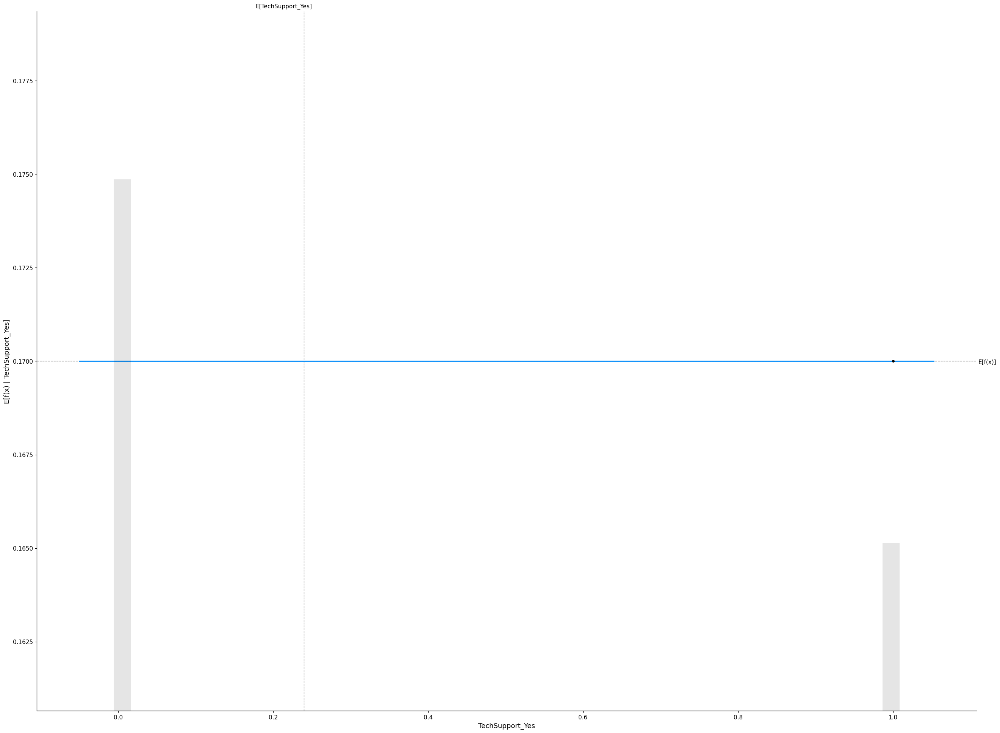

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

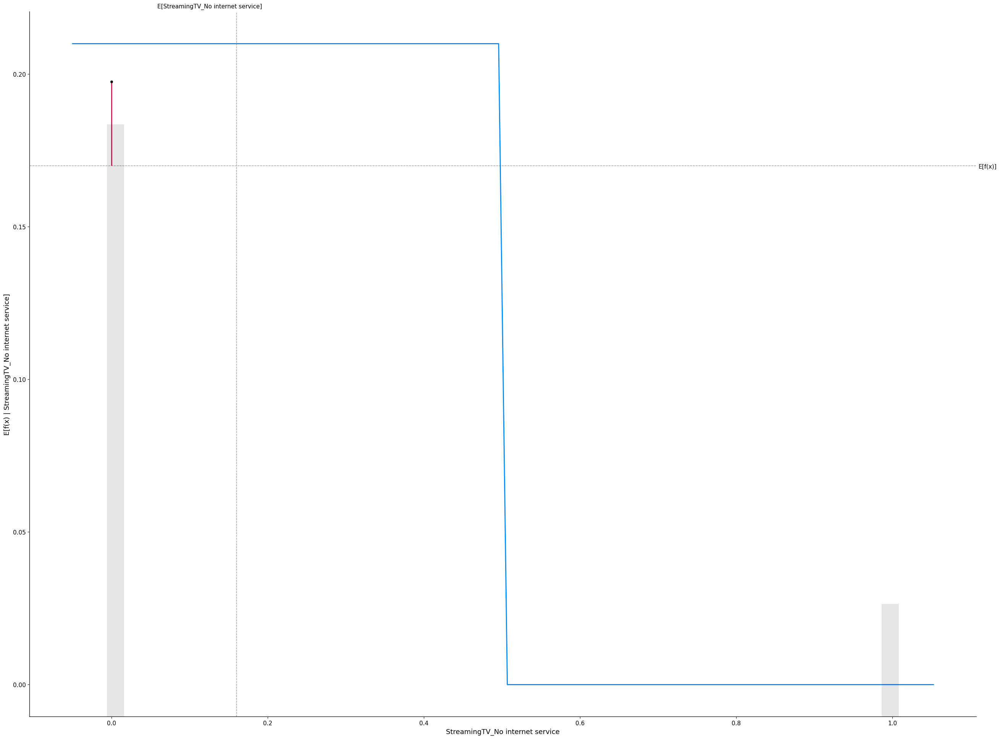

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

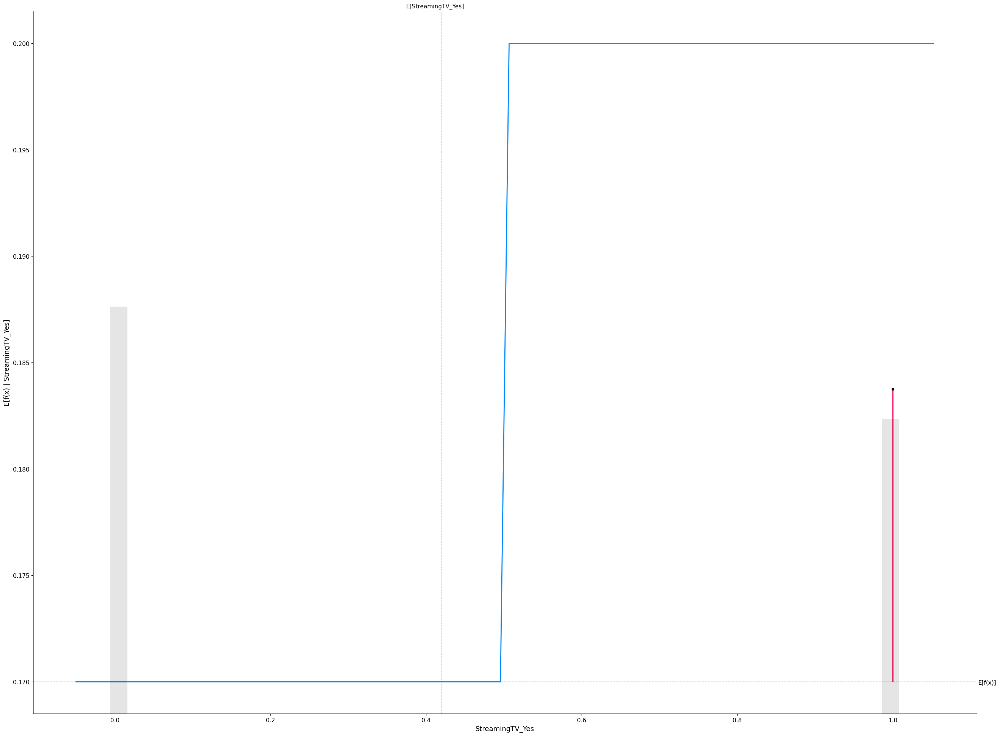

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

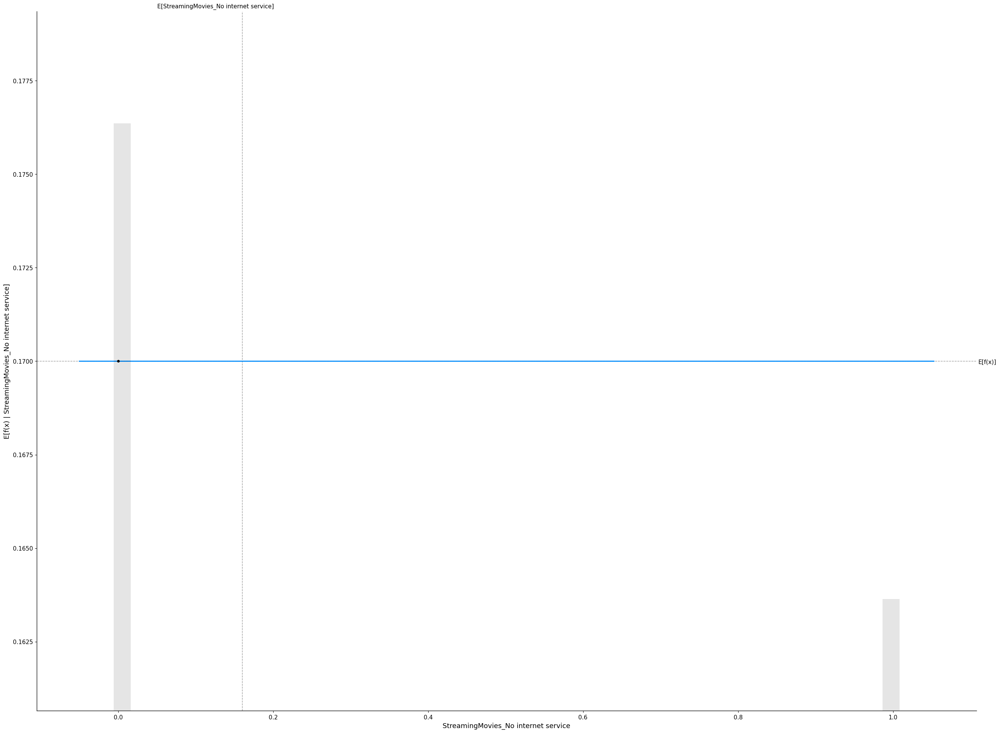

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

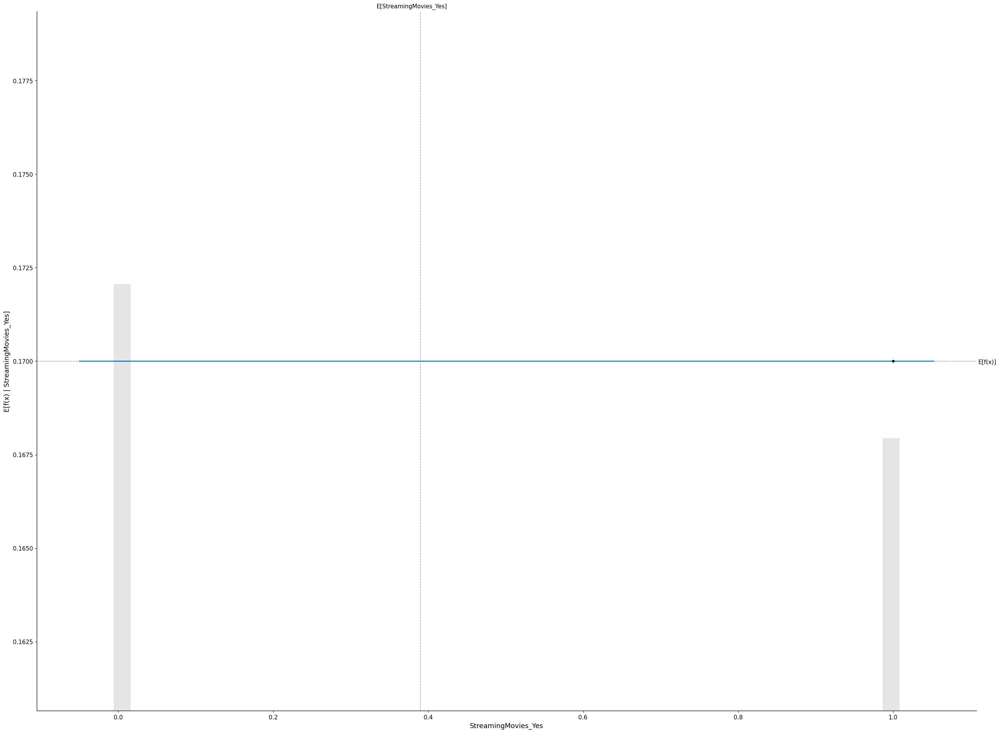

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

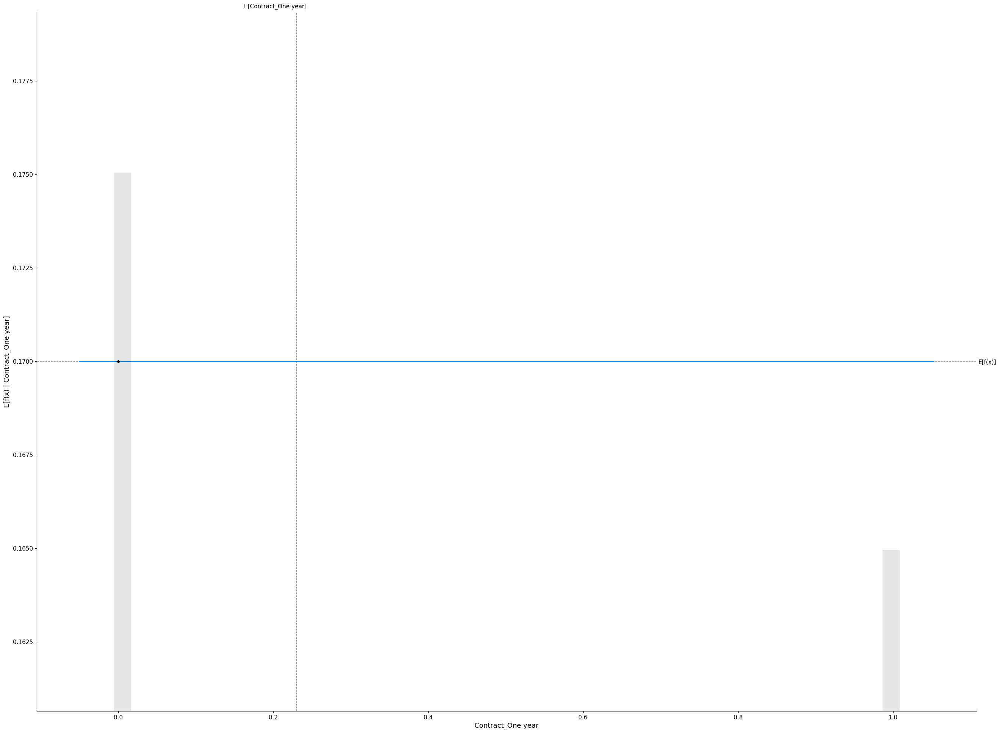

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

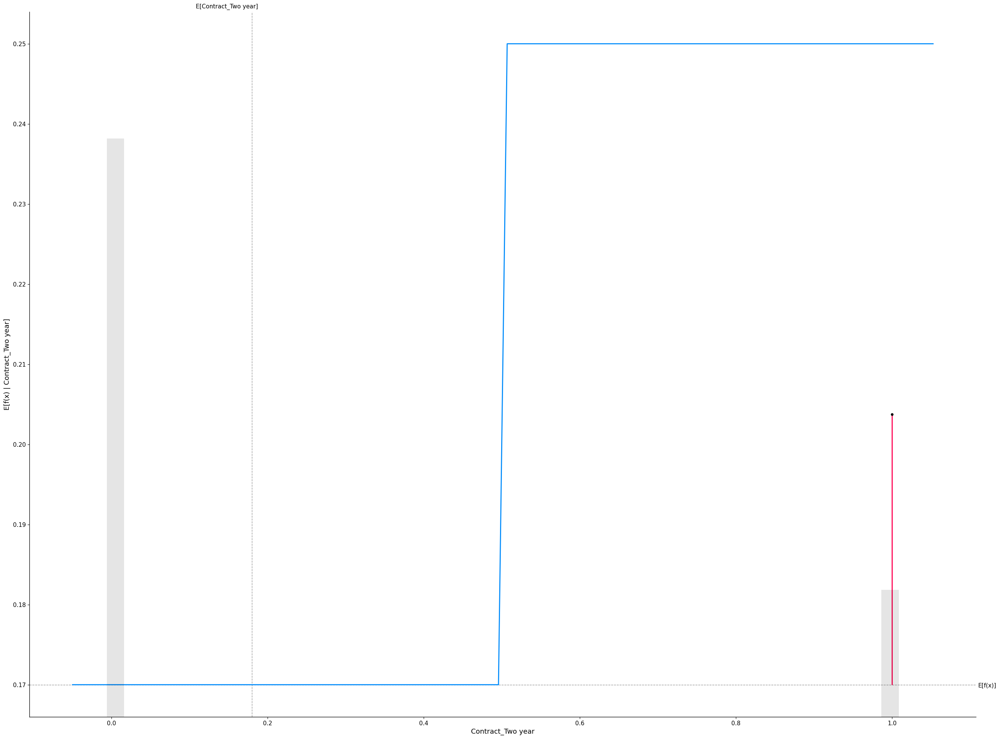

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

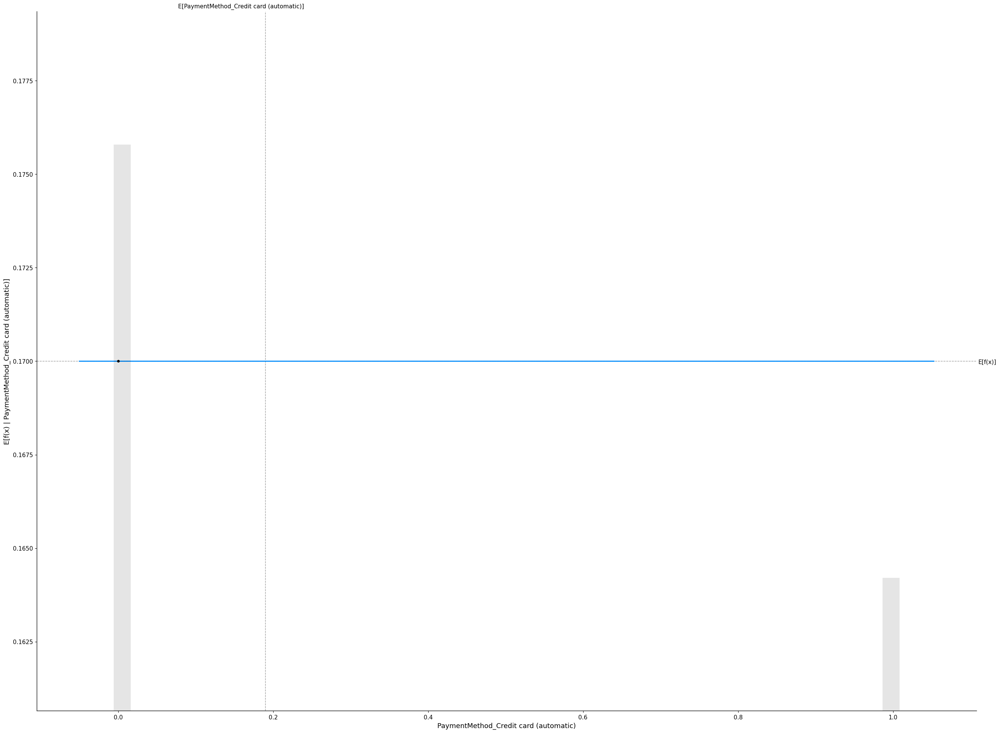

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

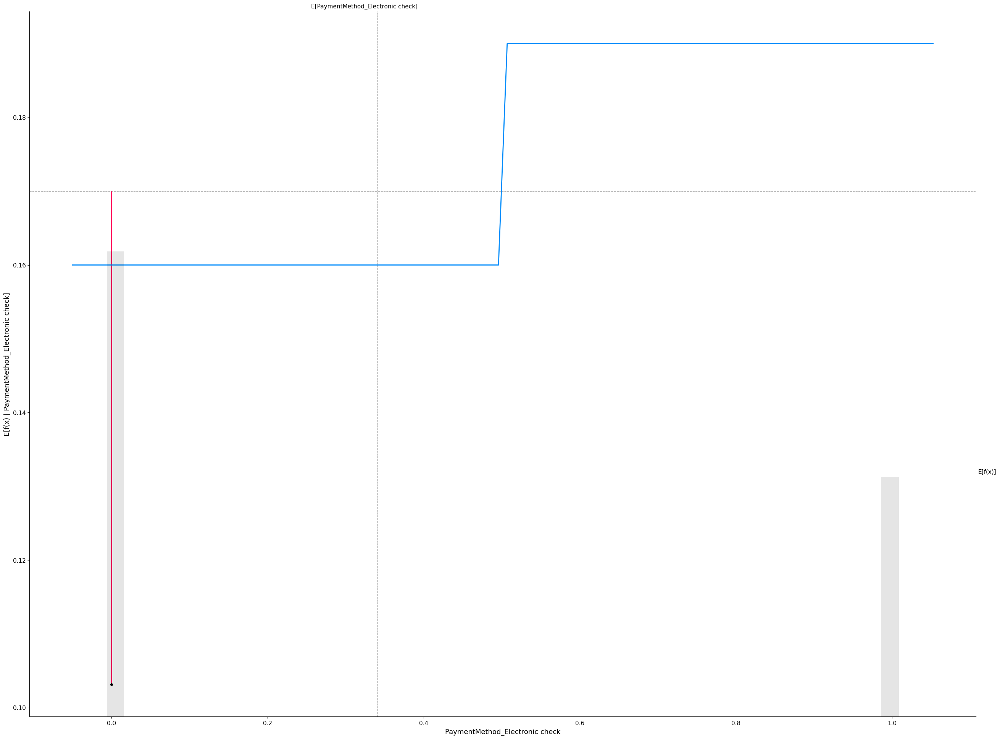

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: User

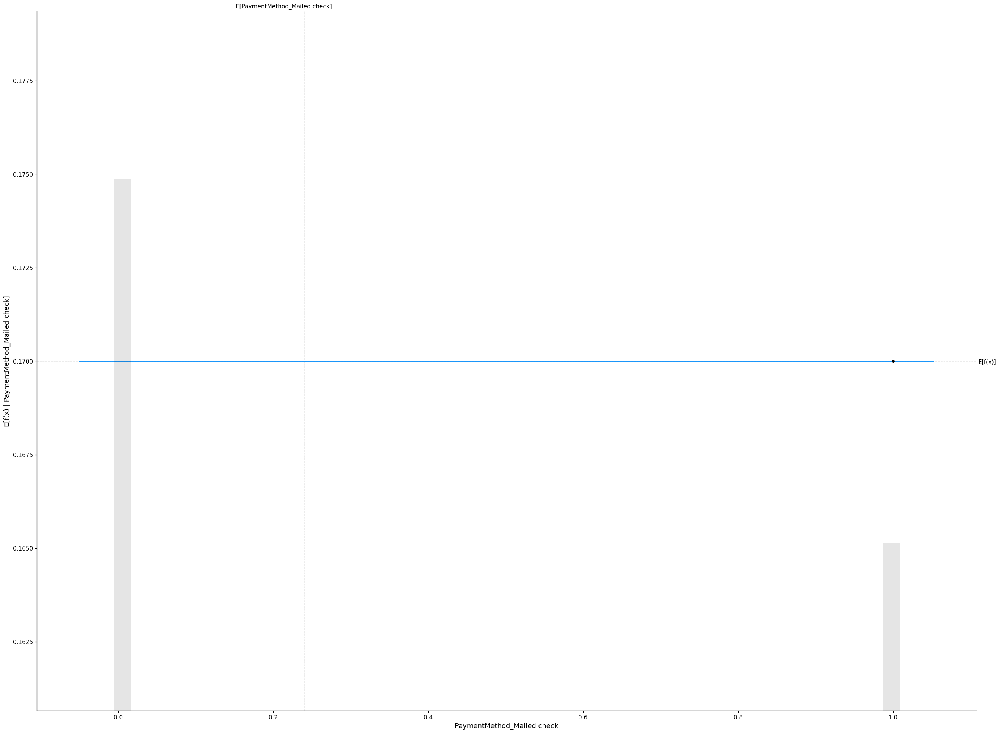

In [98]:
# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(tree_model.predict, x_train_100)
tree_shap_values = tree_explainer(X_train)
for i in X_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        tree_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

# **Interpreting SHAP Feature Importance Plot for Linear and Tree-based model**

SHAP feature importance- Features with large absolute Shapley values are important. 

The following plots are:-
1. SHAP feature importance for a linear model
2. SHAP feature importance for tree-based model

For the linear model, InternetService_Fiber Optic is the second most important feature but for tree-based model tenure is the second most important feature.

In [99]:
lr_explainer = shap.Explainer(model_rf.predict, x_train_100)
lr_shap_values = lr_explainer(x_train_100)

Permutation explainer: 101it [07:48,  4.78s/it]


In [100]:
lr_explainer = shap.Explainer(model_rf.predict, x_train_100)
lr_shap_values = lr_explainer(x_train_100)

Permutation explainer: 101it [06:44,  4.12s/it]


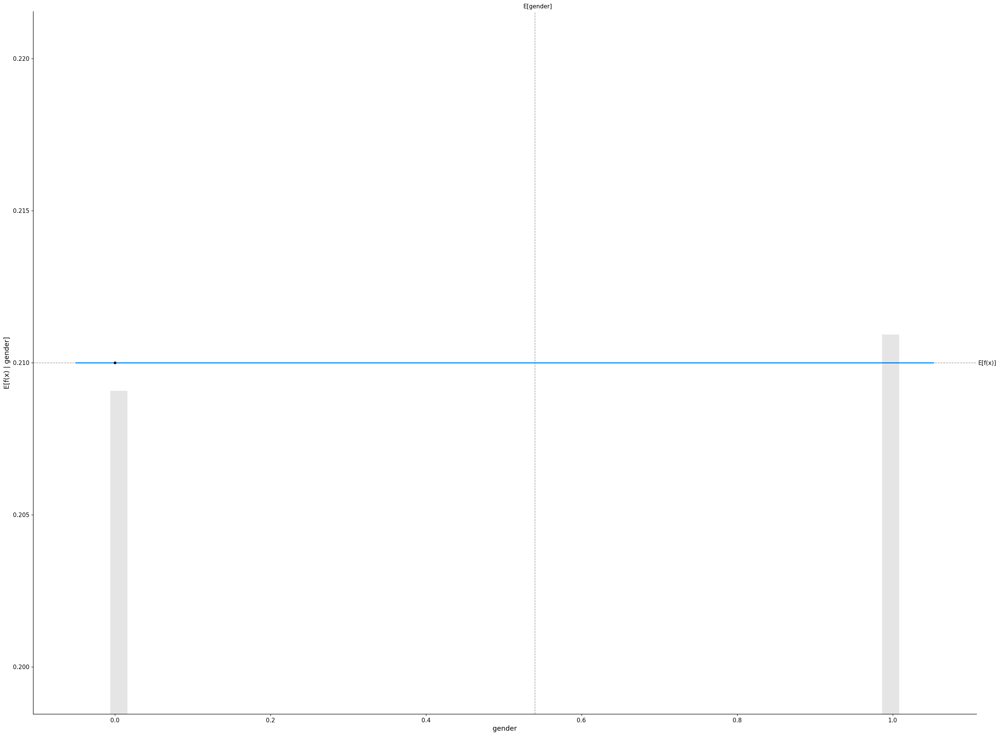

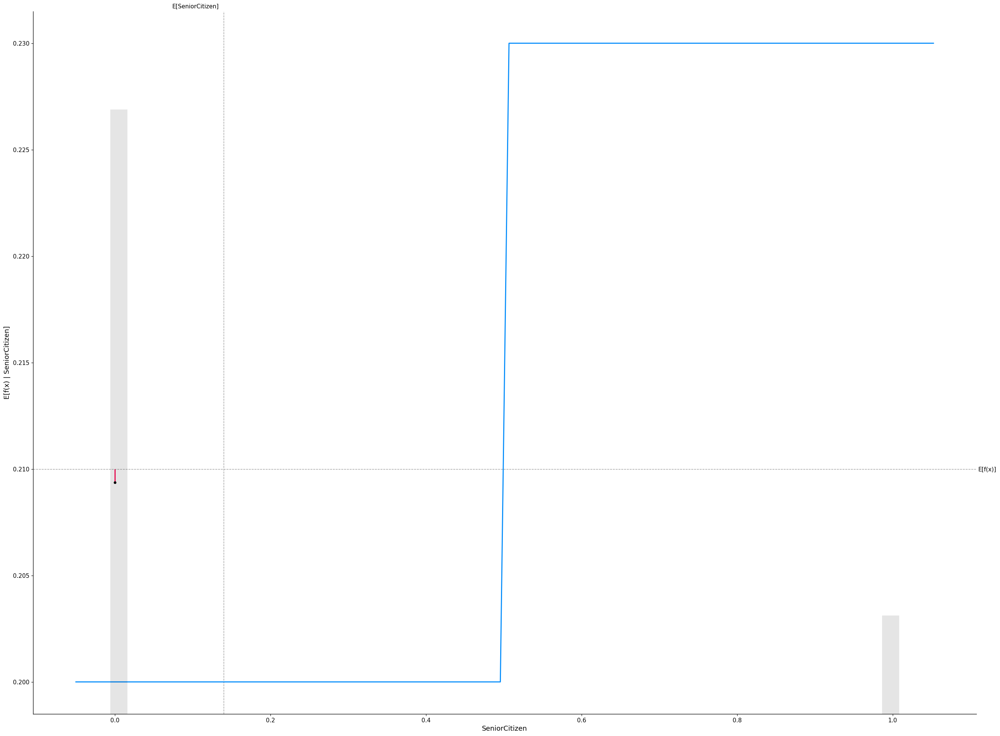

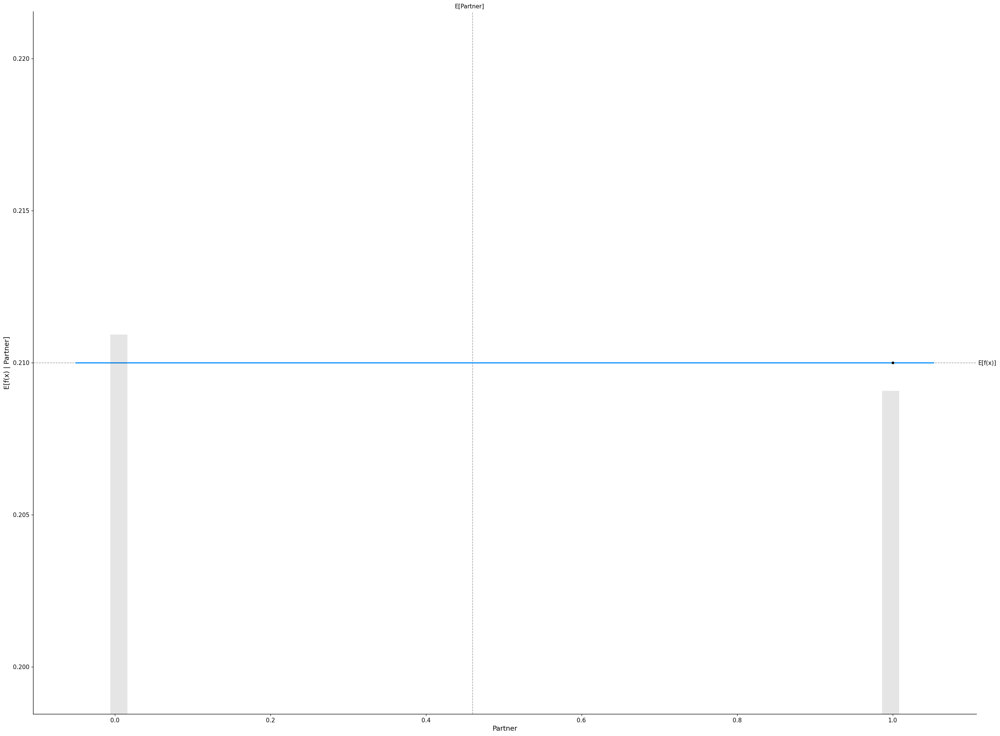

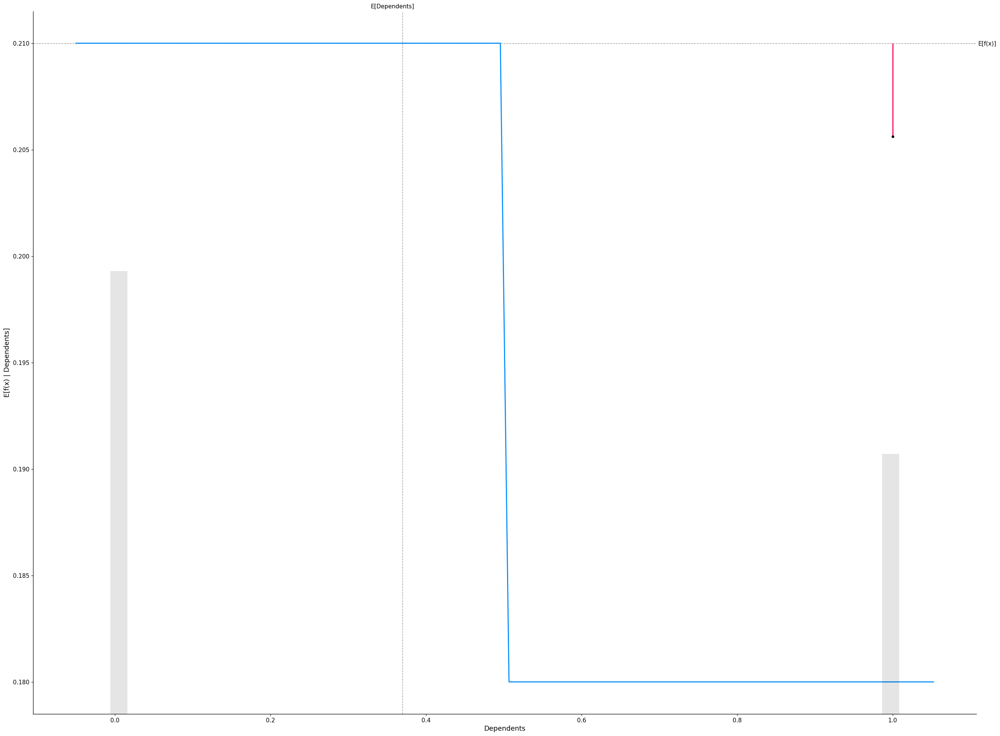

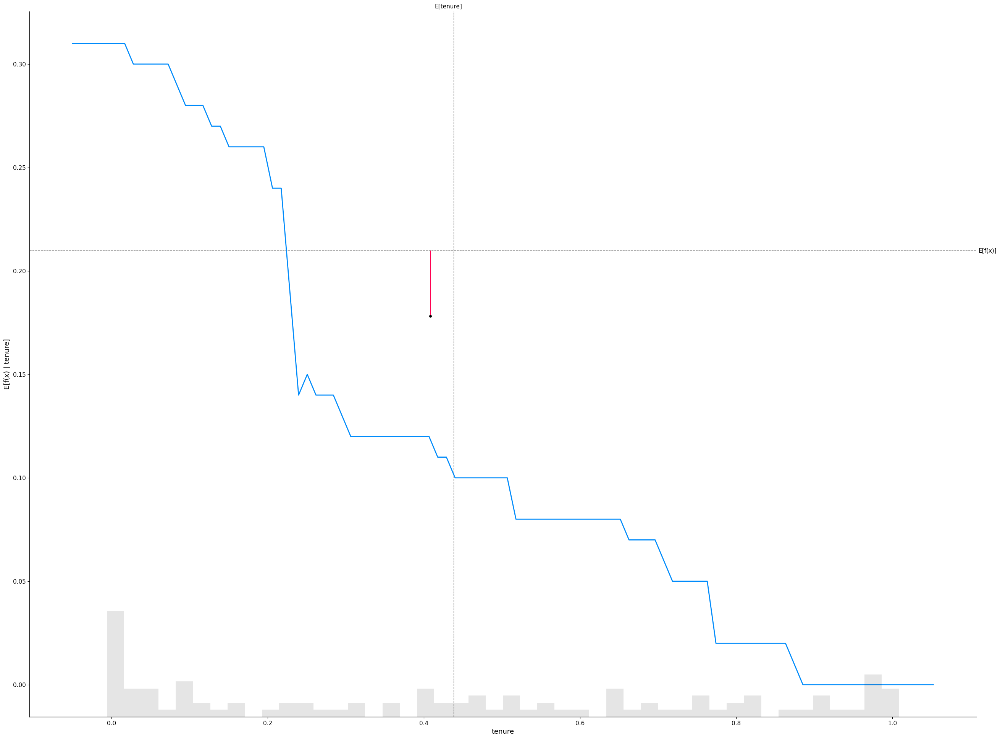

...

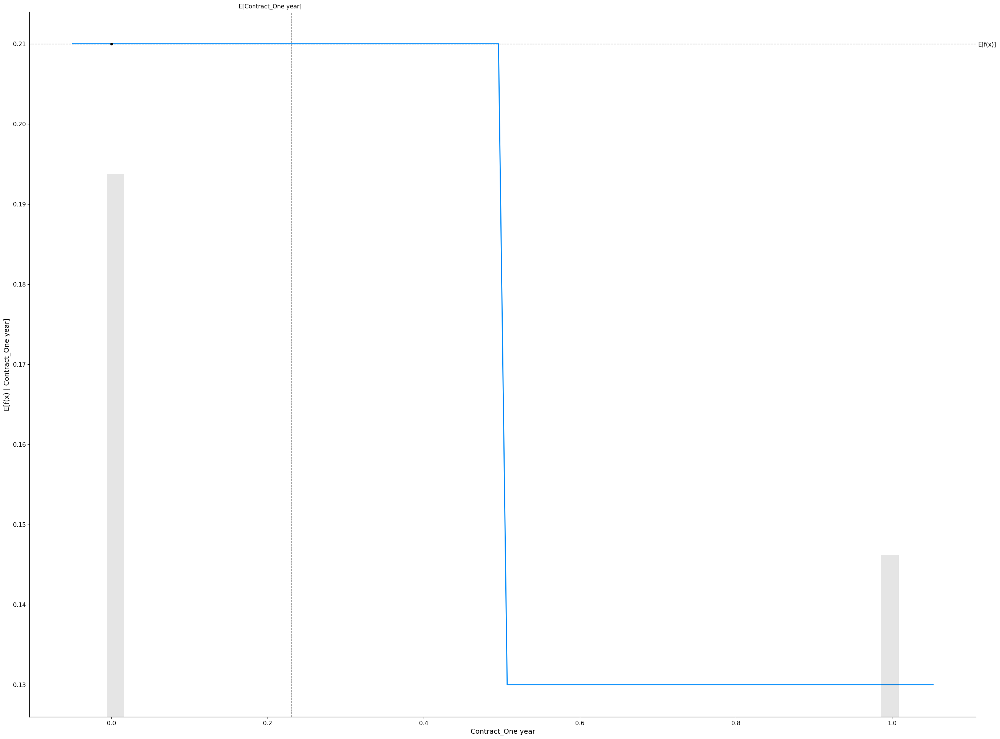

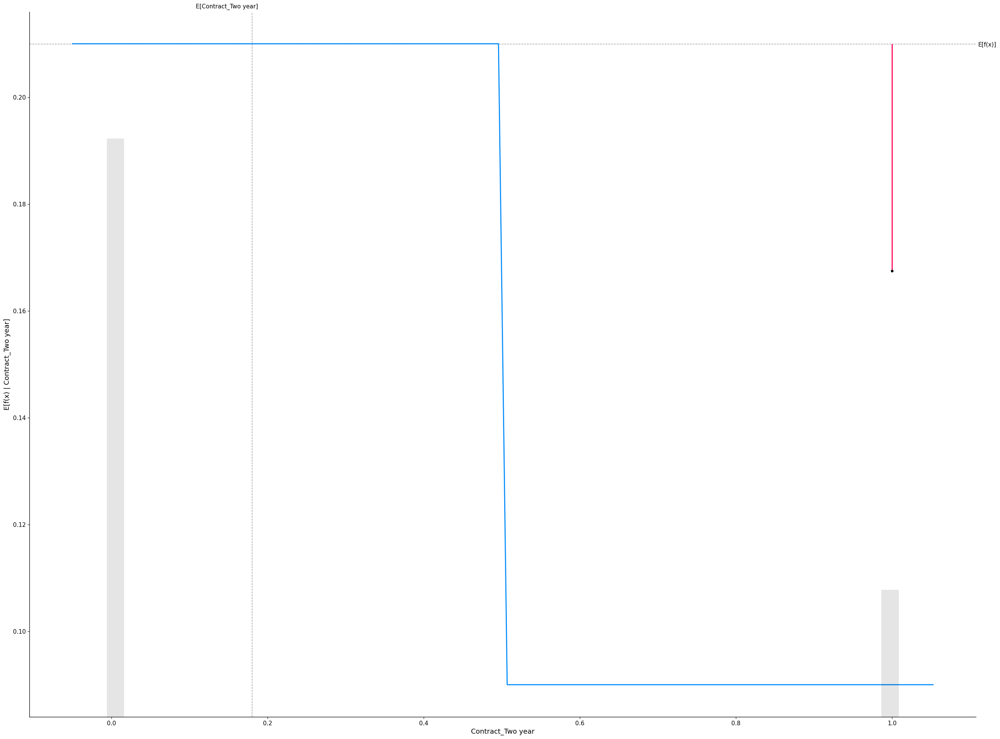

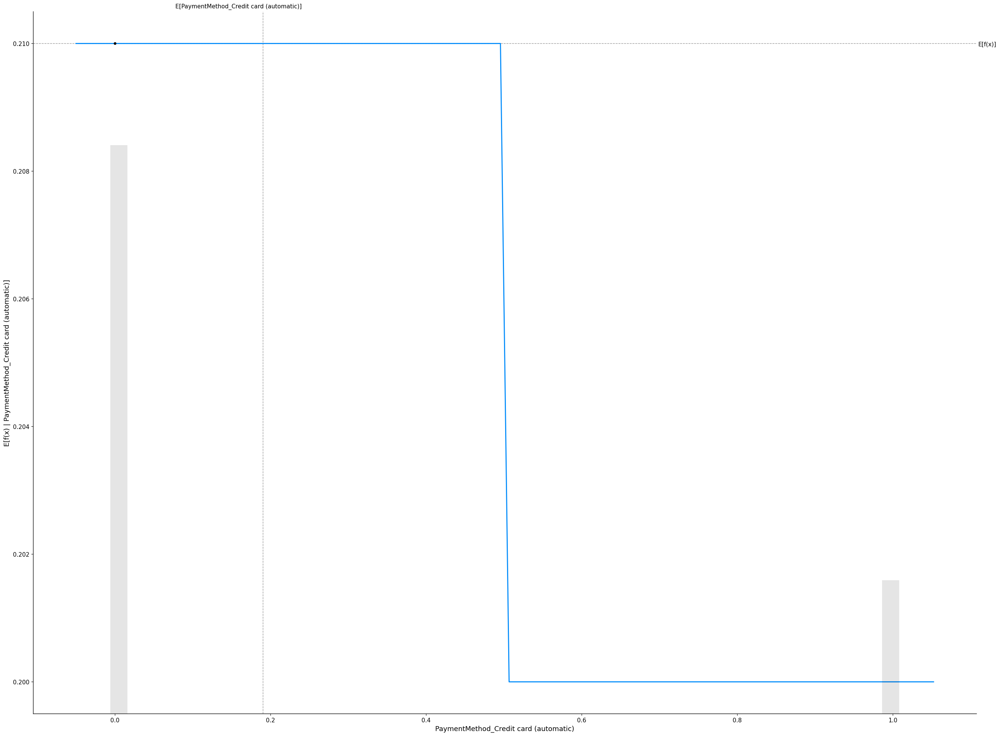

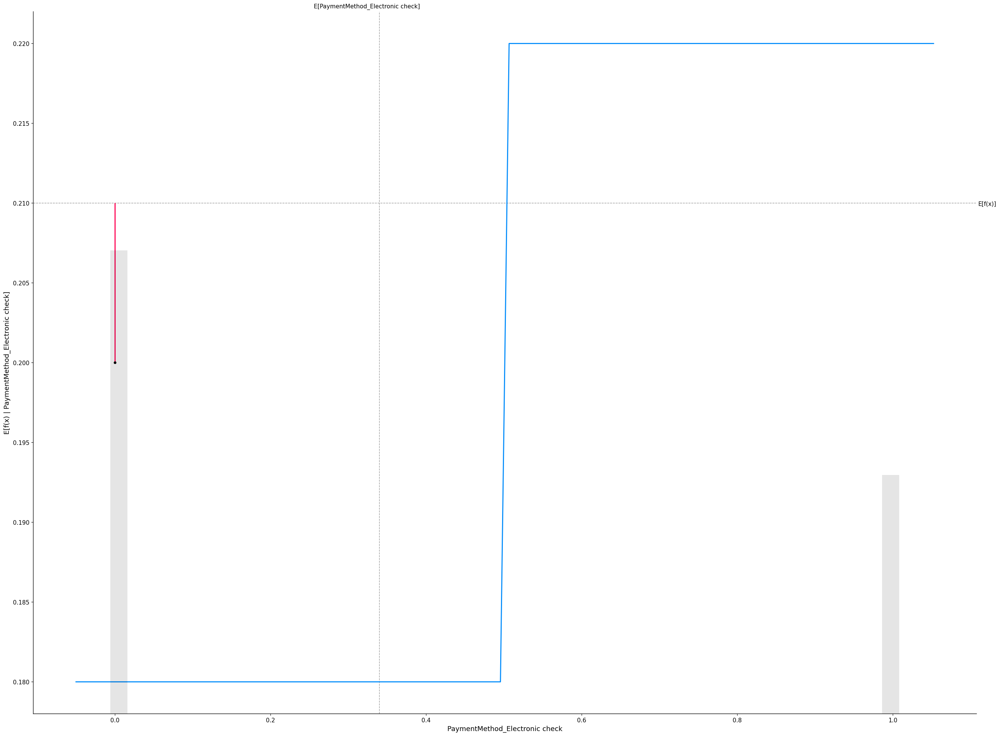

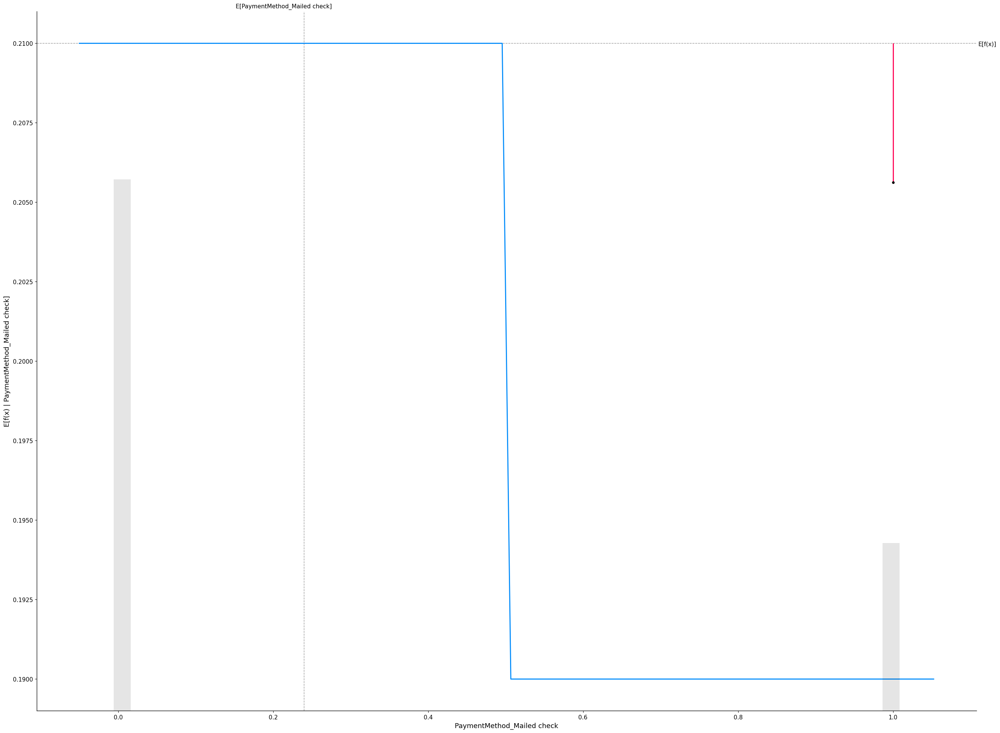

In [101]:
for i in x_train_100.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        model_rf.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=lr_shap_values[sample_ind : sample_ind + 1, :],
    )

# Interpret the summary plot Random Forest Model

Here the features are listed in descending order of their importance. This is one of the easiest ways to analyze an ML model and how the features are affecting the target and to what extent.

Each dot(both red and blue) represents a feature of a churn
Red color represents high values whereas blue color represents low value
If a dot(a feature of churn) is on the right side of the y-axis then it had a positive impact and if it is on the left side of the axis it had a negative impact
The position of a dot(a feature of churn) on the x-axis represents the intensity of impact it had, the more it is away from the axis greater the intensity.
Let us try to understand how the features are affecting the model.

Higher value of MonthlyCharges tends to have a negative impact,
Lower values of MonthlyCharges tends to have a positive impact on the churn and so on.
We could also interpret the intensity of impact

This visualization is very useful when it comes to interpreting how our model is working.

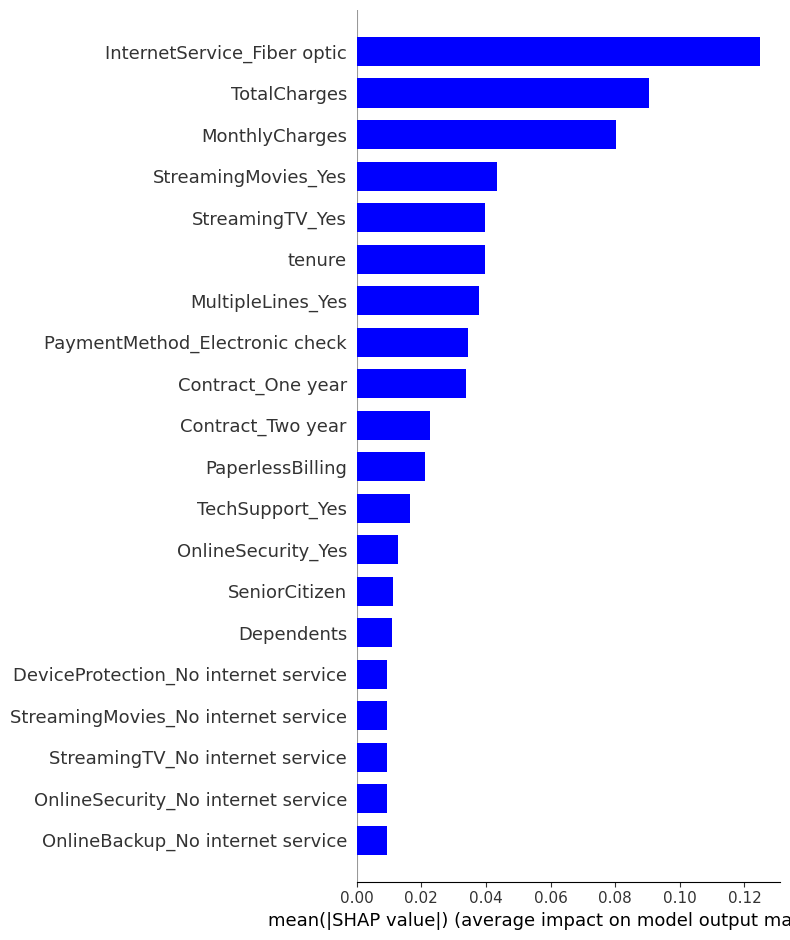

In [102]:
# SHAP variable importance for a Model
shap.summary_plot(linear_shap_values, X_train, plot_type="bar", color="blue")

In [ ]:
# SHAP variable importance for Tree based model
shap.summary_plot(tree_shap_values, X_train, plot_type="bar", color="blue")

# Interpret the summary plot for the Linear and Tree-based model
Here the features are listed in descending order of their importance. This helps ML model to analyze and how the features are affecting the target and to what extent.


* Each dot(both red and blue) represents a feature
* Red color represents high values whereas blue color represents low value
* If a dot is on the right side of the y-axis then it had a positive impact and if it is on the left side of the axis it had a negative impact
* The position of a dot on the x-axis represents the intensity of impact it had, the more it is away from the axis greater the intensity.


Higher value of TotalCharges tends to have a positive impact on the Churn.


/usr/local/lib/python3.9/dist-packages/shap/plots/_beeswarm.py:664: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



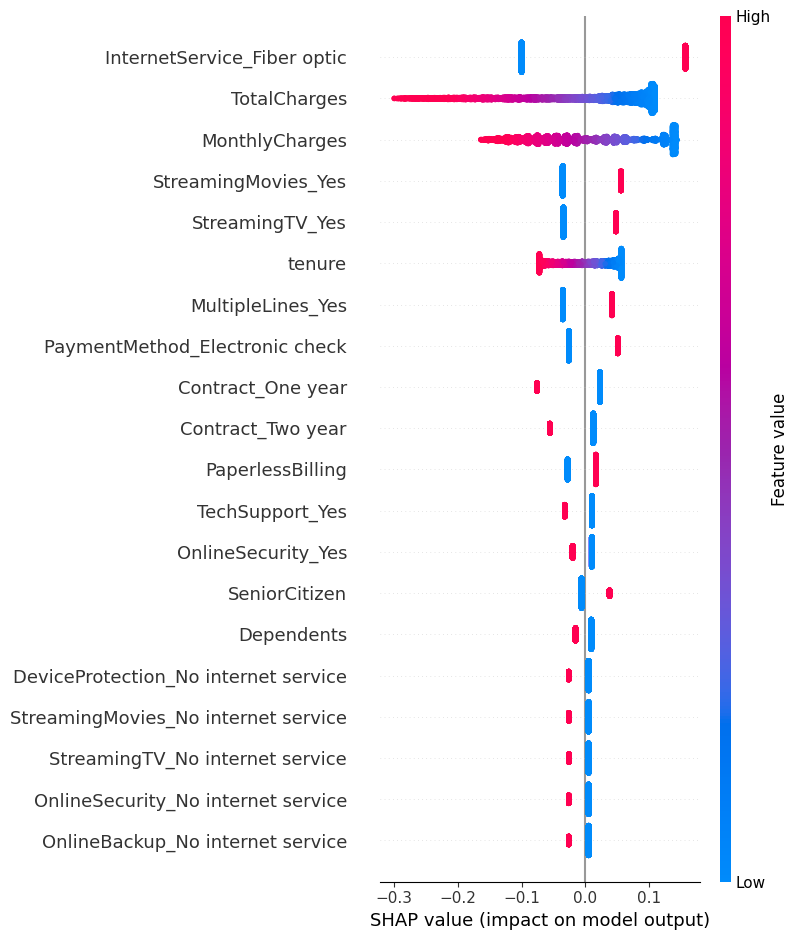

In [103]:
# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, X_train)

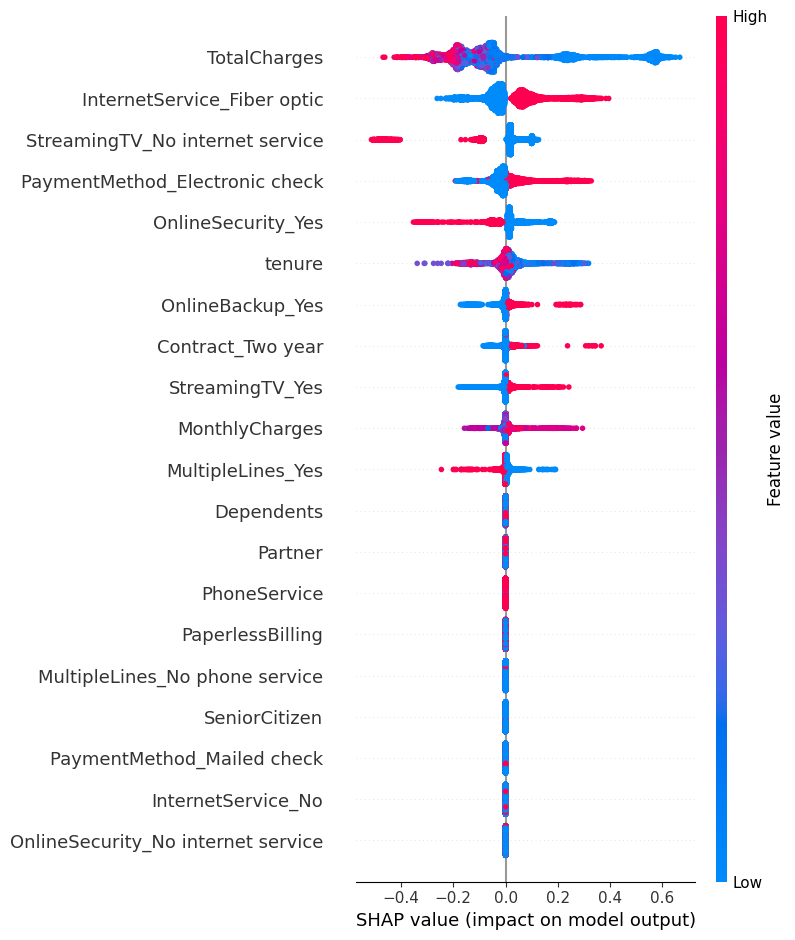

In [104]:
# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, X_train)

# Interpreting Waterfall SHAP visualization

Notice the value of TotalCharges in the waterfall model is the same as what we have in SHAP partial dependence plot. It says that f(x) = 0.363 is what we got as a model output and the expected output for this sample was 0.264. The graph shows that ToalCharges has the biggest and most negative impact in churn rate. Followed by Contract_OneYear had a negative impact and it bought the churn rate down.

Similarly we can interpret the tree-based model for the same sample.
Where the output we got was 0 and the expected output was 0.19. in the tree-based model, we just see that the magnitude of the impact made by individual features varies from what we had in a linear model. Here in the tree-based model, the output is majorly effected on tenure.

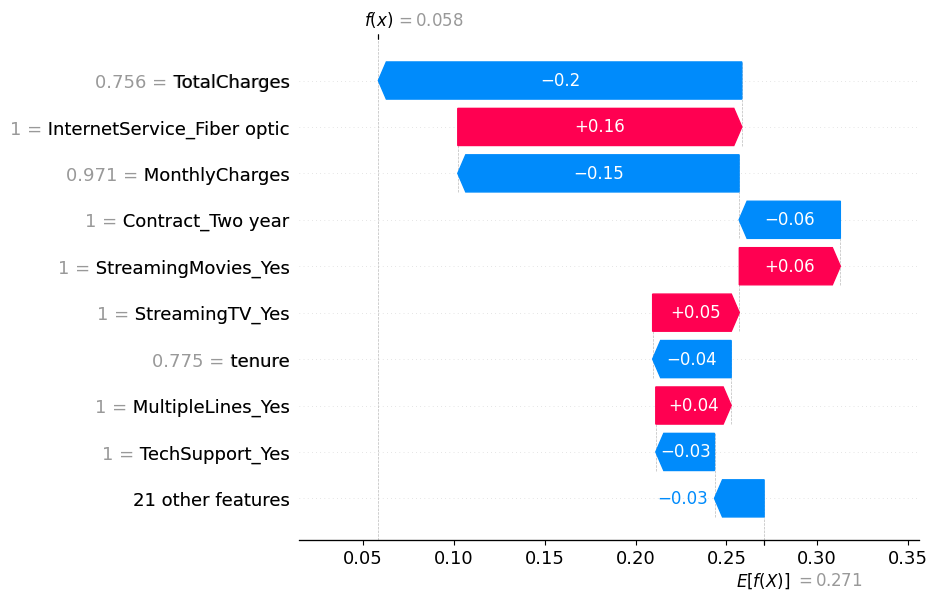

In [105]:
# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=10)

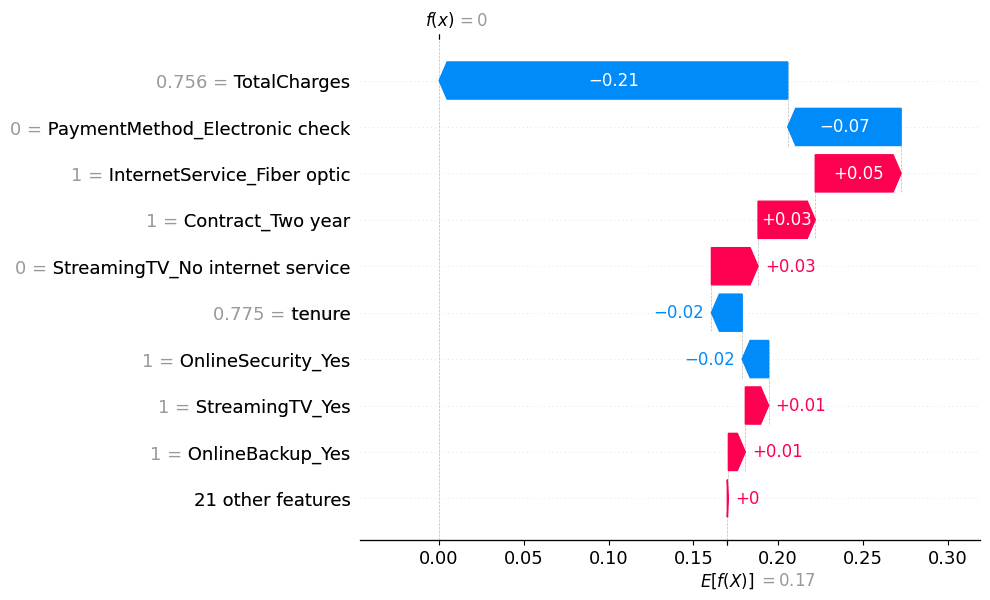

In [106]:
# Waterfall plot for Tree Based Model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=10)

## Interpreting SHAP dependence plot for Linear and Tree-based model
The SHAP dependence plot shows the marginal effect one or two features have on the predicted outcome of a machine learning model. It tells whether the relationship between the target and a feature is linear, monotonic, or more complex.

As we can observe the linear model feature and its SHAP value have a linear relationship. If a feature has a positive impact on the Churn rate then the relationship will be directly proportional to TotalCharges and MonthlyCharges vice versa.

For the tree-based model as observed the relationship between feature and its SHAP value is no longer linear. Now we see that the SHAP dependence plot no longer exactly matches the partial dependence plot because they are accounting for the interaction effects. 


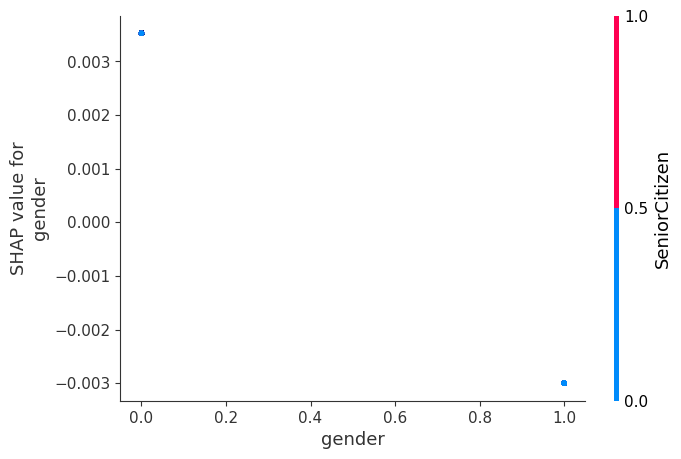

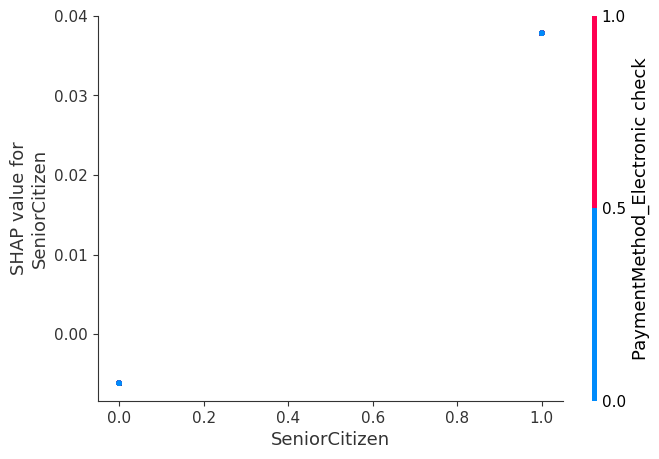

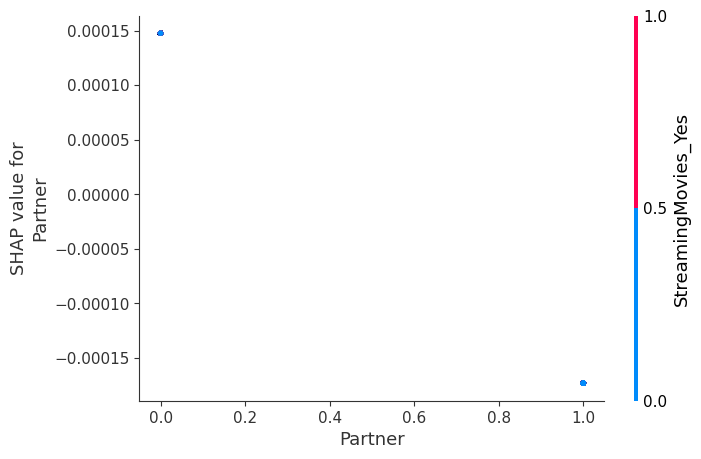

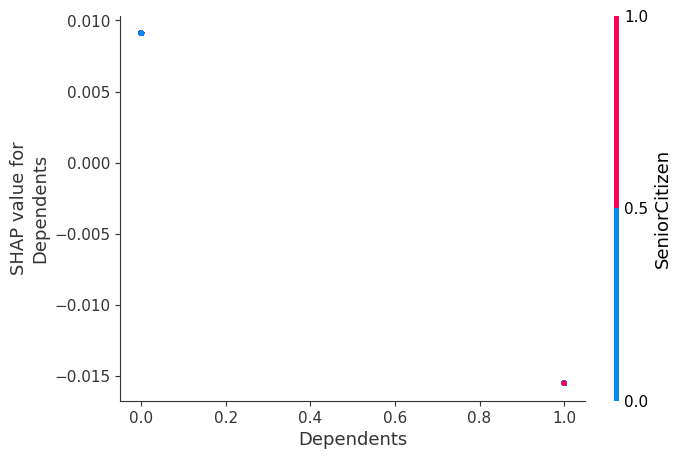

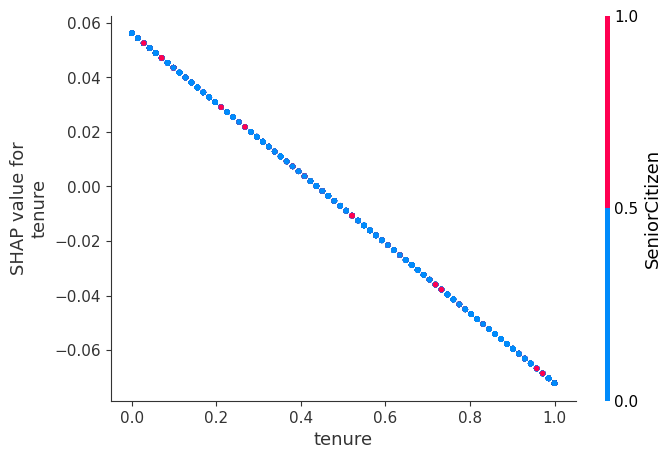

...

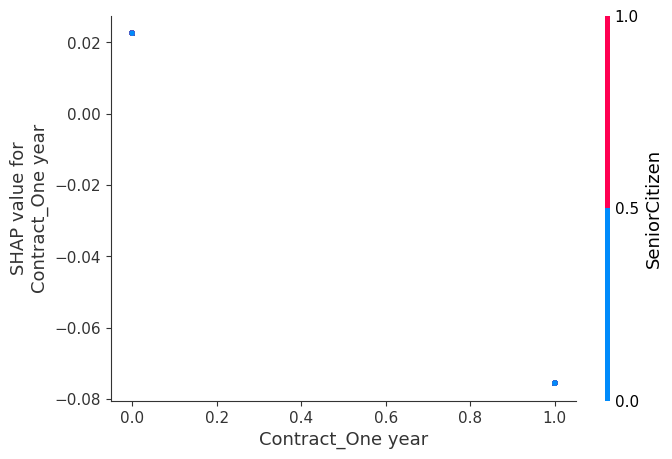

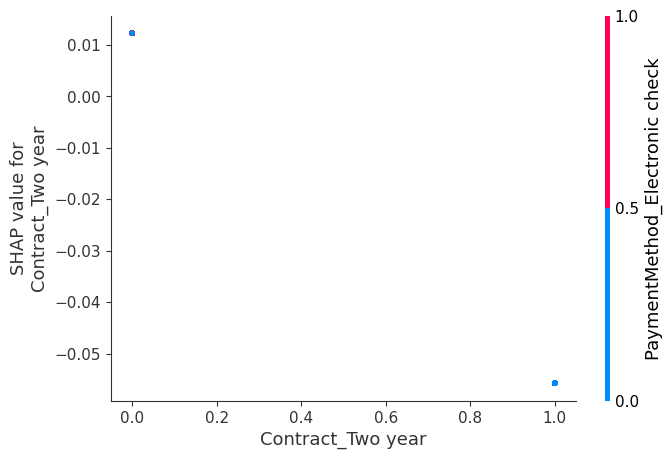

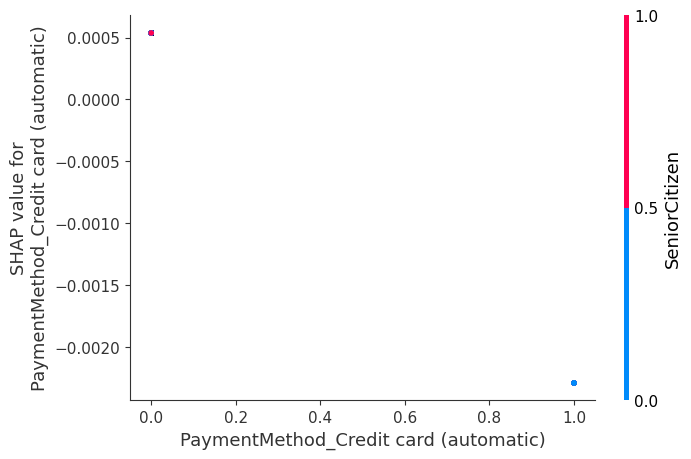

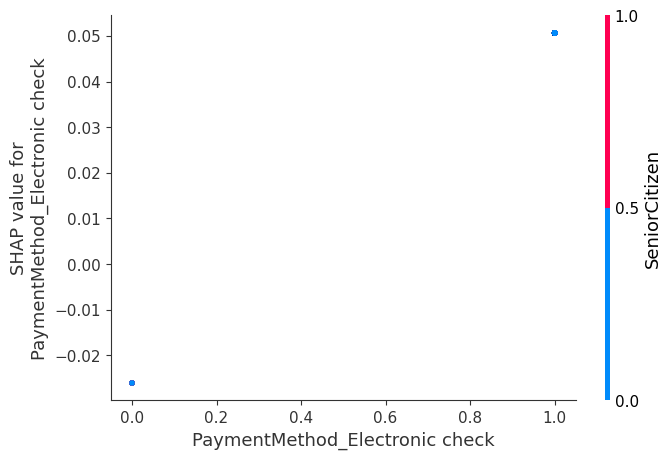

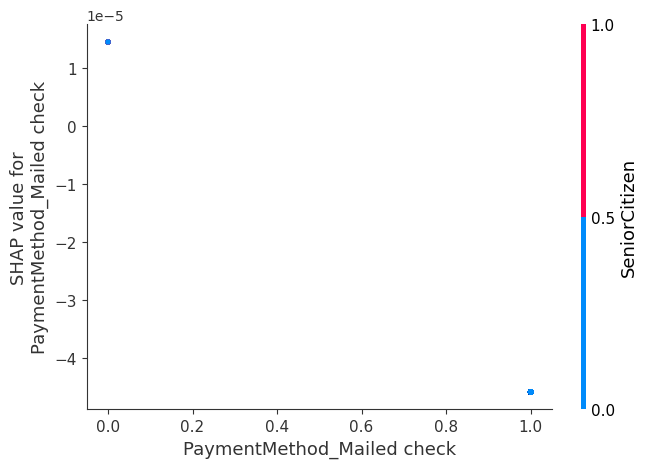

In [107]:
# SHAP partial dependence plot for linear model
for i in X_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, X_train)

## The below plot displays the distribution of importance for each variable as a standard violin plot.

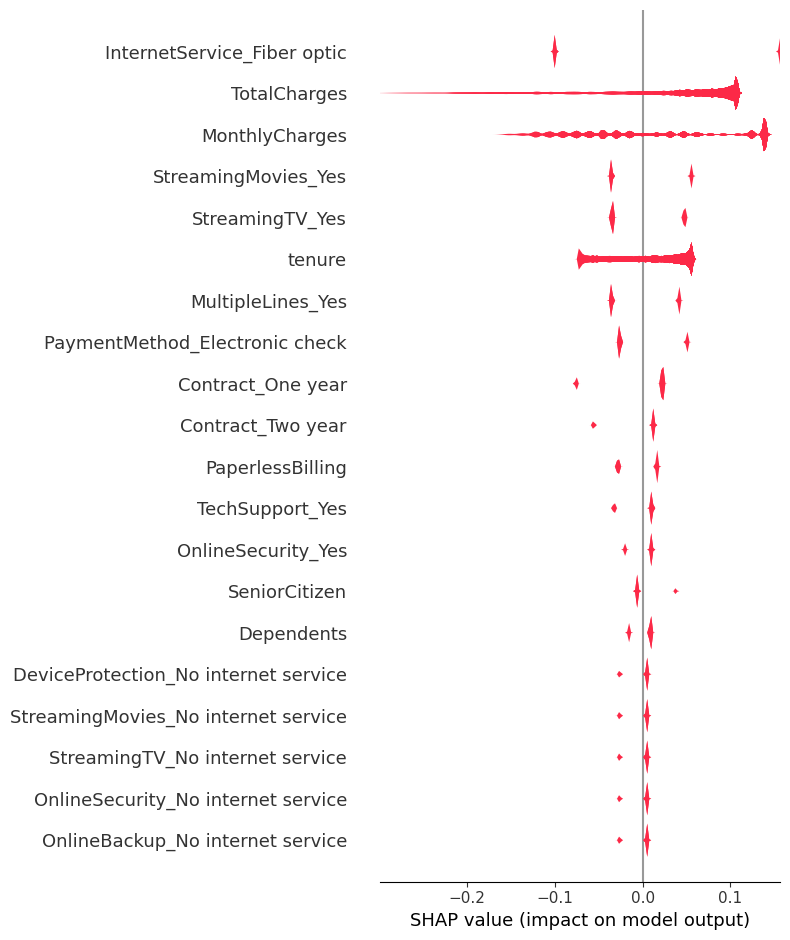

In [108]:
shap.summary_plot(linear_shap_values, plot_type="layered_violin", color='#FC2947')

/usr/local/lib/python3.9/dist-packages/shap/plots/_beeswarm.py:664: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



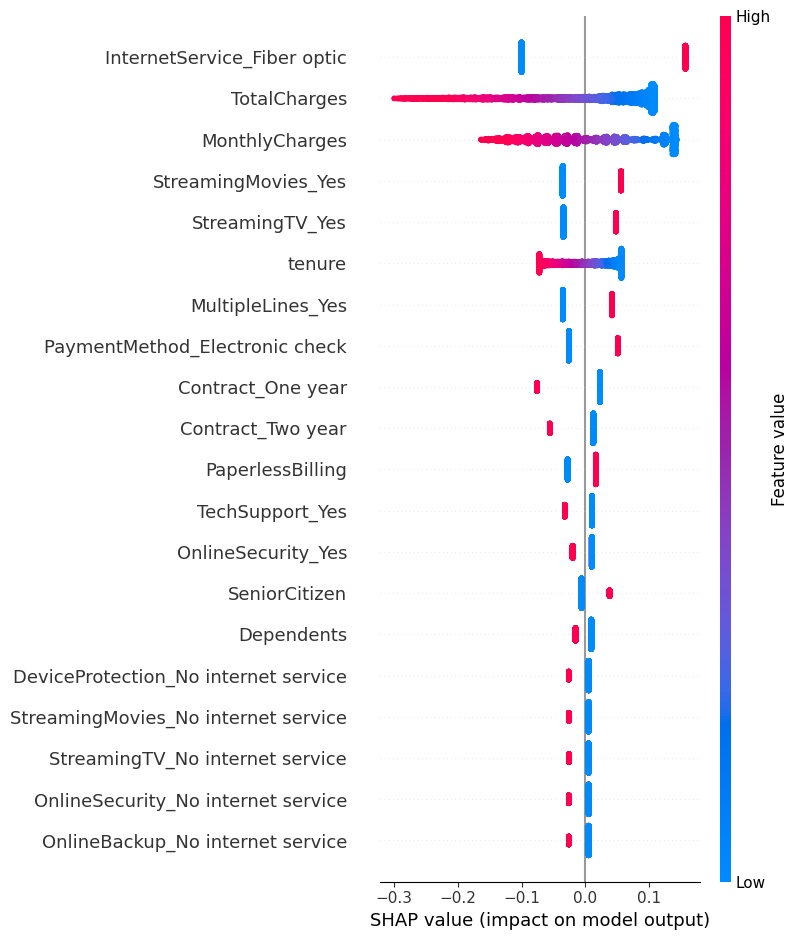

In [109]:
shap.summary_plot(shap_values = linear_shap_values,
                  features = X_train)

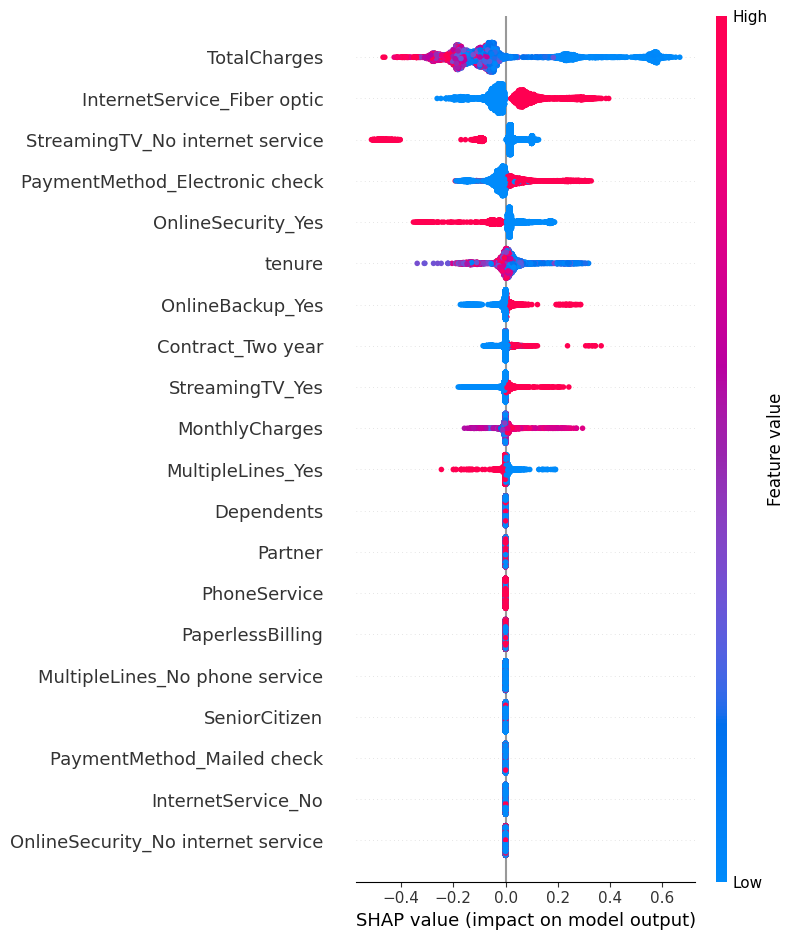

In [110]:
shap.summary_plot(shap_values = tree_shap_values,
                  features = X_train)

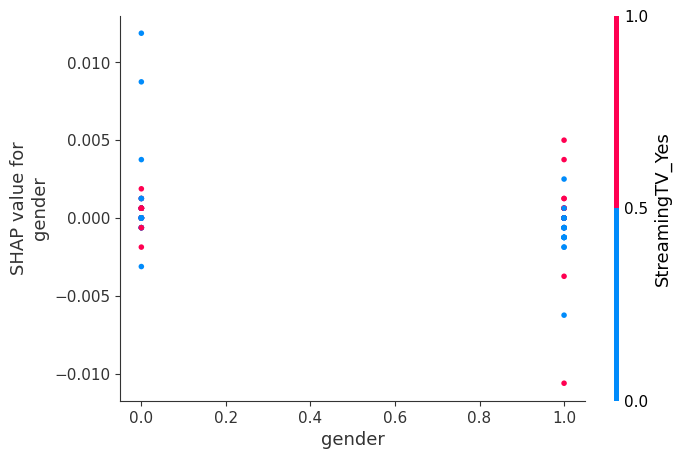

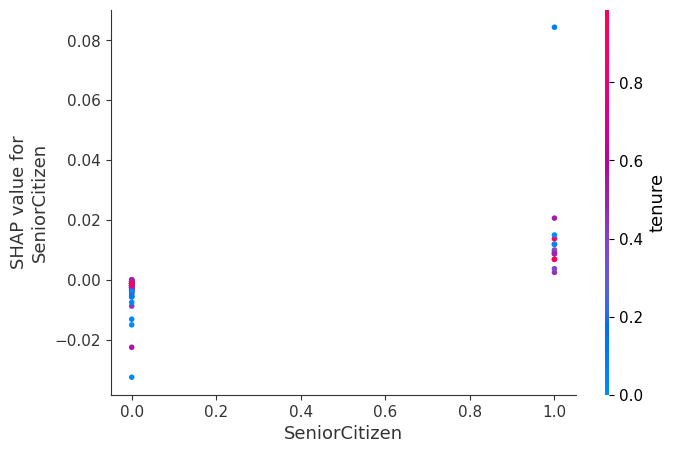

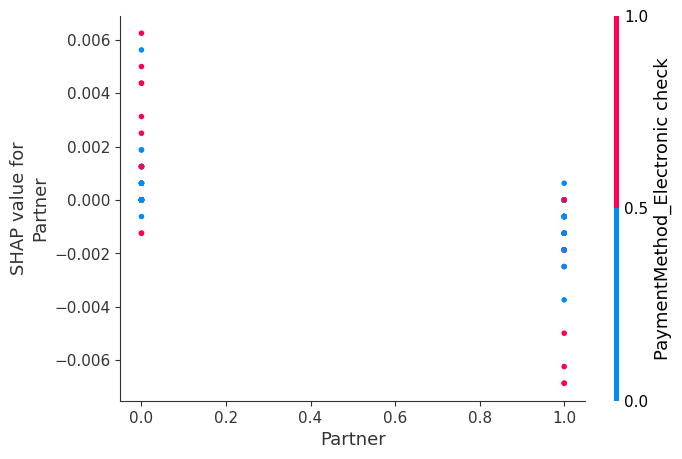

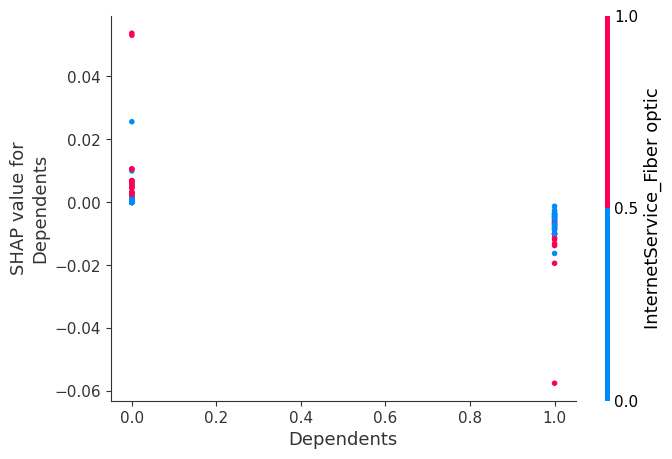

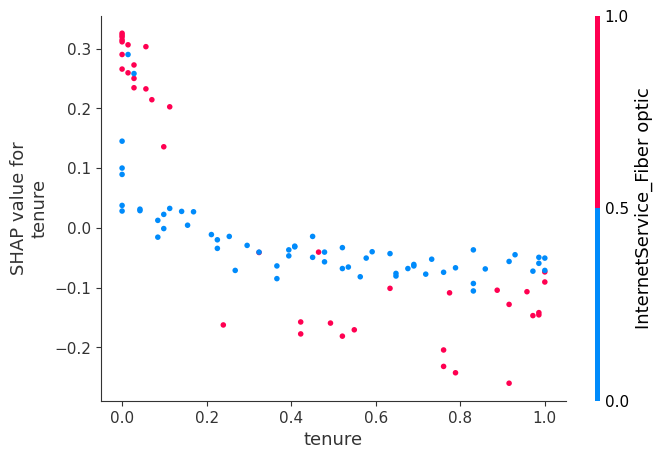

...

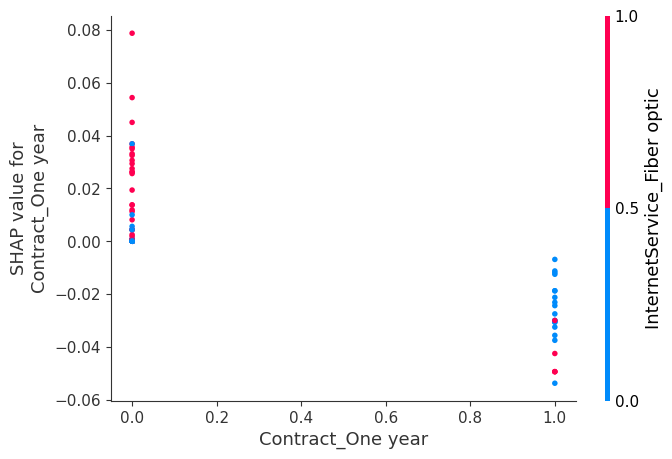

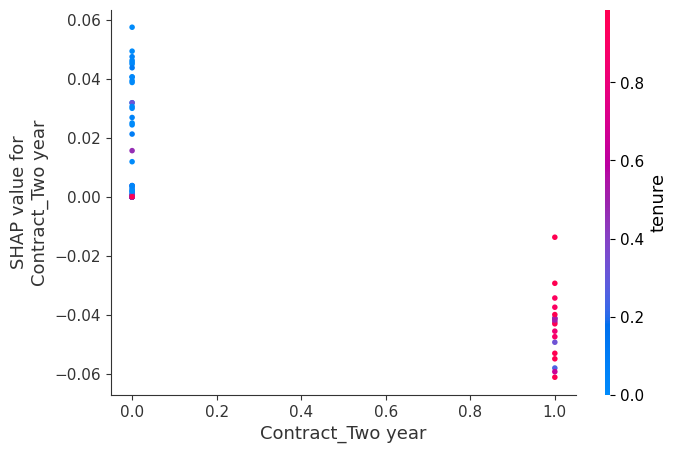

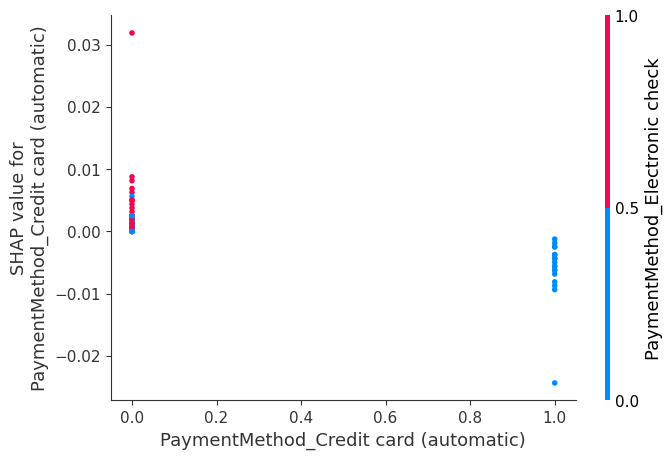

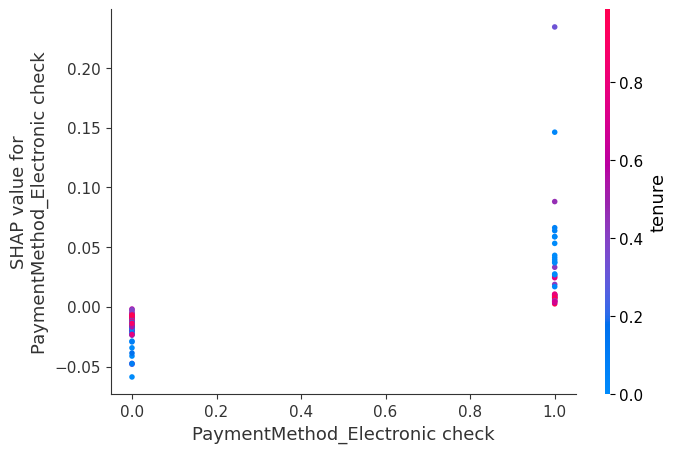

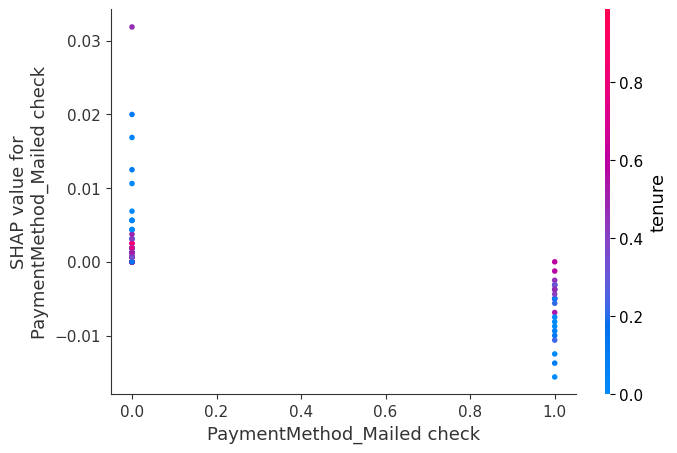

In [111]:
# SHAP partial dependence plot for a tree based model
for i in X_train.columns:
    shap.dependence_plot(i, lr_shap_values.values, x_train_100)

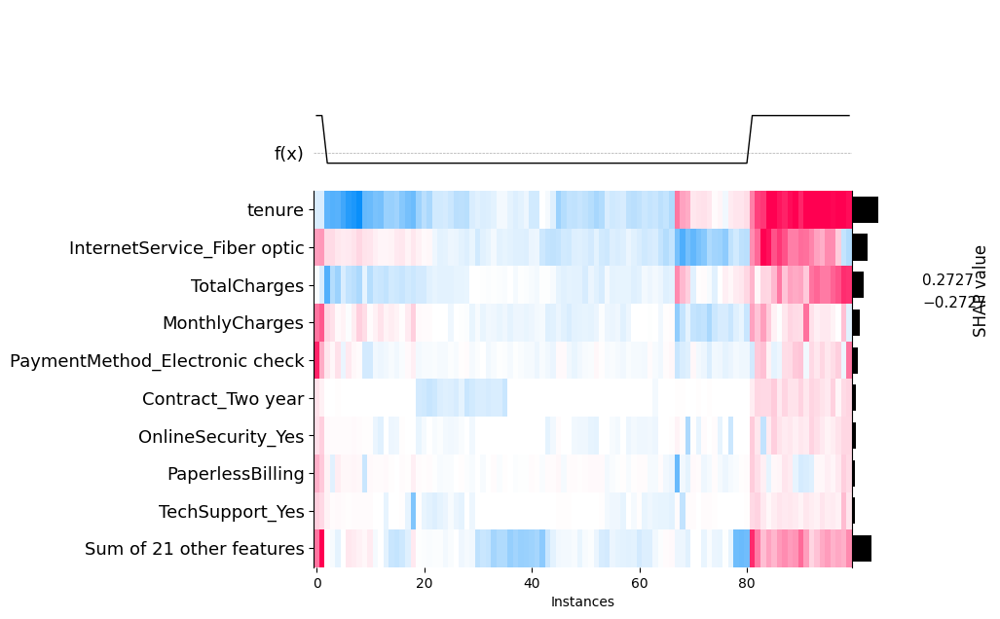

In [112]:
shap.plots.heatmap(lr_shap_values)  # SHAP HeatMap of a Tree Based Model

# Conclusion for AutoML:

As a result, for classification, to predict the target variable "Churn" the XGBoost is the one having the best performance. VIF, p-values and other tests were considered to ignore for the independent variables because it has very less continuous variables in the dataset, so cannot expect best r2 square, multicollinearity for the model. Also tried with specific automl model but could n't generate a best model.

Hence with H2O.ai data deployement has been done and best accuracy has been generated for the Telco customer churn dataset.

# Measures for Reducing Customer Churn & Revenue Increase

* 3 sorts of clients should be targeted: senior citizens, people living with a partner, and people living alone!

* Although the number of SeniorCitizen clients is small, their monthly charge limit is higher than that of other consumers. As a result, SeniorCitizen clients are willing to pay top money, but they must be catered to with that degree of quality. clients with a Partner and clients living alone prefer services with MonthlyCharges under 65.

* In order to build a significant customer base, a telecommunications company must provide an easy and reasonable entry point for their services. For the first six months, it must focus heavily on OnlineSecurity, OnlineBackup, DeviceProtection, and TechSupport because this is the most critical and uncertain period for clients. They must lower the churn tenure of 40 - 50 months for these services!.

* Once they have established a robust pipeline of customer support services, they must promote the use of MultipleLines and Fiber Optic connections for the PhoneService and InternetService, respectively. However, the starting point for these two services is 75+ in MonthlyCharges.

* As a result, they must design combinations of PhoneService and InternetService options with average MonthlyCharges in the range of 100 - 120:
No multiple lines + multiple lines of optical fiber + DSL

* This will enhance a user's average income because it eliminates the option of selecting a combination of No MultipleLines + DSL, which has a mean MonthlyCharge of 60 - 70

* StreamingTV and StreamingMovies must be made more affordable while also minimizing churn. The content of these services should be designed to appeal to a wide range of clients. This should be followed by a simple and painless payment method.

* Due to significant churn, electronic checks should be phased out in favor of bank transfer (automatic) and credit card (automatic) payments! However, they will be challenged to reduce the median churn duration of these two payment methods, which is more than 20 months, which is double the churn tenure of electronic checks.

* The lower limit of an electronic check is around 60, whereas the lower limit of a bank transfer (automatic) and a credit card (automatic) is approximately 20 in MonthlyCharges. PaperlessBilling is another pricey feature that starts at $60, whilst the other options start at $20 in MonthlyCharges.

* When the MonthlyCharges for any single service reach 70, clients become extremely concerned about their MonthlyCharges. The Telco Company's USP should be service quality! These strategies will both increase revenue and enhance the present value delivery process

* This is a great dataset that gives an opportunity to peak into the real world business problem and can be dealt with the Data Science techniues.

* Insights gained from the EDA are very valuable for understanding the effectiveness of the existing systems that are in place. They also assist in drawing up plans & measures to counter the problems or be in an infinite loop fo improvement.

* SMOTE analysis is used for data balancing. Combinations of undersampling and oversampling can be employed as well. Undersampling was tried out for this problem but it landed the F1 Score (Churn) in the range of 60 - 70 %. There are other data balancing methods available as well.

* When it comes to model performance, feature creation by combining features was carried out however, they did not outperform the current models. Hyperparamter tuning & outlier detection could also bump up the F1 Score (Churn) & Cross Validation Score. Stack of models pipped the XGBClassifier & LGBMClassifier by a margin of 0.01 for F1 Score (Churn).

# Final Takeaways

* The best model for this assignment is AutoML's best model with its Hyperparameters tweaked because it has the highest accuracy compared to the other models examined in this exercise. Also, this model is interpretable, which means we can get to the bottom of what caused this prediction to occur.

# Learning Outcomes

* I learned the entire lifecycle of a Data Science project, from data preparation to hyperparameter tuning. 
* The majority of the time should be spent on data preparation, which includes cleaning the data, normalizing, feature selection, imputation, and so on. 
* Hyperparameter tuning is the second most important thing after data preparation, which most practitioners overlook. However, the end effect is well worth the effort.
* Multiple models must be trained, and the best models must be chosen for deployment, as certain algorithms perform significantly better than others on specific tasks. The best takeaway from this sequence of exercises is Model Interpretation. SHAP, LIME, and PDP have simplified understanding of what causes a model to predict an outcome.

#References

https://www.h2o.ai/products/h2o-automl/

https://medium.com/analytics-vidhya/gentle-introduction-to-automl-from-h2o-ai-a42b393b4ba2

https://docs.h2o.ai/

https://towardsdatascience.com/a-deep-dive-into-h2os-automl-4b1fe51d3f3e



###Licences:

MIT License


Copyright (c) 2023 Anusree Myneni


Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:


The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.


THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE